In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from IPython.display import Image

import astropy.constants as cs
import os
import shutil

import astropy.io.fits as pyfits

import hstscan.pipeline as pipe
import hstscan.reduction as r
import hstscan.data as data
from hstscan.data import view_frame_image as view
import tqdm
import glob
import csv

# Setup for light-curve reduction

### 1) Download data
https://archive.stsci.edu/hst/search.php

\_ima files for all data

\_drz and \_flt files for the direct images (taken with Filters instead of Grism)

In [2]:
# data_dir: directory where the _ima files are stored
Dir = '/Users/bob/Documents/PhD/HAT-P-2b/'
data_dir = Dir + 'HSTdata/'
output_dir = Dir + 'output/'

conf_file_red = Dir + 'transmission_reduction.conf'
conf_file_ext = Dir + 'transmission_extraction.conf'

#Define a table of custom knots. A row for each subexposure. 
#If you haven't created this yet, please run the remainder of this code to find out the best knots.
#To do this, you need to set custom_knots_F=None, custom_knots_R=None in all extraction functions.
#Then create your own table with *interior* knots in ascending order
custom_knots = []
import csv
custom_knots = []
if os.path.isfile(Dir + 'custom_knots.csv'):
    with open(Dir + 'custom_knots.csv', 'rb') as csvfile:
        spamreader = csv.reader(csvfile, delimiter=',')
        for row in spamreader:
            row = np.array(row)
            custom_knots.append(row[row != ''].astype(float))
    noknots=False
else:
    noknots=True

### 2) Produce visit information lists

At this point it makes sense to re-name the visit files to more appropriate names, e.g. visit_26.lis -> transit.lis. This is not necessary, though.

The above code only needs to be run once after you've downloaded the data. So, you may disable the above code, as it's kinda slow.

### 3) Define a list of reference files

These reference files are used to calculate the absolute wavelength solution. They are typically the first grism exposures of each visit. Each visit should have at least one reference exposure.

In [3]:
#ref_Images = ['ied101adq_ima.fits', 'ied102hwq_ima.fits']
#ref_Images = ['ied101dnq_ima.fits', 'ied102m8q_ima.fits']
ref_Images = ['ied102m8q_ima.fits', 'ied102m8q_ima.fits']

### 4) Fit direct image positions to produce position catalogues

Only a single star should be fully inside the second image.

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102jxq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102jxq_flt.fits
Shape (512, 512)


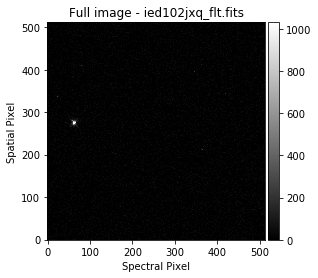

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.166e+05        0      inf    52.29     True     None     None
x_mean        63.26        0      512 0.0003093     True     None     None
x_stddev     0.6859        0      inf 0.0003181     True     None     None
y_mean        275.2        0      512 0.0003124     True     None     None
y_stddev     0.6706        0      inf 0.0002959     True     None     None


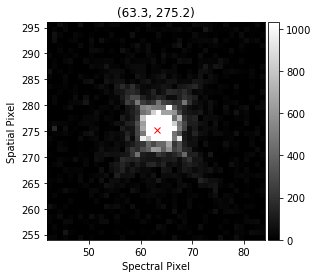

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101h7q_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101h7q_flt.fits
Shape (512, 512)


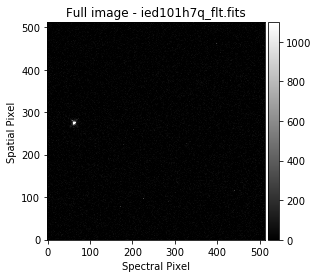

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.235e+05        0      inf    50.86     True     None     None
x_mean        63.34        0      512 0.0002787     True     None     None
x_stddev     0.6919        0      inf 0.0003381     True     None     None
y_mean        275.1        0      512 0.0003072     True     None     None
y_stddev      0.609        0      inf 0.0002061     True     None     None


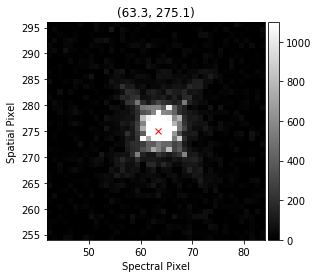

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101abq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101abq_flt.fits
Shape (512, 512)


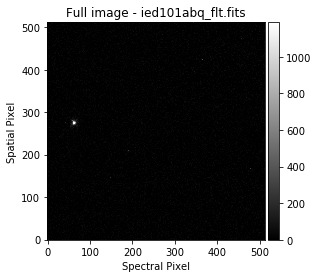

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.294e+05        0      inf    55.81     True     None     None
x_mean        63.23        0      512 0.0003127     True     None     None
x_stddev     0.6494        0      inf 0.0002959     True     None     None
y_mean        275.2        0      512 0.0003225     True     None     None
y_stddev     0.6209        0      inf 0.0002588     True     None     None


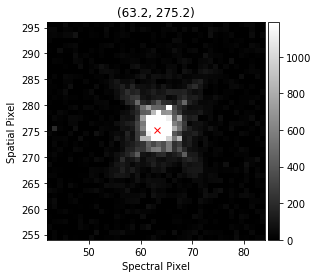

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101ccq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101ccq_flt.fits
Shape (512, 512)


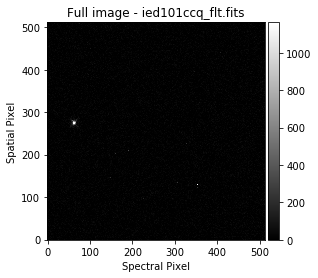

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.257e+05        0      inf    55.97     True     None     None
x_mean        63.26        0      512 0.0003238     True     None     None
x_stddev     0.6653        0      inf 0.000328     True     None     None
y_mean        275.1        0      512 0.0003443     True     None     None
y_stddev     0.6056        0      inf 0.0002471     True     None     None


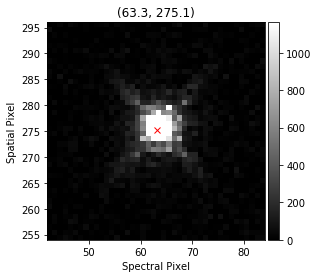

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102kzq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102kzq_flt.fits
Shape (512, 512)


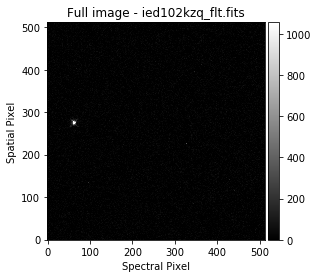

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.179e+05        0      inf    55.15     True     None     None
x_mean        63.26        0      512 0.0003291     True     None     None
x_stddev     0.6897        0      inf 0.0003342     True     None     None
y_mean        275.2        0      512 0.0003323     True     None     None
y_stddev     0.6533        0      inf 0.0002996     True     None     None


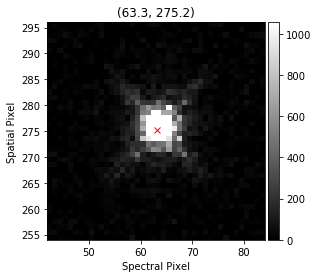

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101euq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101euq_flt.fits
Shape (512, 512)


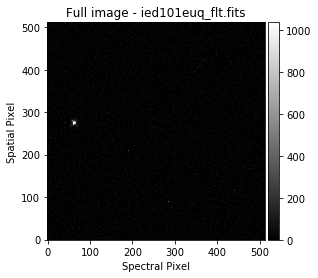

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.228e+05        0      inf    52.95     True     None     None
x_mean        63.39        0      512 0.0002874     True     None     None
x_stddev     0.7141        0      inf 0.0003665     True     None     None
y_mean        275.1        0      512 0.0003154     True     None     None
y_stddev     0.6091        0      inf 0.0002179     True     None     None


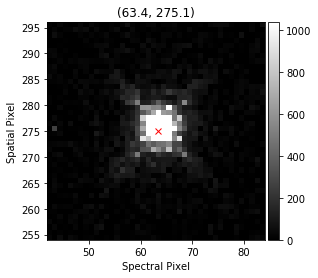

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102ivq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102ivq_flt.fits
Shape (512, 512)


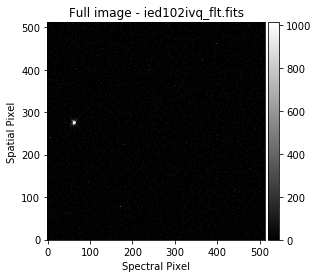

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.152e+05        0      inf    52.72     True     None     None
x_mean        63.24        0      512 0.0003141     True     None     None
x_stddev     0.6861        0      inf 0.0003083     True     None     None
y_mean        275.3        0      512 0.0003089     True     None     None
y_stddev     0.6846        0      inf 0.0003251     True     None     None


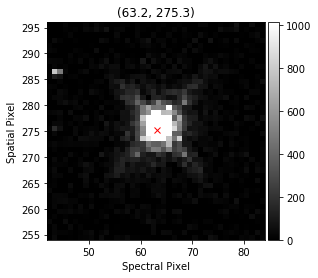

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102jfq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102jfq_flt.fits
Shape (512, 512)


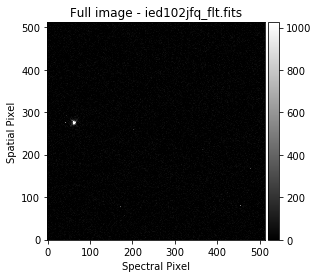

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.153e+05        0      inf    51.98     True     None     None
x_mean        63.21        0      512 0.0003159     True     None     None
x_stddev     0.6692        0      inf 0.0002911     True     None     None
y_mean        275.3        0      512 0.0003114     True     None     None
y_stddev     0.6983        0      inf 0.0003309     True     None     None


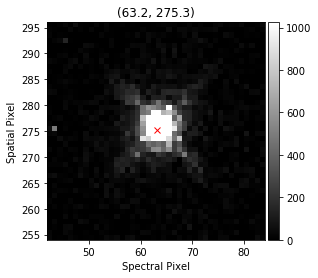

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lhq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lhq_flt.fits
Shape (512, 512)


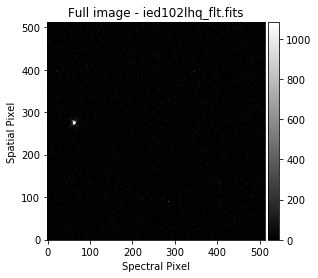

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.196e+05        0      inf    54.83     True     None     None
x_mean        63.24        0      512 0.0003249     True     None     None
x_stddev     0.6753        0      inf 0.0003168     True     None     None
y_mean        275.2        0      512 0.0003272     True     None     None
y_stddev     0.6534        0      inf 0.0002974     True     None     None


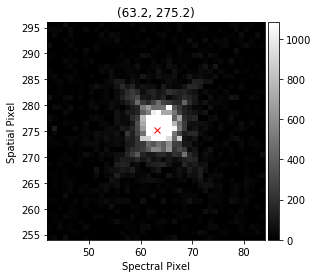

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102myq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102myq_flt.fits
Shape (512, 512)


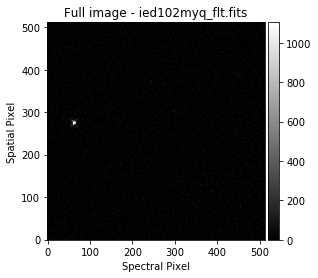

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.195e+05        0      inf    54.04     True     None     None
x_mean        63.27        0      512 0.0003273     True     None     None
x_stddev     0.6804        0      inf 0.0003431     True     None     None
y_mean        275.1        0      512 0.0003451     True     None     None
y_stddev     0.6216        0      inf 0.0002525     True     None     None


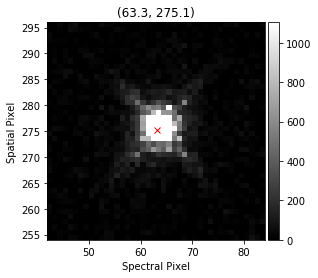

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101buq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101buq_flt.fits
Shape (512, 512)


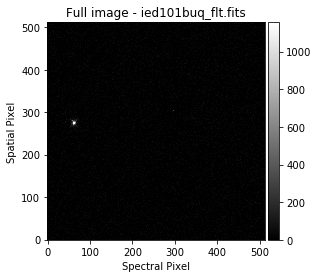

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.261e+05        0      inf    56.54     True     None     None
x_mean        63.28        0      512 0.0003215     True     None     None
x_stddev     0.6784        0      inf 0.0003455     True     None     None
y_mean        275.1        0      512 0.0003485     True     None     None
y_stddev      0.596        0      inf 0.0002384     True     None     None


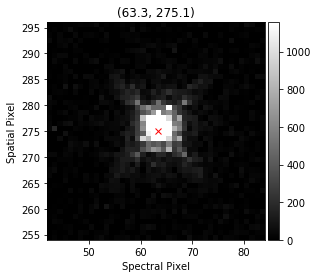

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lzq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lzq_flt.fits
Shape (512, 512)


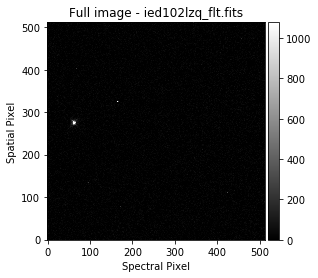

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.191e+05        0      inf    66.49     True     None     None
x_mean        63.25        0      512 0.0003984     True     None     None
x_stddev     0.6817        0      inf 0.000395     True     None     None
y_mean        275.2        0      512 0.0004037     True     None     None
y_stddev     0.6487        0      inf 0.0003536     True     None     None


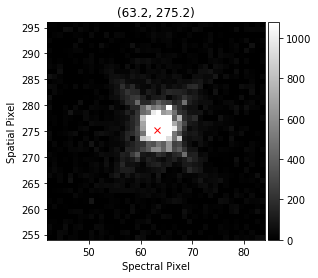

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101dcq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101dcq_flt.fits
Shape (512, 512)


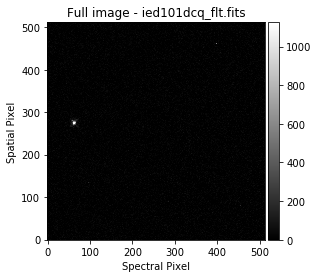

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.244e+05        0      inf    53.64     True     None     None
x_mean        63.31        0      512 0.0003034     True     None     None
x_stddev     0.6884        0      inf 0.0003408     True     None     None
y_mean        275.1        0      512 0.000328     True     None     None
y_stddev     0.6058        0      inf 0.0002277     True     None     None


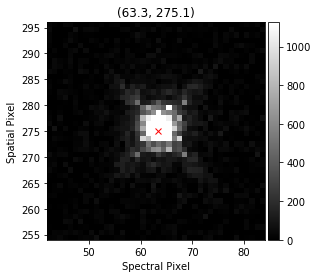

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102idq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102idq_flt.fits
Shape (512, 512)


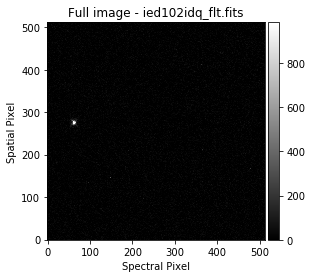

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.13e+05        0      inf    51.73     True     None     None
x_mean        63.24        0      512 0.0003144     True     None     None
x_stddev     0.6903        0      inf 0.0003066     True     None     None
y_mean        275.3        0      512 0.0003081     True     None     None
y_stddev     0.6986        0      inf 0.0003363     True     None     None


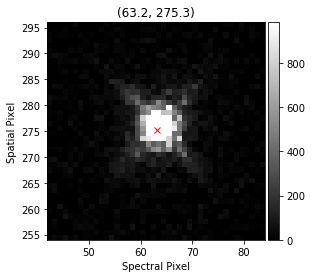

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101bcq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101bcq_flt.fits
Shape (512, 512)


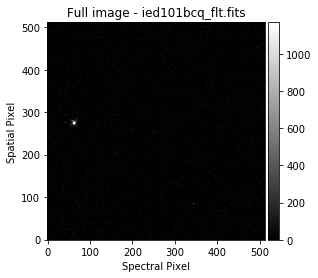

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.263e+05        0      inf    56.75     True     None     None
x_mean        63.27        0      512 0.0003293     True     None     None
x_stddev     0.6764        0      inf 0.000347     True     None     None
y_mean        275.1        0      512 0.000359     True     None     None
y_stddev     0.5879        0      inf 0.0002357     True     None     None


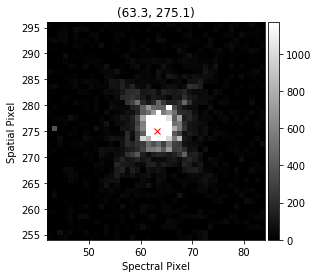

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102mhq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102mhq_flt.fits
Shape (512, 512)


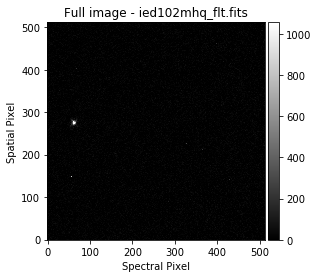

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.211e+05        0      inf    60.92     True     None     None
x_mean        63.32        0      512 0.0003503     True     None     None
x_stddev     0.7187        0      inf 0.0003968     True     None     None
y_mean        275.2        0      512 0.0003665     True     None     None
y_stddev      0.608        0      inf 0.0002871     True     None     None


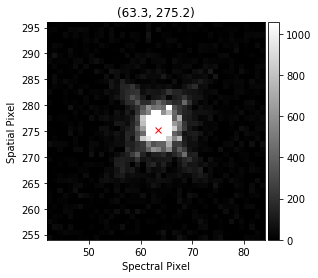

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101duq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101duq_flt.fits
Shape (512, 512)


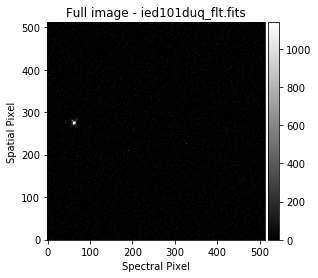

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.243e+05        0      inf    53.64     True     None     None
x_mean        63.28        0      512 0.0003059     True     None     None
x_stddev     0.6709        0      inf 0.0003306     True     None     None
y_mean        275.1        0      512 0.0003301     True     None     None
y_stddev     0.6069        0      inf 0.0002288     True     None     None


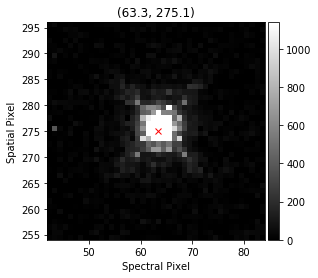

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102hvq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102hvq_flt.fits
Shape (512, 512)


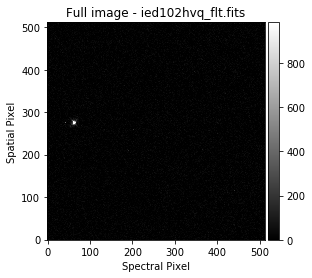

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.126e+05        0      inf    50.84     True     None     None
x_mean        63.23        0      512 0.0003112     True     None     None
x_stddev     0.6865        0      inf 0.000299     True     None     None
y_mean        275.3        0      512 0.0003054     True     None     None
y_stddev     0.7036        0      inf 0.0003356     True     None     None


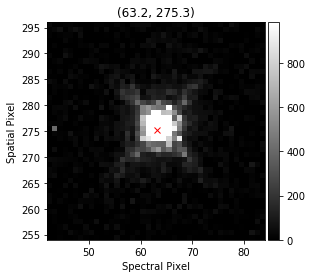

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102kfq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102kfq_flt.fits
Shape (512, 512)


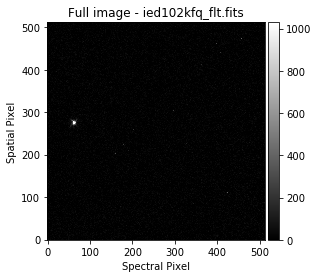

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.167e+05        0      inf    56.87     True     None     None
x_mean        63.28        0      512 0.0003399     True     None     None
x_stddev     0.7071        0      inf 0.0003583     True     None     None
y_mean        275.2        0      512 0.0003414     True     None     None
y_stddev     0.6455        0      inf 0.000309     True     None     None


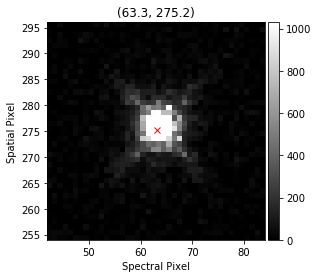

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101auq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101auq_flt.fits
Shape (512, 512)


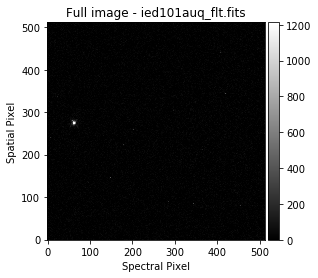

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.297e+05        0      inf    55.94     True     None     None
x_mean        63.23        0      512 0.0003236     True     None     None
x_stddev     0.6518        0      inf 0.000308     True     None     None
y_mean        275.1        0      512 0.0003414     True     None     None
y_stddev     0.6035        0      inf 0.0002423     True     None     None


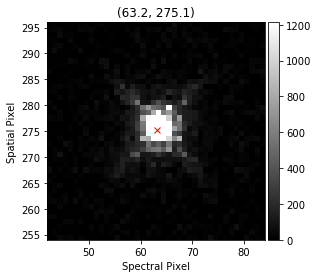

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101gdq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101gdq_flt.fits
Shape (512, 512)


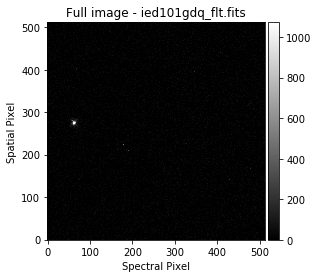

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.219e+05        0      inf    54.09     True     None     None
x_mean        63.35        0      512 0.0003066     True     None     None
x_stddev      0.707        0      inf 0.0003681     True     None     None
y_mean        275.1        0      512 0.0003337     True     None     None
y_stddev     0.6045        0      inf 0.0002277     True     None     None


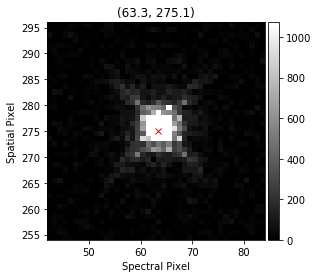

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101cuq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101cuq_flt.fits
Shape (512, 512)


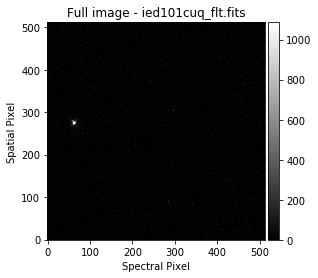

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.233e+05        0      inf    57.16     True     None     None
x_mean        63.34        0      512 0.0003231     True     None     None
x_stddev     0.7088        0      inf 0.0003791     True     None     None
y_mean        275.1        0      512 0.000351     True     None     None
y_stddev     0.5958        0      inf 0.0002436     True     None     None


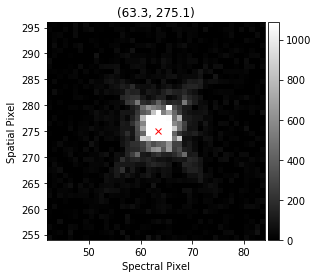

Writing to: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101ecq_flt_1.cat
/Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied101ecq_flt.fits
Shape (512, 512)


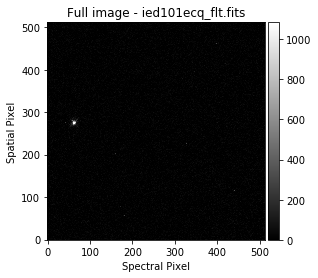

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
amplitude  1.236e+05        0      inf    56.86     True     None     None
x_mean        63.35        0      512 0.0003126     True     None     None
x_stddev     0.7032        0      inf 0.0003771     True     None     None
y_mean        275.1        0      512 0.0003433     True     None     None
y_stddev     0.5975        0      inf 0.0002376     True     None     None


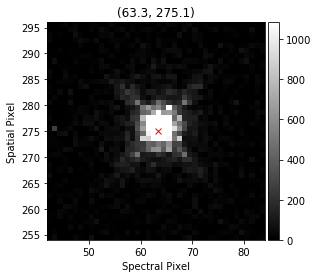

In [4]:
reload(pipe)
# gridsize: coarseness of initial search for source
# nstars: number of stars for which positions should be measured (in order of brightness)
# use_ima: use _ima files instead of _flt in case of problems
pipe.create_orbit_cats_gauss(data_dir=data_dir, conf_file=conf_file_red, gridsize=21, use_ima=False, nstars=1)

Now have everything you need to reduce an exposure and produce spectra

# Config file parameters

## Red

### Parameters to define yourself
 - source_dir
 - save_dir
 - scan_rate
 - bg_x,y,w,h
 - flat_file_g141
 - conf_file_g141
 - ref_exp
 - stellar_spectrum (PHOENIX model. TBF @ http://phoenix.astro.physik.uni-goettingen.de/?page_id=15) from https://arxiv.org/pdf/1303.5632.pdf
     You could also use a .txt file with one column of wavelengths in Angstrom and one of Flux in erg/s/cm^2/A. This file should have a one-line-header. This is useful if you want to use an ATLAS spectrum.
 - stellar_wavelengths (file with the PHOENIX model wavelength definition)
 - HST_EPH_FILE The file with the ephemerides of HST. Downloadable from https://ssd.jpl.nasa.gov/horizons.cgi#top. See the example below

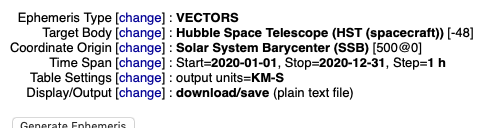

In [5]:
Image(filename = "ephemeris_example.png", width = 600, height = 300)

### Leave
These you are unlikely to want to change, although their effects are important
 - scanned = True
 - units = True
 - read_noise = 20
 - skip_start = 1
 - skip_end = 0
 - bg = True
 - bg_area = True
 - cr_local = True
 - dispersion = True
 - flat_field = True
 - ff_min = 0.5
 - contam_thresh = 0.01
 - nysig = 5
 - abs_wshift = True   #Whether to calculate the wavelength solution from the grism transmission fct.
 - peak = False
 - zeroth_ord_wshift = False
 - wshift_from_postarg = False
 - stel_spec_gauss_kern_sig = 1
 - tai_utc_file
 
### Cosmic Rays
You may want to experiment with cosmic ray removal parameters, can turn off cosmic ray removal for a first run
 - cr_tolx = 5 (try to lower without removing spectrum)
 - cr_tolx = 5
 - cr_x,y (consider tweaking if CR removal too agressive/weak)
 - cr_thresh = 50 (can raise) (determines the flux level threshold for cosmic ray detection)

### Data quality flags
Lookup flags in data handbook. 4: Bad detector pixel, 32: IR unstable pixel.

Leave as is unless there are problems.
 - dq_flags = [4,32]
 - dq_replace = None
 - dq_mean_width = 1
 
### Wavelength Solution
For now, disable the Tsiaras wavelength solution and use the simple interpolation.
May want to tweak drift_width and rowtol, parameters for smoothing the drift within an exposure.

E.g. define
 - tsiaras = False

We use the Wilkins et al. 2014 wavelength solution
 - disp_coef = 'wilkins'


### Plots
Leave on while still tweaking
 - debug = True
 - pdf = True
 - logger = True
 - bg_plot = True
 - cr_plot = True
 
### Tweak to position extraction box
Depending on the observations, need to account/remove different effects to center the spectrum in the extraction box. Have not figured out a universal solution.

 - remove_scan
 - postarg_yguess
 - default_scan
 
 
### Ignore
These are either no longer used, in development, or were for specific data sets/modes.
 - system
 - nlincorr
 - psf_h (these are for bg removal with masks)
 - mask_h
 - psf_w
 - n_masks
 - neg_masks
 - cr_replace
 - cr_master
 - cr_mname
 - ref_wv0
 - ref_wv1
 - pre_shift_ff
 - ext_wshift
 - grid_y
 - grid_lam
 - two_scans 
 - interp_kind
 - object_ind

## Ext

### Parameters to define yourself
 - save_dir
 - box_h (ensure large enough to capture whole spectrum)
 - ref_exp
 
### Plots
- debug = True
- logger = True
- pdf = True
- oe_debug = False (its very slow, turn on only if focusing on optimal extraction)
- show_knots = True

### Leave
 - save_extension = '_spec.txt'
 - calc_var = True
 - extraction_box = True
 - shift_spectra = True
 - shift_wv0 = 1.14
 - shift_wv1 = 1.6
 - peak = False
 - opt_ext = True
 - drift_wshift = False (if changed to True, opt_ext should be False)
 
### Tweak (if drift_wshift is enabled)
 - drift_width = 4
 - drift_rowtol = 1.1
 
### Optimal Extraction

#### Tweak

- order (integer)(don't pick order=2, 1 and 3 are most stable)
- outliers_to_average  #substitutes outliers/DQ/CRs with the average of the surrounding pixels if possible

#### Leave
- fit_tol
- step (only works if func_type is not spline, custom_spline or split_spline and method is lsq
- k_col/row
- s = 0
- v_0 = 400
- q = 1
- s_clip = None
- s_cosmic = None
- func_type = 'spline'
- method = 'lsq'
- remove_bg = True
- object_ind = 0
- fit_dq = False
- wshift_sub_exps = True
- wstretch_sub_exps = True (especially recommended for forward + reverse scanned data)
- no_interp = False  #Cannot be true if wshift_sub_exps is enabled.
 
### Ignore
- save_sub
- mask_neg
- ignore_blobx
- blob_thresh
- skip_fit
- top_half
- slopefactor

# Run data reduction on one exposure

Check 

 - Do the subexposures agree, smoothly across the whole wavelength range?
 
 - How many optimal extraction fits fail near the peak of the spectrum?
 
 - Check the fits, are they overfitting or underfitting clearly? Safer to overfit.

In [6]:
#Define the center pixel of each subexposure in y-direction. You can also run with the custom_knots=None argument to find out what these should be.
ypix_F = [424, 358, 291, 225, 159, 92]
ypix_R = [88, 155, 221, 287, 354, 420]

########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102miq_ima.fits
For configuration, see pipeline conf file: /Users/bob/Documents/PhD/HAT-P-2b/transmission_reduction.conf


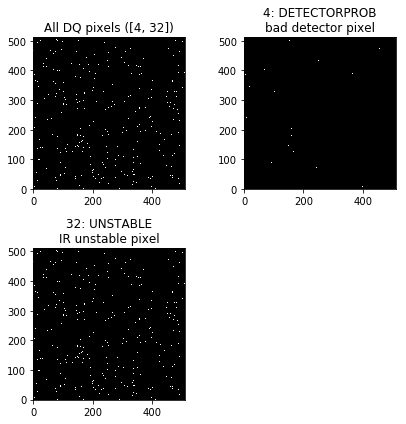

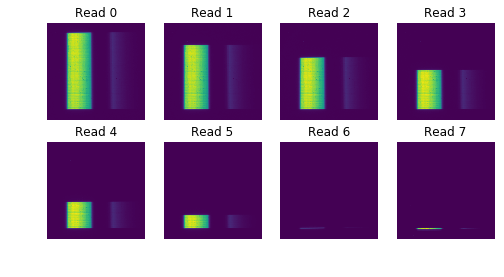

/Users/bob/opt/anaconda3/envs/hstscan/lib/python2.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/bob/opt/anaconda3/envs/hstscan/lib/python2.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


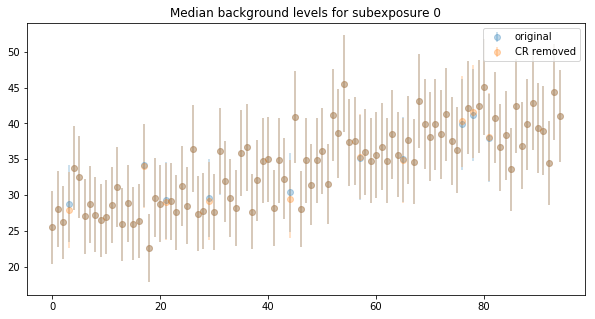

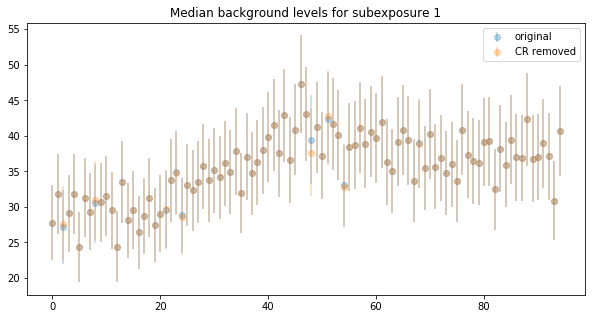

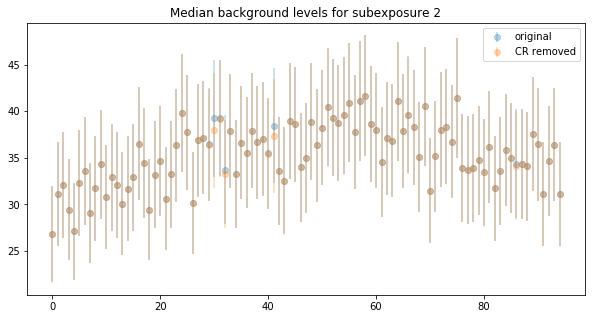

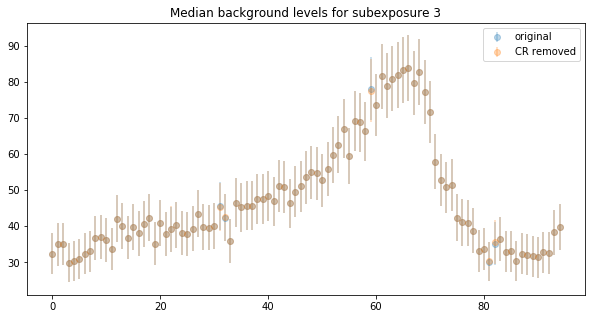

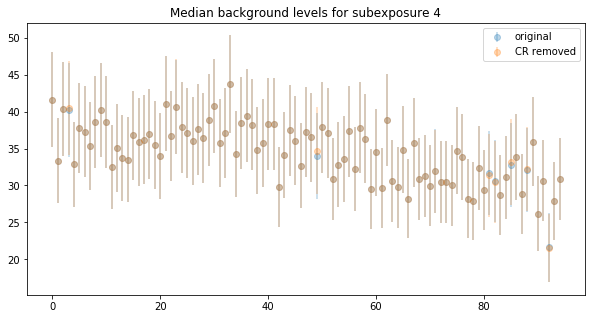

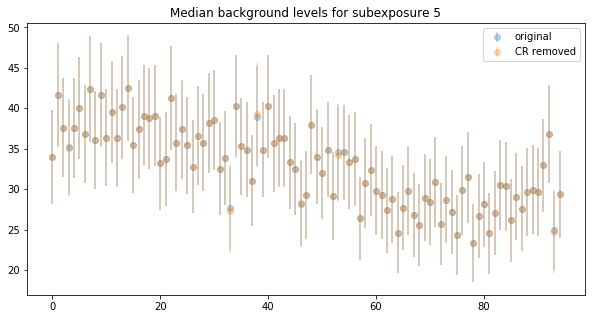

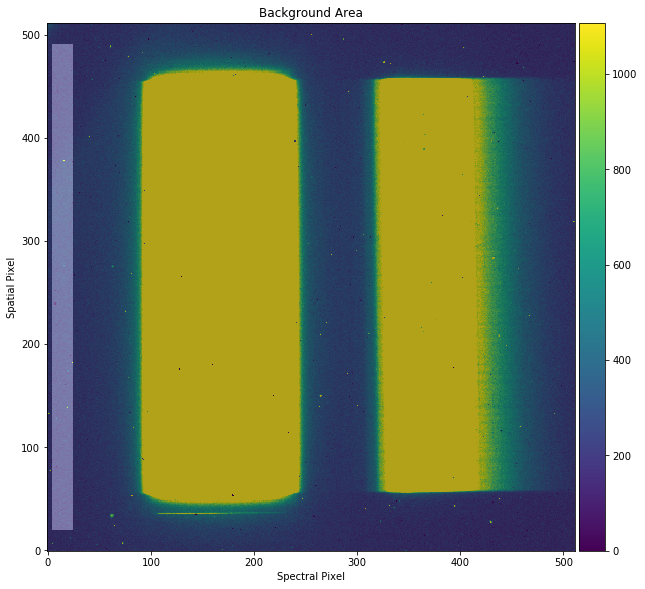

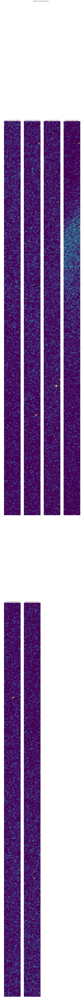

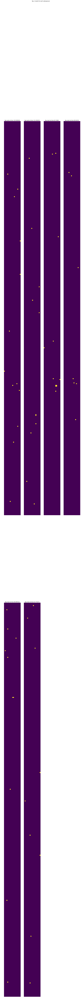

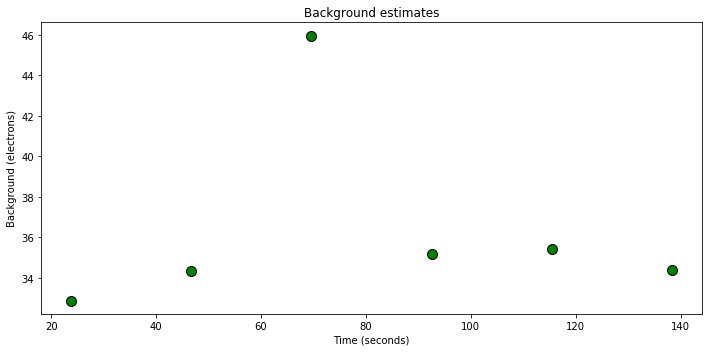

Forward scan
Catalogue used: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102mhq_flt_1.cat
Direct Image name: ied102mhq
catalogue /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102mhq_flt_1.cat
Catalogue file: ied102mhq_flt.fits
########################
Direct image location of (63.3247562549,275.163686837)
Initial xpix is 62 and shift_in_x: -1.01123691974
-250.0 1
FWHM of this subexposure is  65.10285757148563


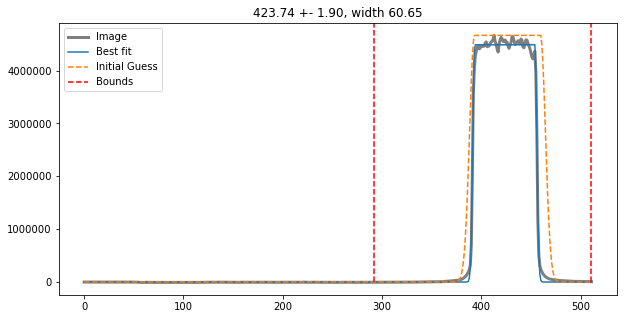

SHIFTINX -1.01123691974
waveschange [1.36302174 1.36767964 1.37233756 1.37699549]
-250.0 1
FWHM of this subexposure is  65.40165594410553


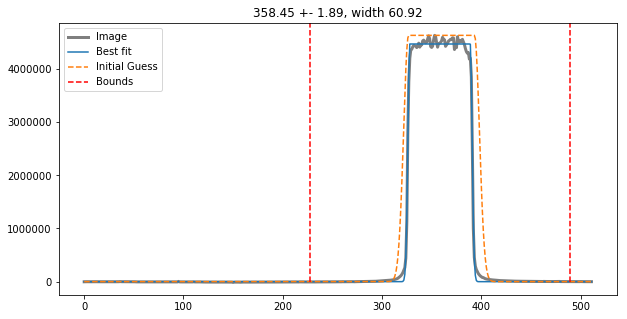

SHIFTINX -1.01123691974
waveschange [1.36302174 1.36767964 1.37233756 1.37699549]
-250.0 1
FWHM of this subexposure is  65.5063516631136


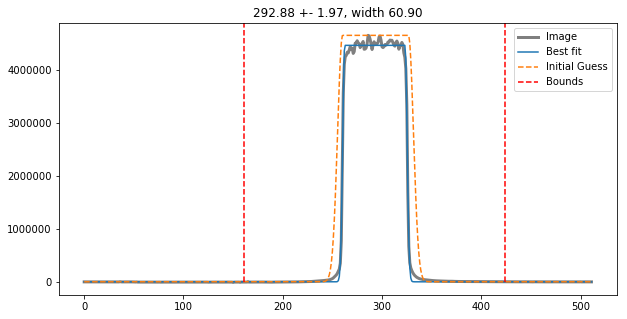

SHIFTINX -1.01123691974
waveschange [1.36302174 1.36767964 1.37233756 1.37699549]
-250.0 1
FWHM of this subexposure is  66.92887610684315


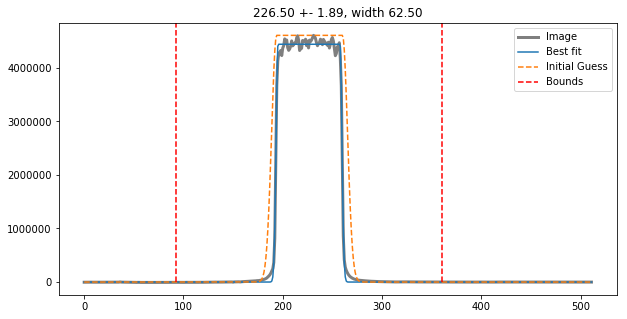

SHIFTINX -1.01123691974
waveschange [1.36302174 1.36767964 1.37233756 1.37699549]
-250.0 1
FWHM of this subexposure is  67.30196102190266


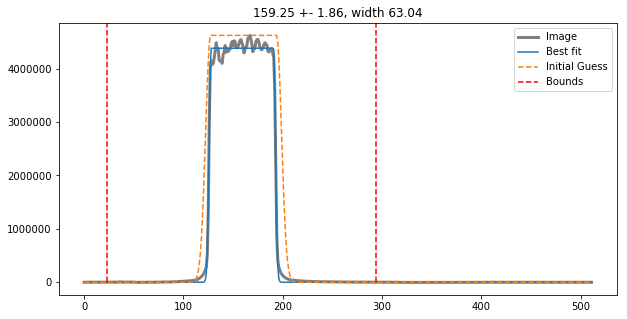

SHIFTINX -1.01123691974
waveschange [1.36302174 1.36767964 1.37233756 1.37699549]
-250.0 1
FWHM of this subexposure is  67.72063755835737


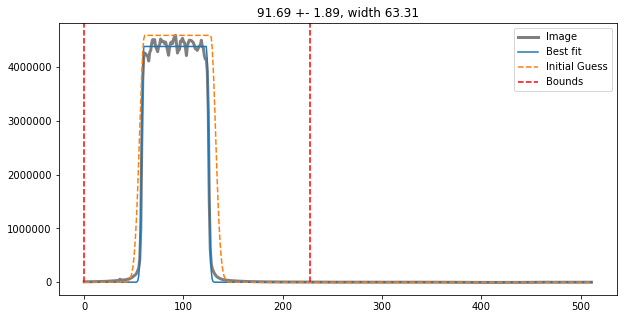

SHIFTINX -1.01123691974
waveschange [1.36302174 1.36767964 1.37233756 1.37699549]


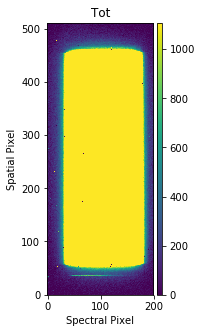

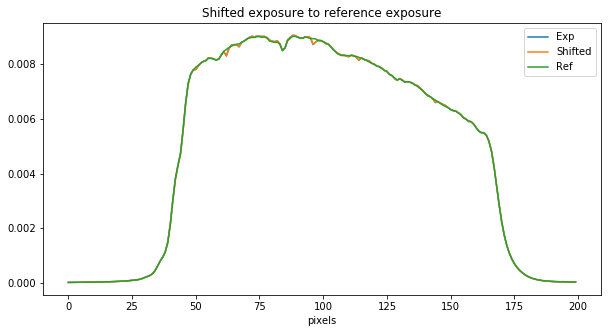

shifttoref -0.060544541401701846
The final xpix is 62
-250.0 1
FWHM of this subexposure is  65.10285757148563


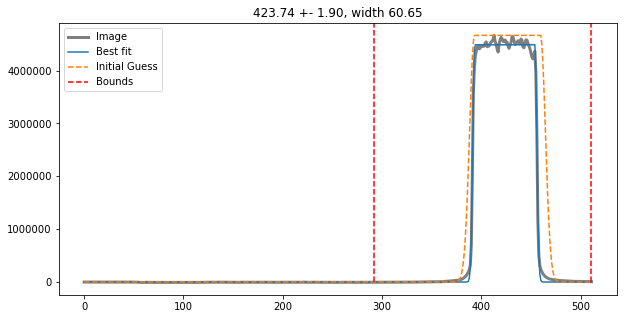

SHIFTINX -0.060544541401701756
waveschange [1.35836436 1.36302224 1.36768014 1.37233805]
-250.0 1
FWHM of this subexposure is  65.40165594410553


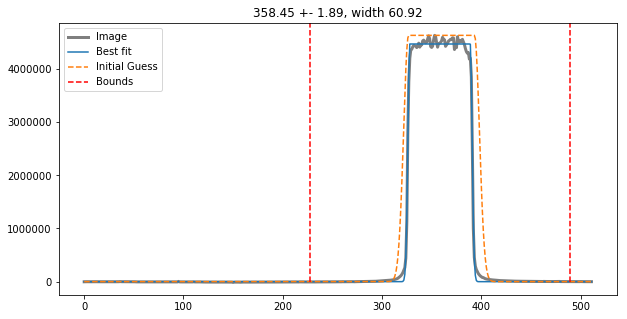

SHIFTINX -0.060544541401701756
waveschange [1.35836436 1.36302224 1.36768014 1.37233805]
-250.0 1
FWHM of this subexposure is  65.5063516631136


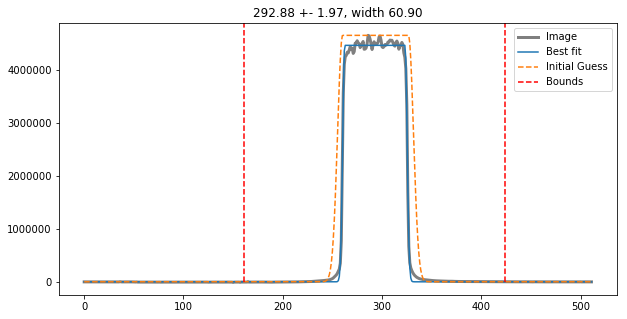

SHIFTINX -0.060544541401701756
waveschange [1.35836436 1.36302224 1.36768014 1.37233805]
-250.0 1
FWHM of this subexposure is  66.92887610684315


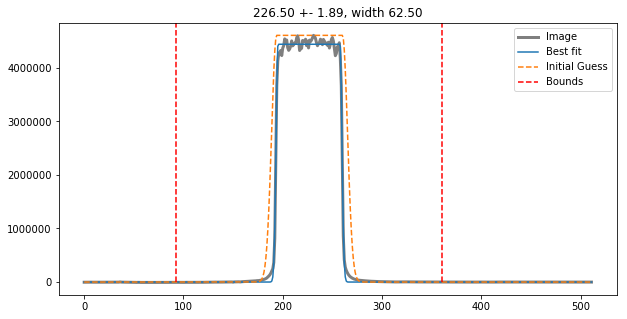

SHIFTINX -0.060544541401701756
waveschange [1.35836436 1.36302224 1.36768014 1.37233805]
-250.0 1
FWHM of this subexposure is  67.30196102190266


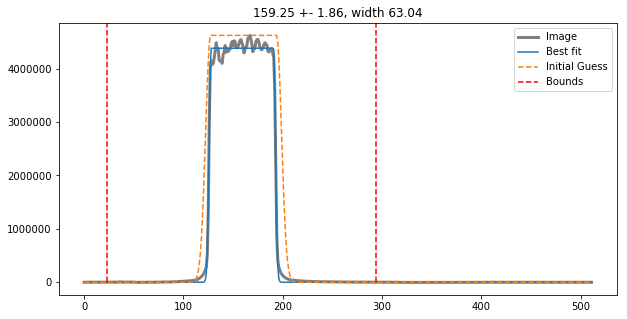

SHIFTINX -0.060544541401701756
waveschange [1.35836436 1.36302224 1.36768014 1.37233805]
-250.0 1
FWHM of this subexposure is  67.72063755835737


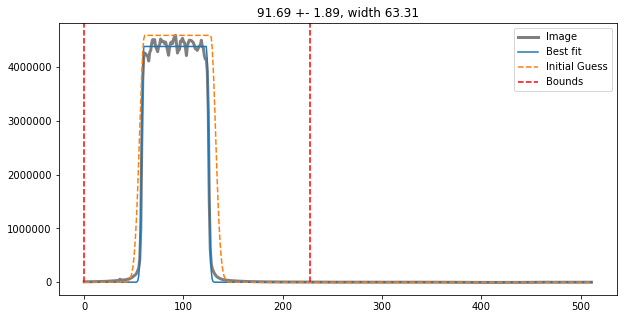

SHIFTINX -0.060544541401701756
waveschange [1.35836436 1.36302224 1.36768014 1.37233805]


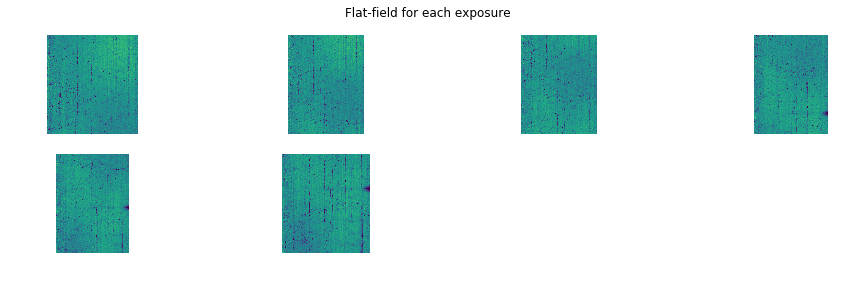

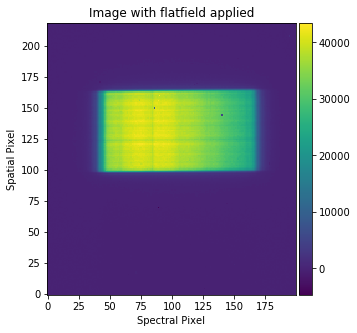

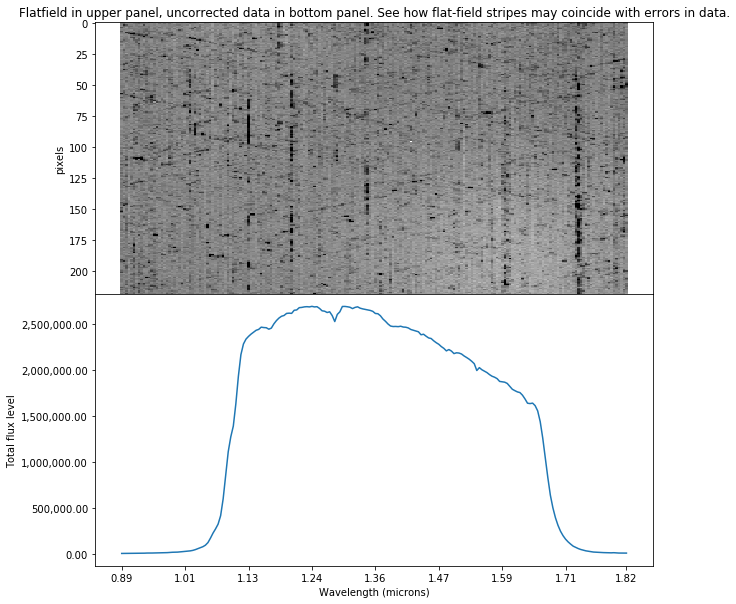

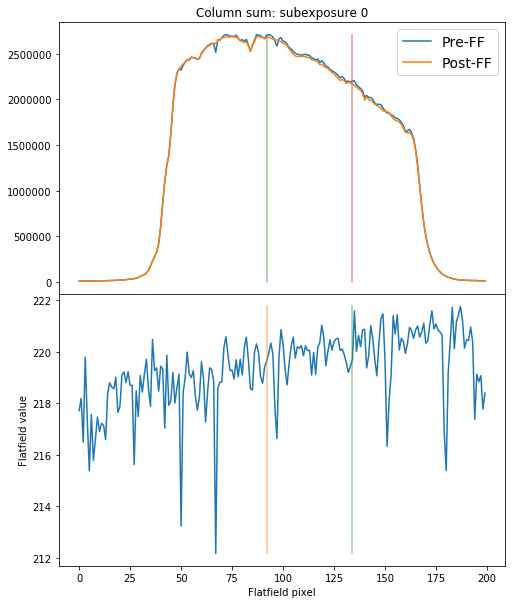

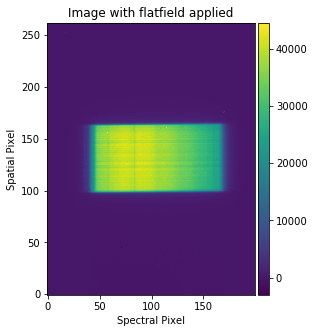

...

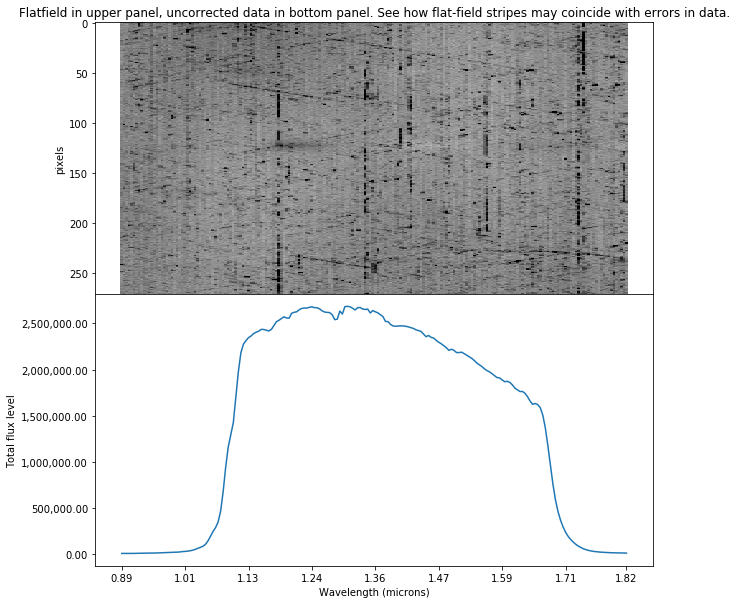

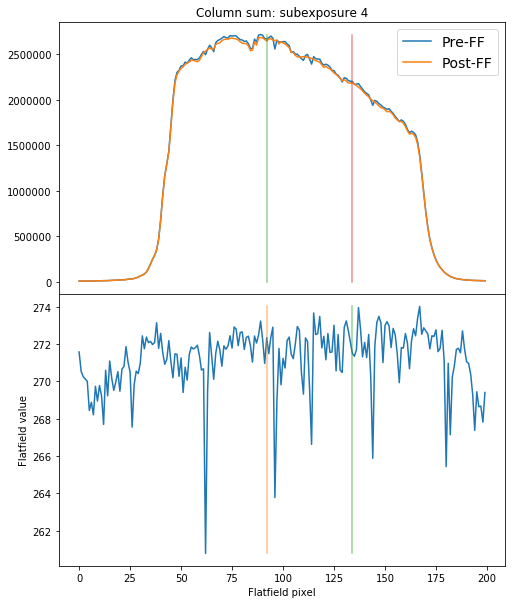

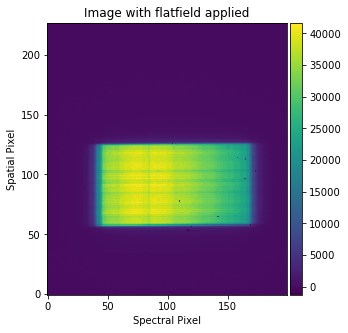

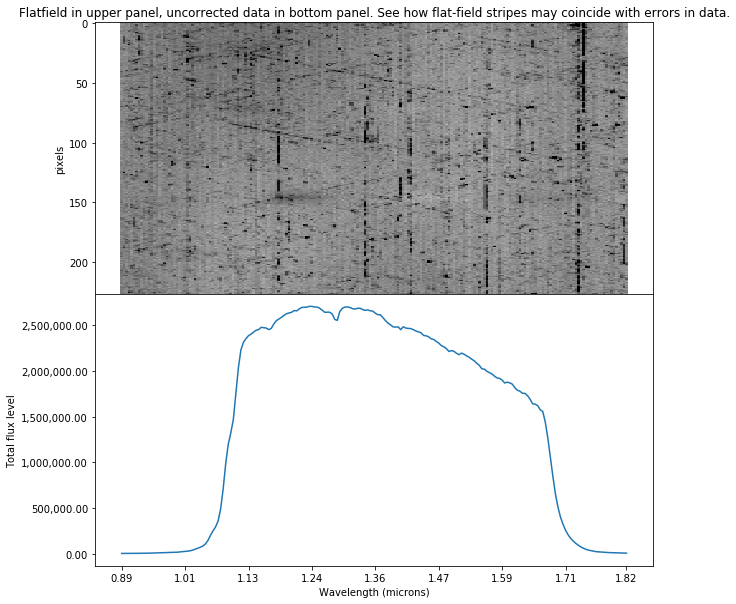

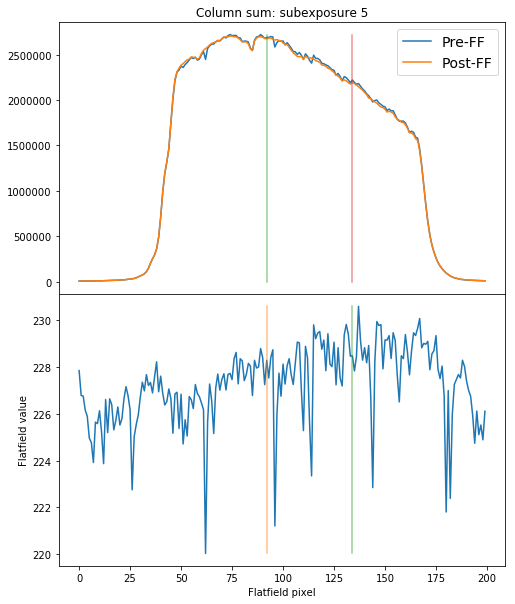

/Users/bob/opt/anaconda3/envs/hstscan/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


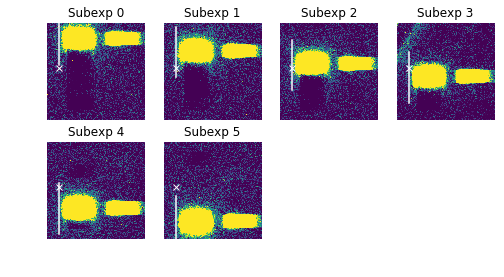

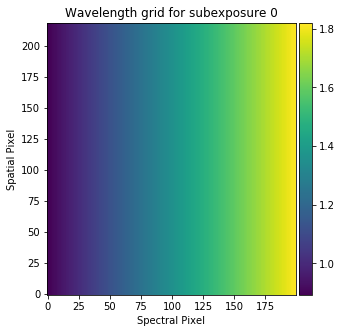

nr_CRs, Lows 265 0
nr_CRs, Lows 250 5
nr_CRs, Lows 218 6
nr_CRs, Lows 197 2
nr_CRs, Lows 218 5
nr_CRs, Lows 204 4


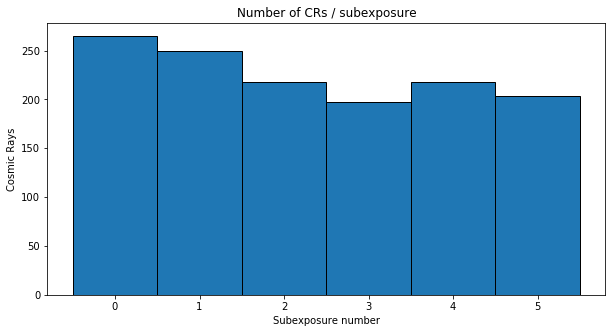

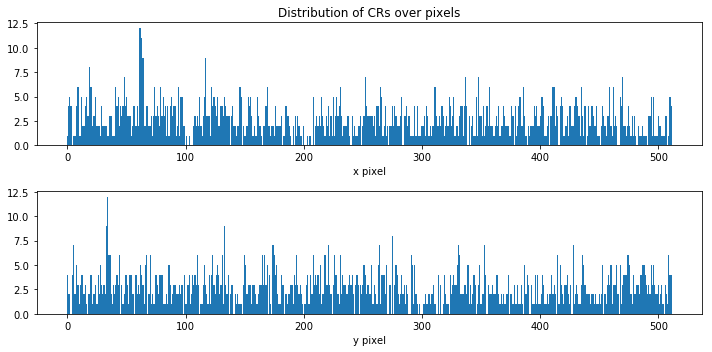

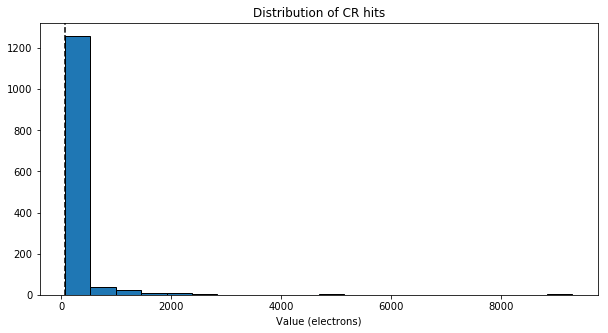

This should have a median energy of 1000 electrons
Nr. of DQs, CRs and CRs minus DQs 18378, 1352 and 1320
Percentage of pixels affected by CRs:0.503540039062 %, which should be ~0.53814642% if there is no South Atlantic anomaly.


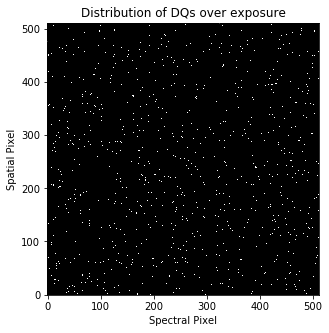

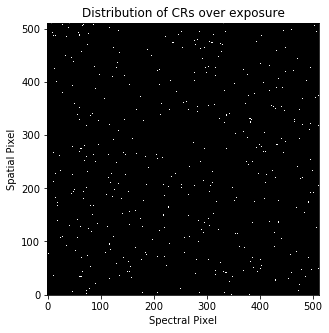

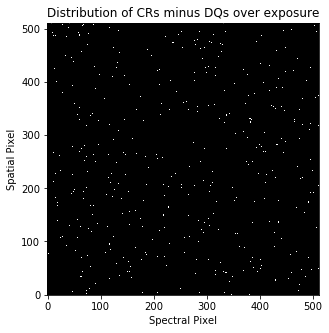

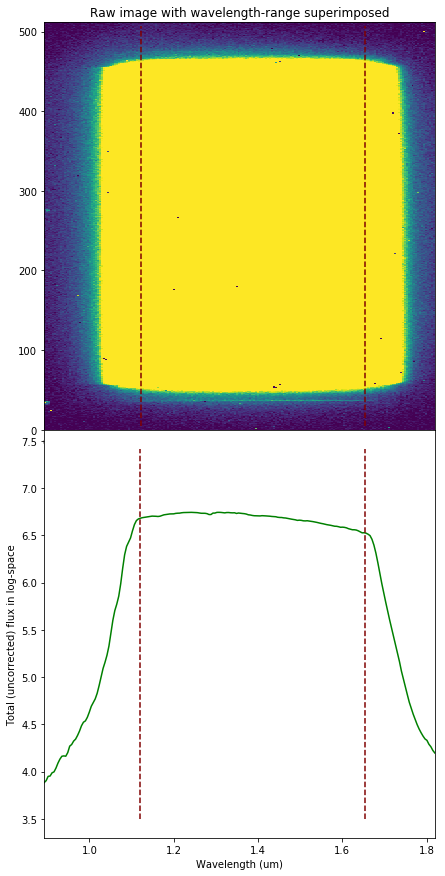

138.380508
138.380508 138.380508
Reduction took 27.07s
########################################
###########Finished Reduction###########
########################################
########################################
############Started Extraction##########
########################################
Spectral extraction pipeline performed on exposure /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102miq_ima.fits
For configuration, see conf file: /Users/bob/Documents/PhD/HAT-P-2b/transmission_extraction.conf
Forward scan
Extracting from subexposure 1
Extracting spectrum with a 142 high extraction box
nr. of CRs 3328
Spectrum located at pixel 162 in spatial direction
subexp 423.742043370189 [424, 358, 291, 225, 159, 92]
ypix is 424 for exposure 0
0 6


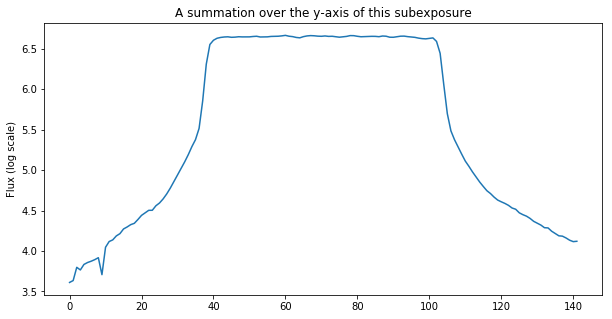

The difference between the two edges (for a 5-pixel bin for all subexps is): 1817.9333984375
This value may not be larger than  6272.479573502013  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


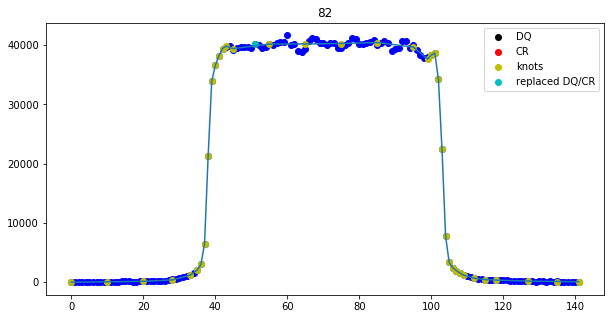

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


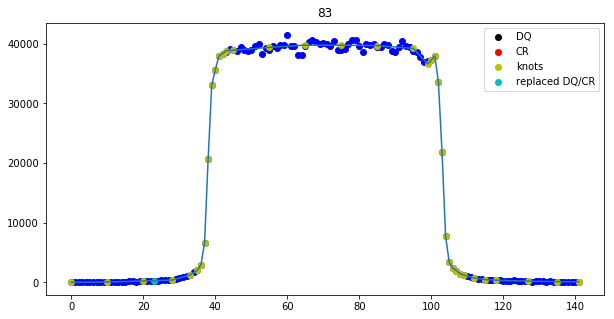

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


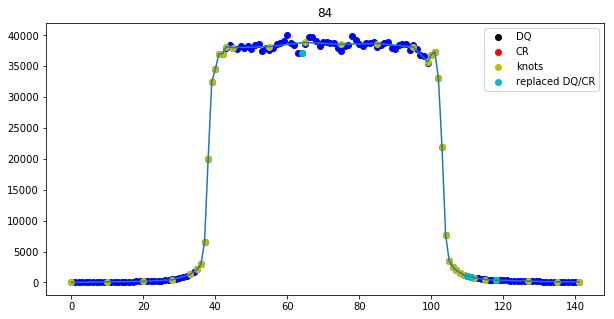

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


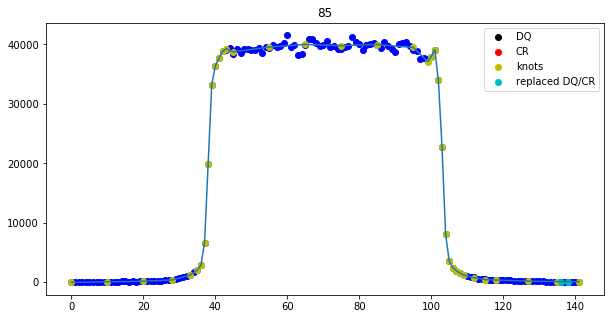

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


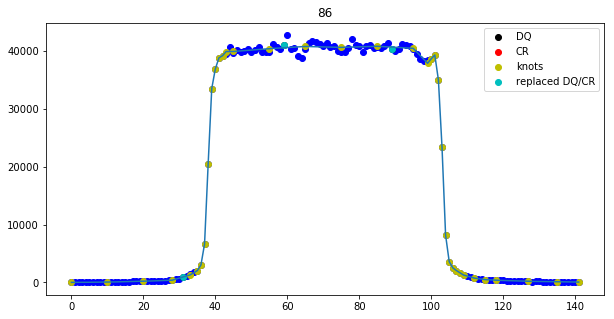

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 4]
Clipped 0 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 3583
Spectrum located at pixel 162 in spatial direction
subexp 358.45464619357443 [424, 358, 291, 225, 159, 92]
ypix is 358 for exposure 1
1 6


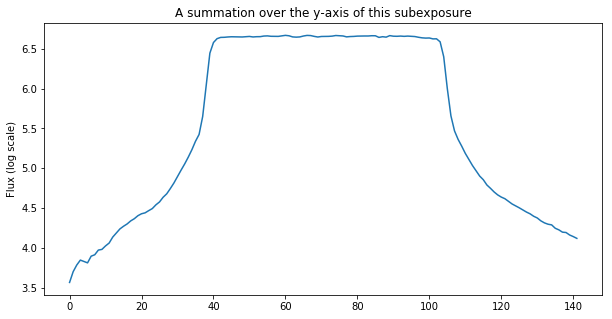

The difference between the two edges (for a 5-pixel bin for all subexps is): 2031.1828125
This value may not be larger than  6303.2124719595695  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


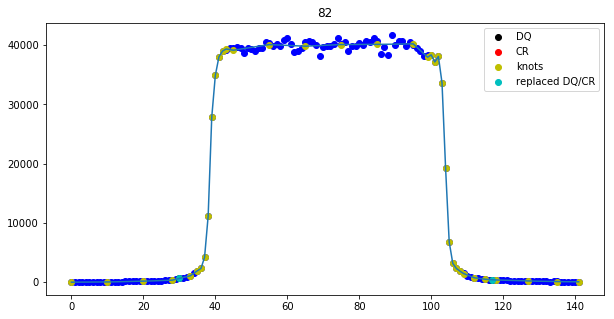

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


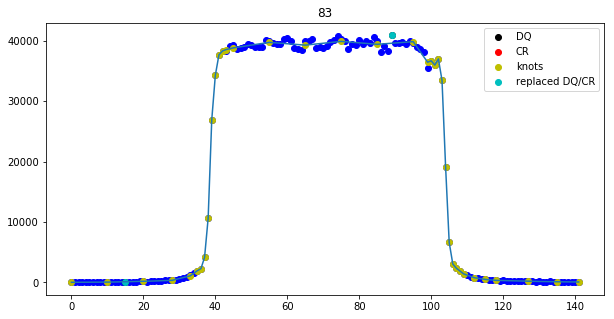

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


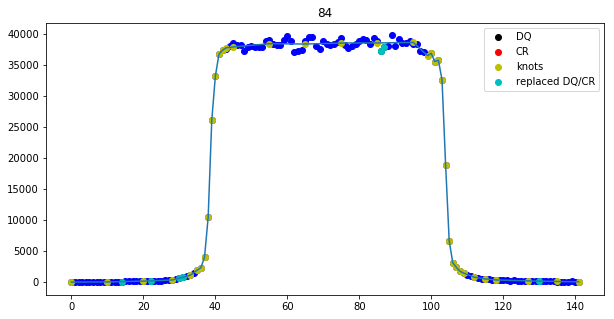

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


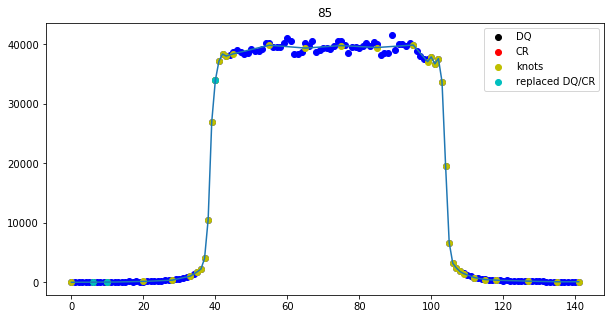

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


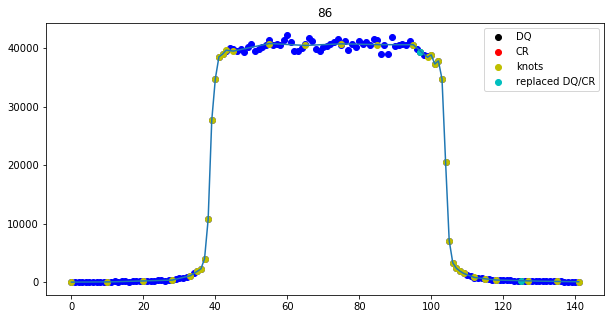

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 3537
Spectrum located at pixel 162 in spatial direction
subexp 292.8823848903395 [424, 358, 291, 225, 159, 92]
ypix is 291 for exposure 2
2 6


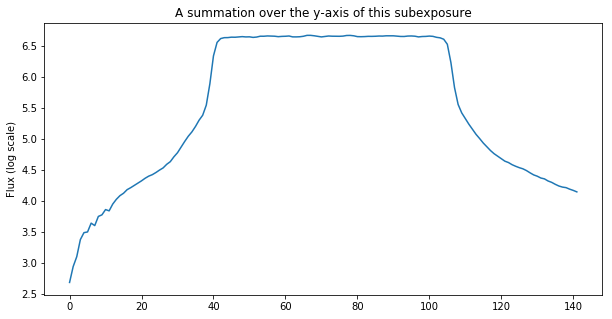

The difference between the two edges (for a 5-pixel bin for all subexps is): 2878.6568359375
This value may not be larger than  6307.222526595998  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


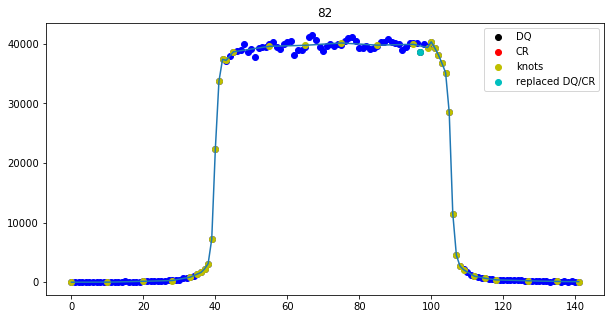

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


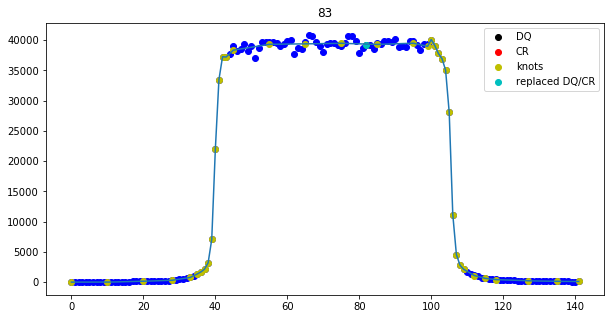

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


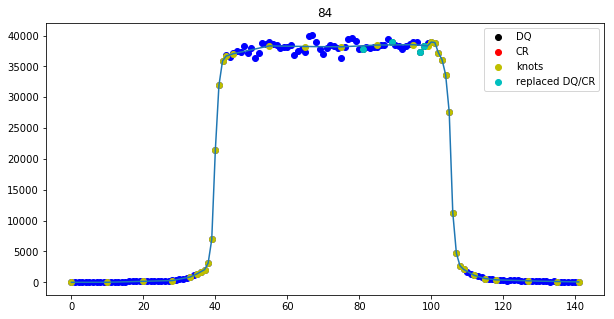

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


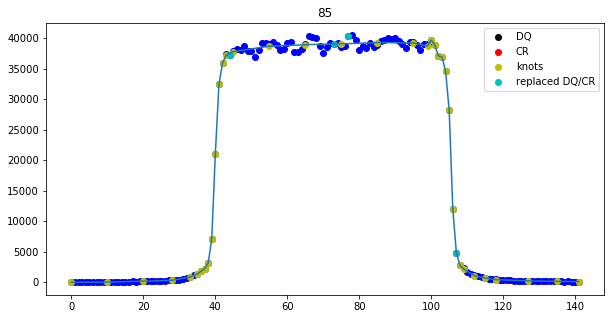

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


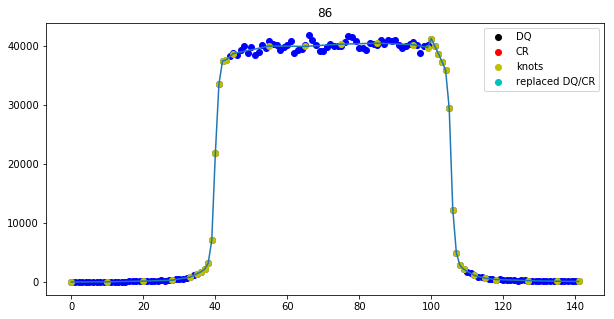

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 3480
Spectrum located at pixel 162 in spatial direction
subexp 226.5028492377081 [424, 358, 291, 225, 159, 92]
ypix is 225 for exposure 3
3 6


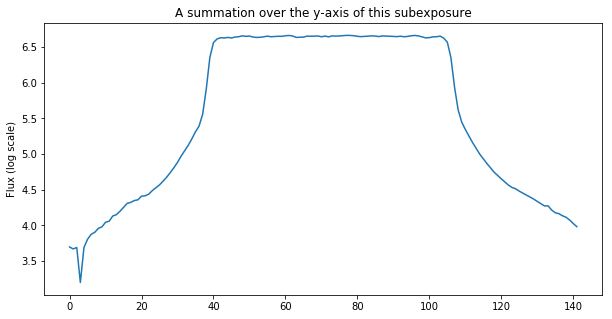

The difference between the two edges (for a 5-pixel bin for all subexps is): 1131.6453125
This value may not be larger than  6335.355522778497  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


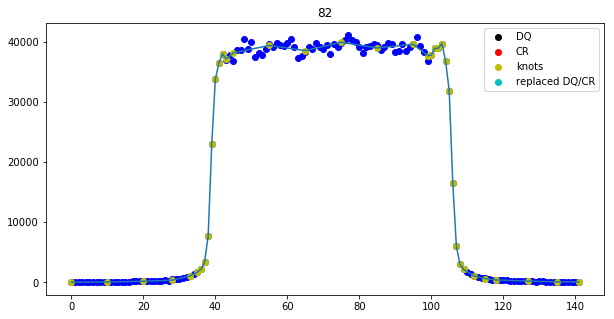

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


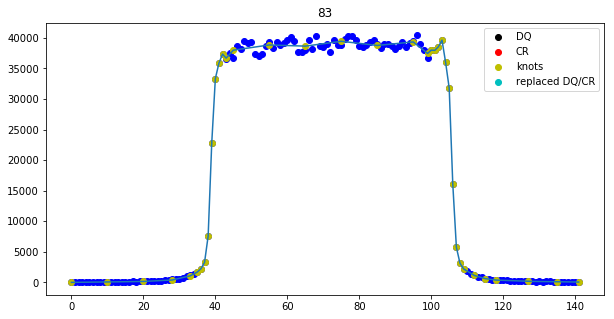

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


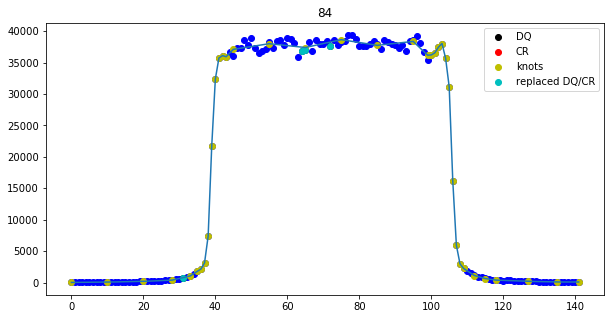

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


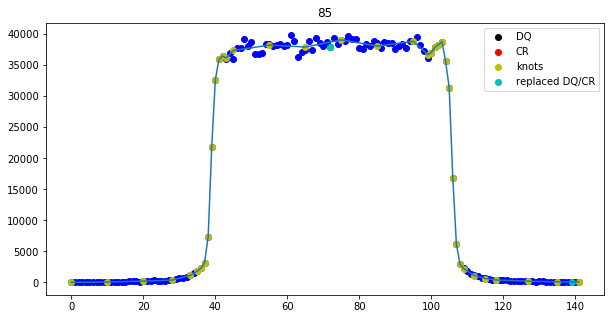

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


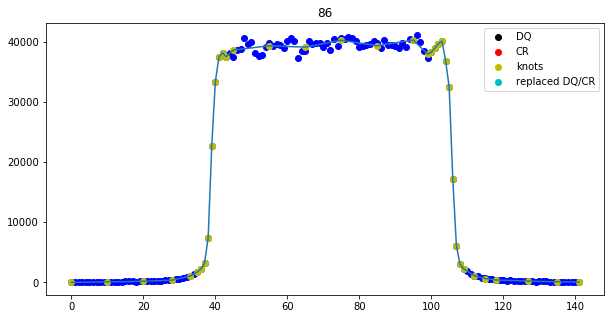

191 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1, 5]
Clipped 0 cosmic rays in OE
Extracting from subexposure 5
nr. of CRs 3483
Spectrum located at pixel 162 in spatial direction
subexp 159.25493591048925 [424, 358, 291, 225, 159, 92]
ypix is 159 for exposure 4
4 6


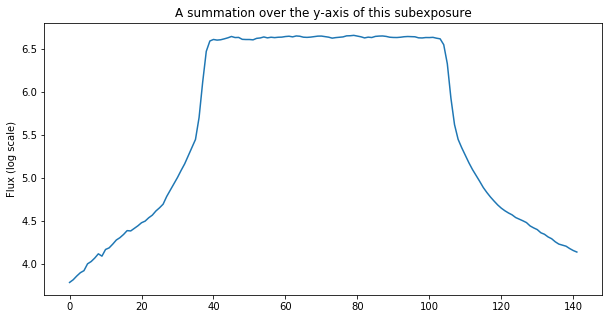

The difference between the two edges (for a 5-pixel bin for all subexps is): 1646.4216796875
This value may not be larger than  6305.605886828006  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


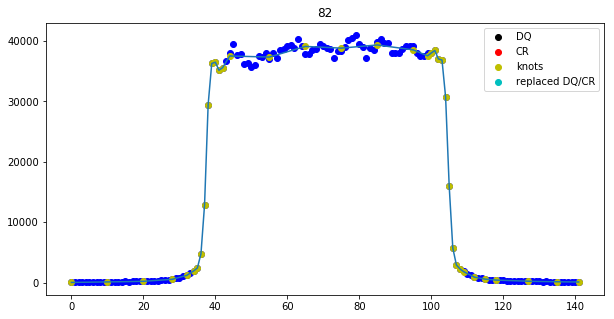

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


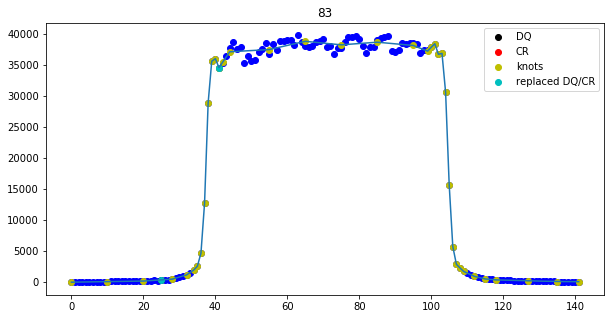

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


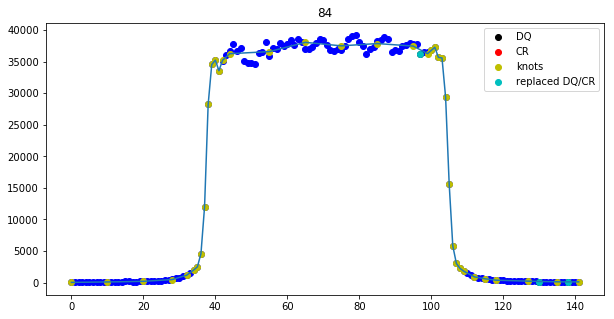

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


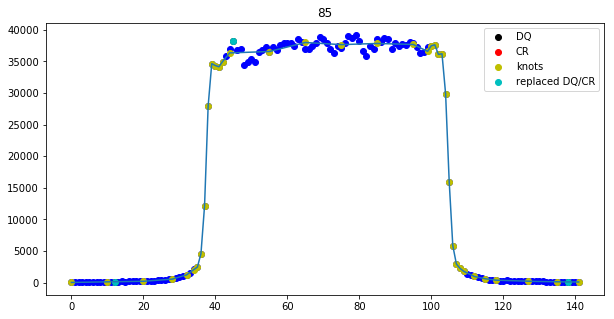

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


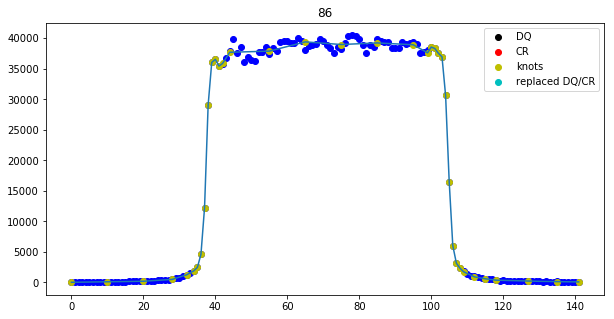

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2]
Clipped 0 cosmic rays in OE
Extracting from subexposure 6
nr. of CRs 3489
Spectrum located at pixel 162 in spatial direction
subexp 91.68939731165585 [424, 358, 291, 225, 159, 92]
ypix is 92 for exposure 5
5 6


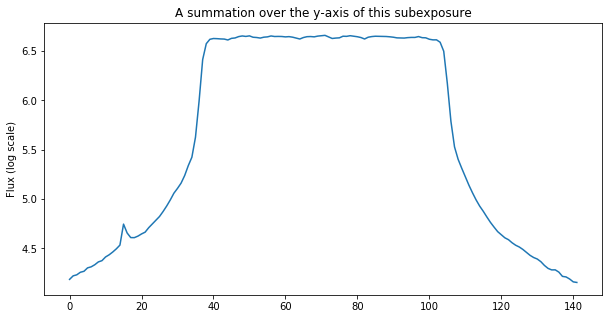

The difference between the two edges (for a 5-pixel bin for all subexps is): 474.8087890625
This value may not be larger than  6336.442072120074  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


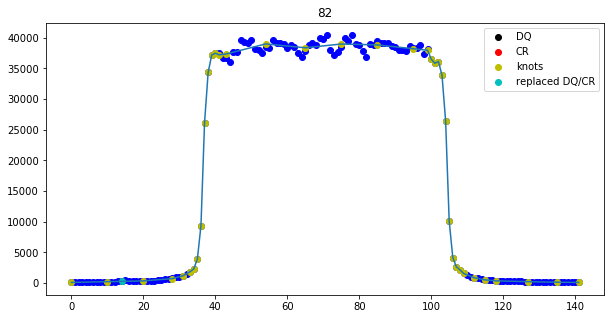

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


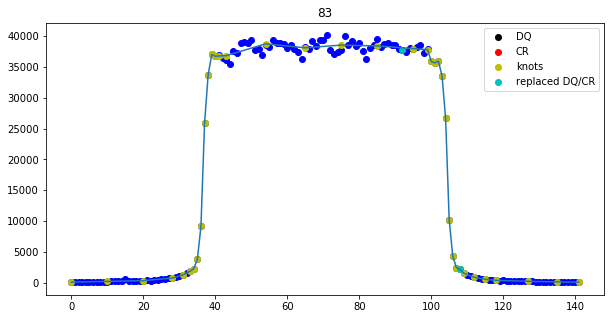

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


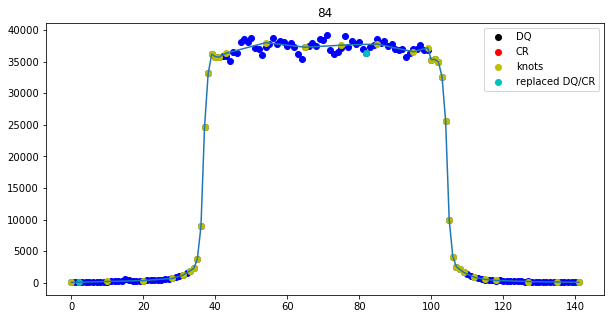

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


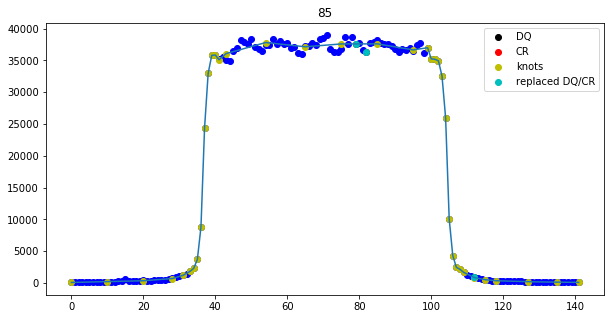

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


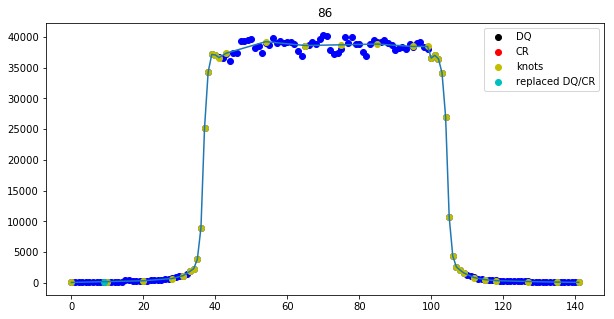

199 successes out of 200 total fits
Optimal extraction fitting failed for columns: [1]
Clipped 0 cosmic rays in OE


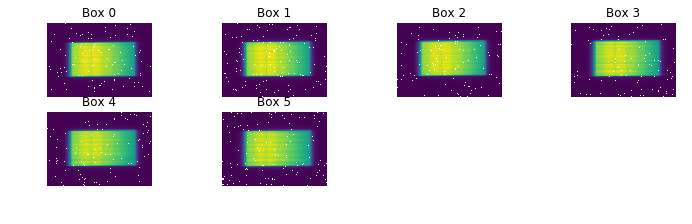

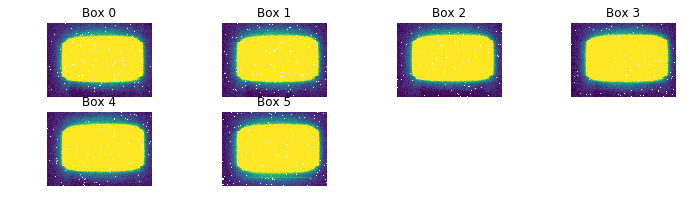

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.11022302e-16 -1.11022302e-16  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  1.11022302e-16  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.11022302e-16  0.00000000e+00
  0.00000000e+00  2.22044605e-16  0.00000000e+00 -2.22044605e-16
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -2.22044605e-16  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.22044605e-16  0.00000000e+00  2.22044605e-16  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  2.22044605e-16  0.00000000e+00  2.22044605e-16
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000

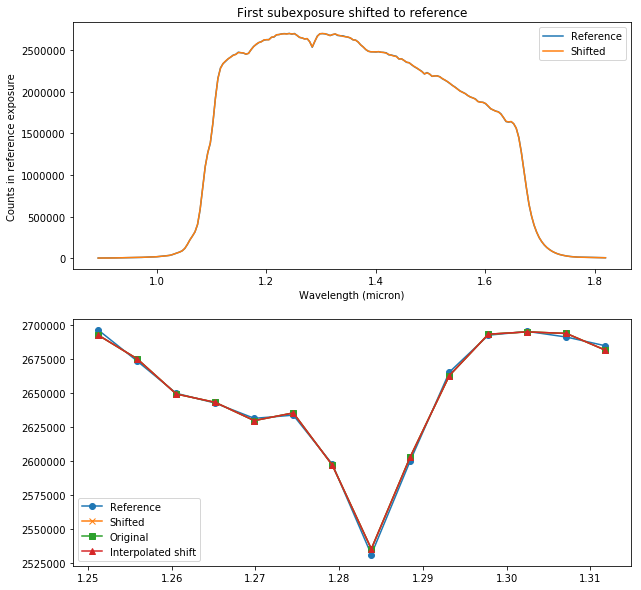

Shifted subexposure nr. 1 with -0.798709282678 pixels and shrunk 0.328859610207 percent.
Shifted subexposure nr. 2 with -1.555711857 pixels and shrunk 0.650747120339 percent.
Shifted subexposure nr. 3 with -2.37216438812 pixels and shrunk 0.96780611523 percent.
Shifted subexposure nr. 4 with -3.31632772073 pixels and shrunk 1.31777215635 percent.
Shifted subexposure nr. 5 with -4.36310920264 pixels and shrunk 1.69913546875 percent.


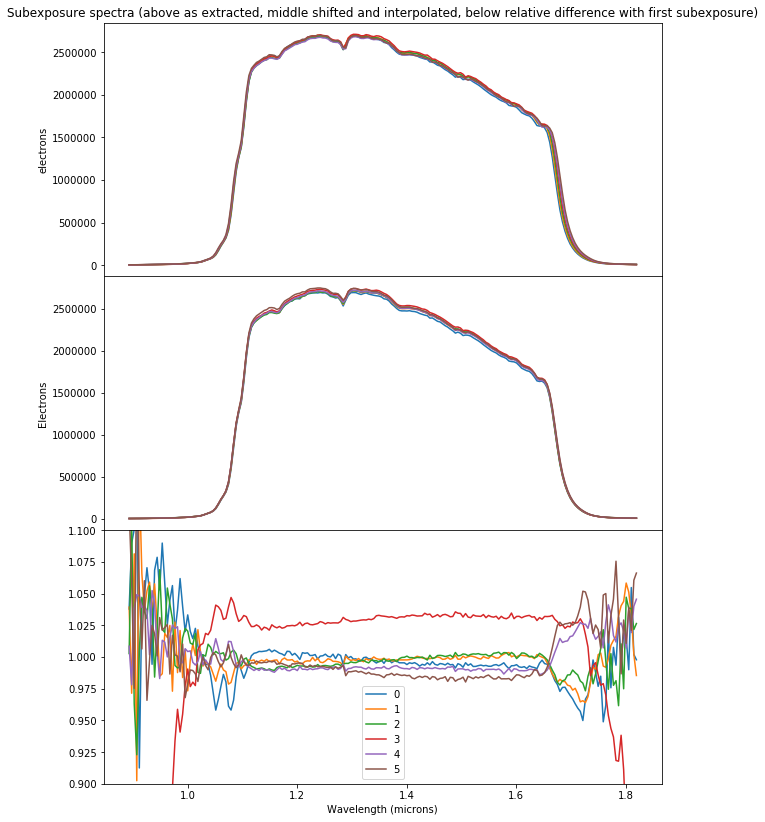

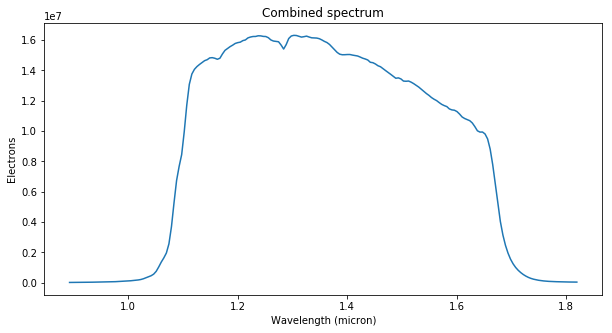

Extraction took 6.95s
########################################
###########Finished Extraction##########
########################################


In [6]:
reload(pipe)
#fname = 'ied101adq_ima.fits'  # oldreference
#fname = 'ied101aeq_ima.fits'  #reverse
#fname = 'ied101b5q_ima.fits'  #reverse
#fname = 'ied102mnq_ima.fits'  #reverse
#fname = 'ied102m8q_ima.fits'  #reference
#fname = 'ied102msq_ima.fits'  #reverse
#fname = 'ied102mtq_ima.fits'  
#fname = 'ied102m8q_ima.fits'  #reverse reference
fname = 'ied102miq_ima.fits'  #satellite in 4th subexposure
#fname = 'ied102liq_ima.fits'  #anomalous?
#fname = 'ied101hmq_ima.fits'  #anomalous?
#fname = 'ied102lqq_ima.fits'  #anomalous?
visit = 1

if visit == 1:
    #Bg_x, Bg_y, Bg_w, Bg_h = (5, 5, 45, 200)
    #Bg_x, Bg_y, Bg_w, Bg_h = (305, 480, 200, 30)
    #Bg_x, Bg_y, Bg_w, Bg_h = (305, 10, 200, 30)
    Bg_x, Bg_y, Bg_w, Bg_h = (5, 20, 20, 512 - 40) #<-best
    Ref_exp = ref_Images[0].split('_ima.fits')[0]
    
if fname == Ref_exp + '_ima.fits':
    Save_sub = True
else:
    Save_sub = False

exp = pipe.reduce_exposure(fname, pdf=False, logger=False, debug=True,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           #cr_tolx=5., cr_toly=5., cr_thresh=65,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           use_2nd_order=True, cr_deficiency=True, bg_plot=True,
                           source_dir=data_dir, write = False)
if noknots:
    exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    save_dir=output_dir, save_sub=Save_sub, write=False)
#noknots=True
#if noknots:
#    exp_spectrum, variance, interp_spectra, variances = \
#                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
#                    conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
#                    save_dir=output_dir, save_sub=Save_sub, write=False)
else:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1],
                    save_dir=output_dir, save_sub=Save_sub, show_knots=True, write=False)#,
                                        #wshift_to_ref=False, wshift_sub_exps=False, wstretch_sub_exps=False, no_interp=True)

# Taking multiple images...

In [18]:
Images = glob.glob(data_dir + '*_ima.fits')
Images = np.sort([image.replace(data_dir, '') for image in Images])
Images = [str(I) for I in Images]


In [9]:
Direct_images = []
with open(data_dir + 'visit_driz.lis') as g:
    for line in g:
        Direct_images.append(line.replace('\n',''))
for image in Direct_images:
    imagename = image.replace('_drz', '_ima')
    Images.remove(imagename)

ValueError: list.remove(x): x not in list

In [19]:
shutil.copyfile(conf_file_red, output_dir + 'transmission_reduction_recent.conf')
shutil.copyfile(conf_file_ext, output_dir + 'transmission_extraction_recent.conf')

In [20]:
Images

['ied101adq_ima.fits',
 'ied101aeq_ima.fits',
 'ied101afq_ima.fits',
 'ied101ahq_ima.fits',
 'ied101aiq_ima.fits',
 'ied101akq_ima.fits',
 'ied101alq_ima.fits',
 'ied101amq_ima.fits',
 'ied101aoq_ima.fits',
 'ied101apq_ima.fits',
 'ied101arq_ima.fits',
 'ied101asq_ima.fits',
 'ied101avq_ima.fits',
 'ied101awq_ima.fits',
 'ied101ayq_ima.fits',
 'ied101azq_ima.fits',
 'ied101b0q_ima.fits',
 'ied101b2q_ima.fits',
 'ied101b3q_ima.fits',
 'ied101b5q_ima.fits',
 'ied101b6q_ima.fits',
 'ied101b7q_ima.fits',
 'ied101b9q_ima.fits',
 'ied101baq_ima.fits',
 'ied101bdq_ima.fits',
 'ied101beq_ima.fits',
 'ied101bgq_ima.fits',
 'ied101bhq_ima.fits',
 'ied101biq_ima.fits',
 'ied101bkq_ima.fits',
 'ied101blq_ima.fits',
 'ied101bnq_ima.fits',
 'ied101boq_ima.fits',
 'ied101bpq_ima.fits',
 'ied101brq_ima.fits',
 'ied101bsq_ima.fits',
 'ied101bvq_ima.fits',
 'ied101bwq_ima.fits',
 'ied101byq_ima.fits',
 'ied101bzq_ima.fits',
 'ied101c0q_ima.fits',
 'ied101c2q_ima.fits',
 'ied101c3q_ima.fits',
 'ied101c5q

First do the reference exposures. They should be the first spectrum of each visit.

########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102m8q_ima.fits
For configuration, see pipeline conf file: /Users/bob/Documents/PhD/HAT-P-2b/transmission_reduction.conf


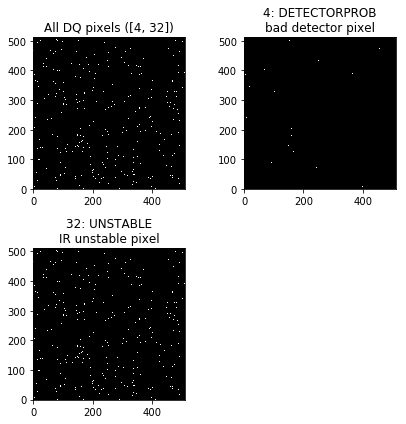

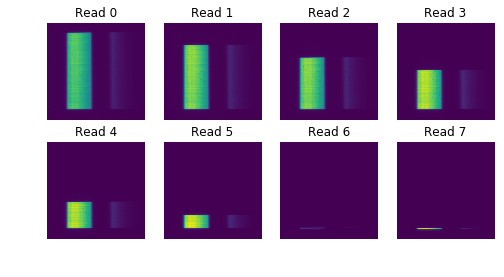

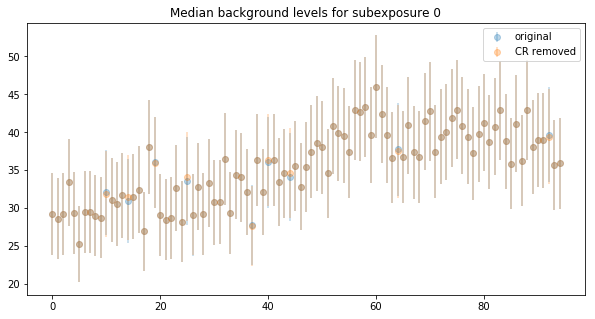

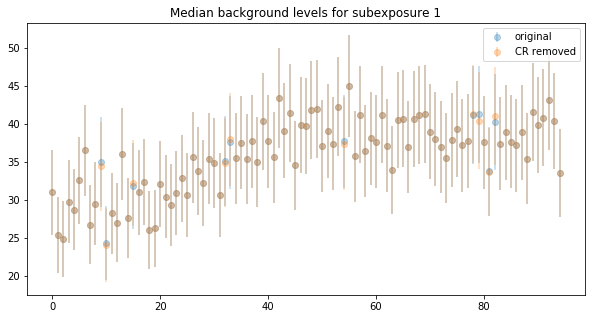

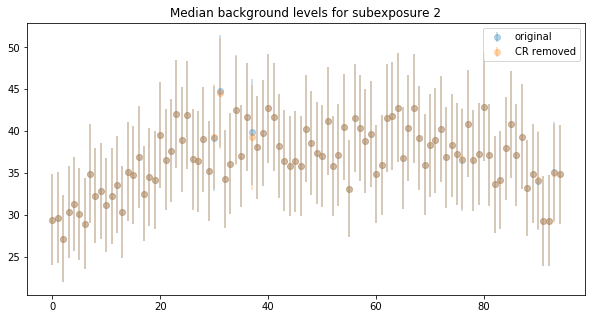

...

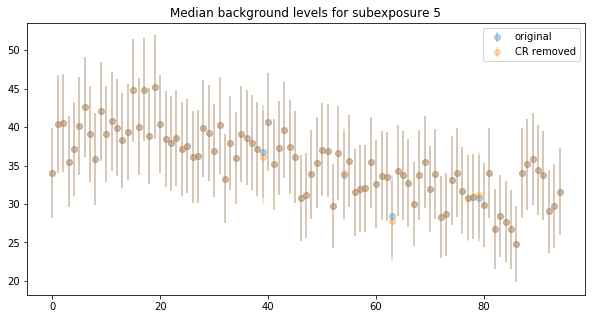

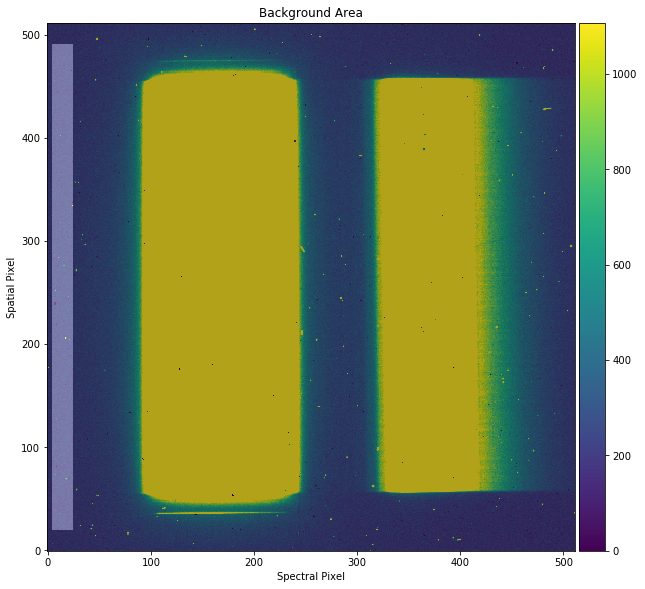

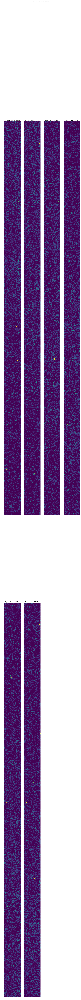

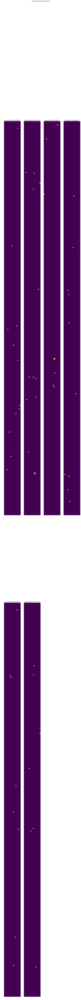

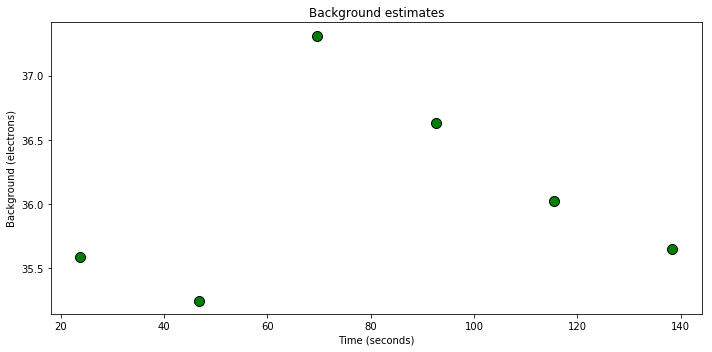

Forward scan
Catalogue used: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lzq_flt_1.cat
Direct Image name: ied102lzq
catalogue /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lzq_flt_1.cat
Catalogue file: ied102lzq_flt.fits
########################
Direct image location of (63.2469130861,275.195842386)
FWHM of this subexposure is  65.12711482605113


/Users/bob/opt/anaconda3/envs/hstscan/lib/python2.7/site-packages/scipy/optimize/minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


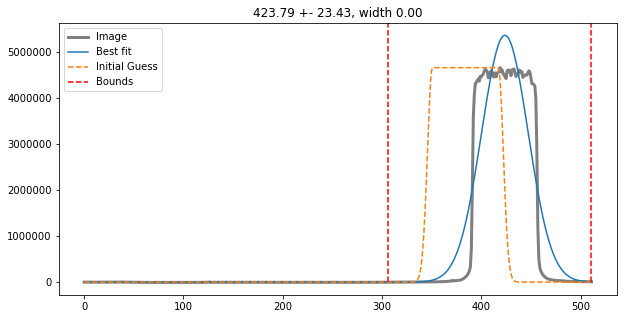

using a PHOENIX stellar model
amplitude and displacement on first order: -15.265468176050614 -1.0112369197377964


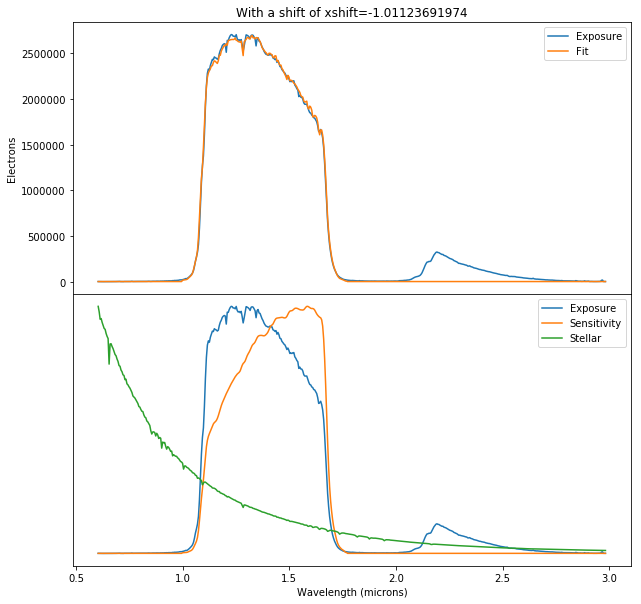

Applied an xshift of -1.01123691974 pix from a comparison to a stellar spectrum
Initial xpix is 62 and shift_in_x: -1.01123691974
-250.0 1
FWHM of this subexposure is  65.12714322977422


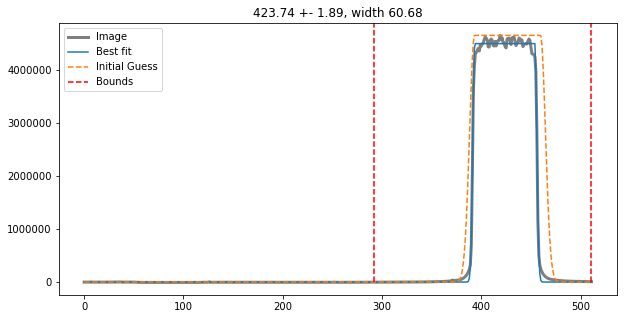

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.35403441105382


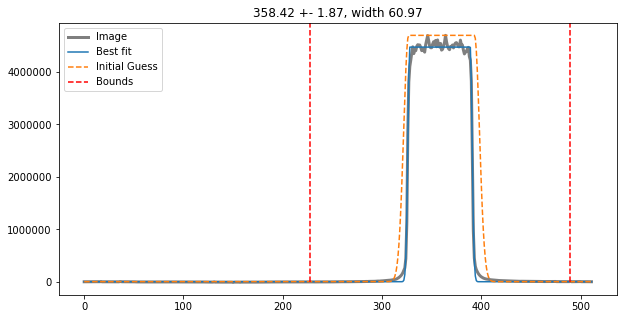

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.56157744066627


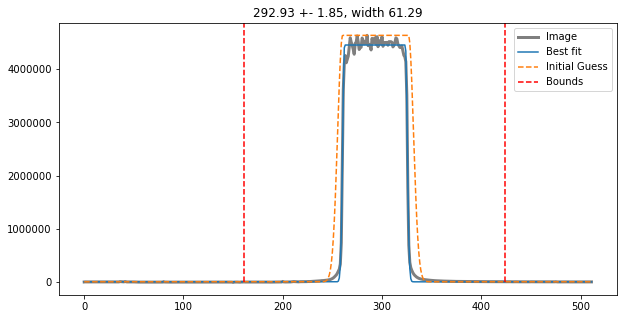

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  66.97377959523294


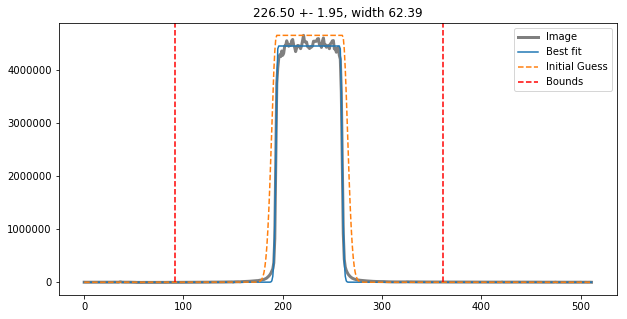

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.30971443196904


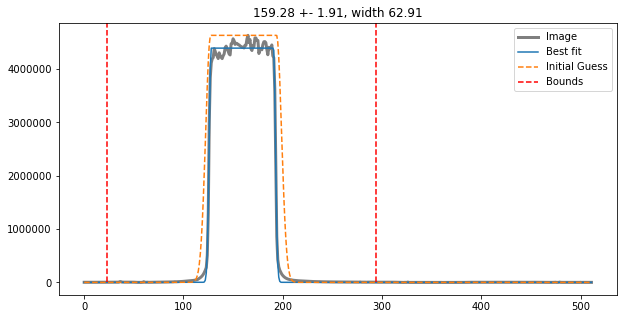

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.71955854114697


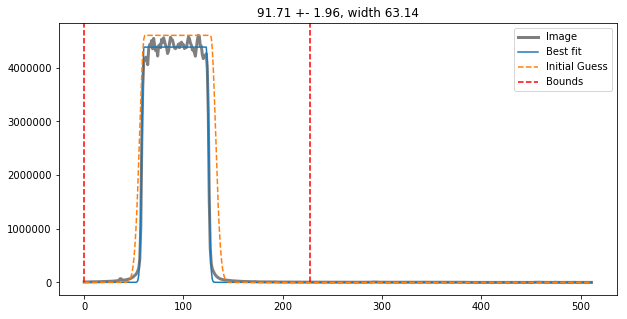

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
The final xpix is 62
-250.0 1
FWHM of this subexposure is  65.12714322977422


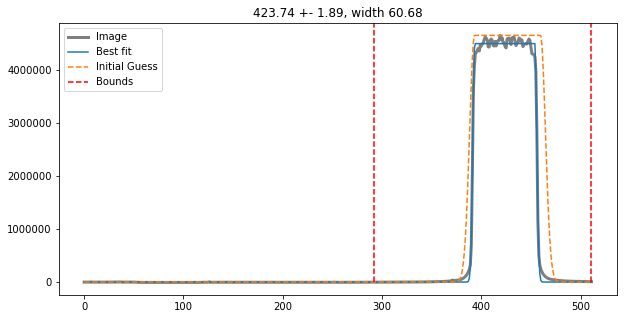

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.35403441105382


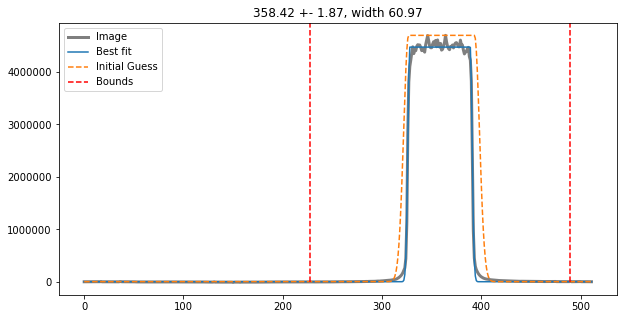

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.56157744066627


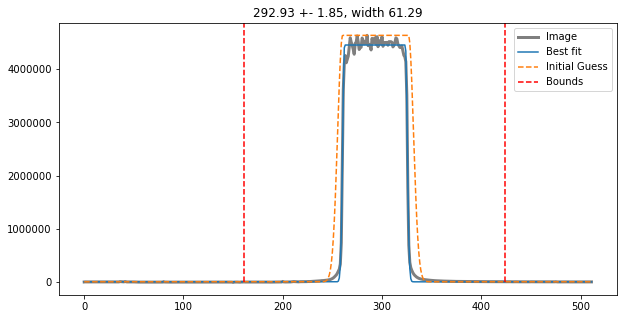

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  66.97377959523294


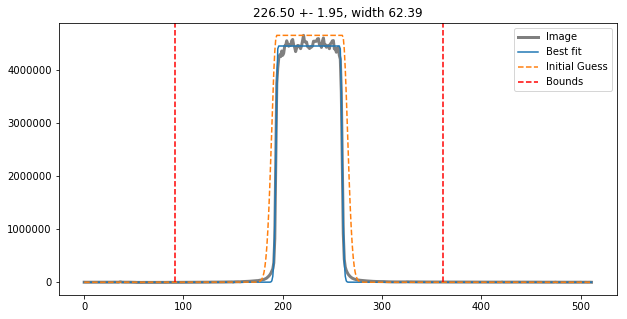

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.30971443196904


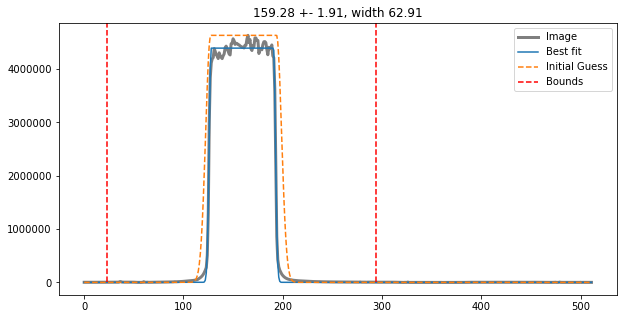

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.71955854114697


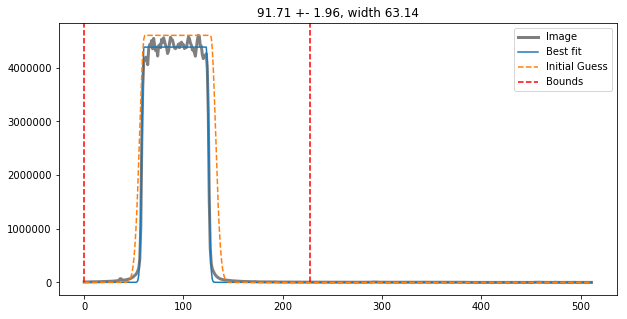

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]


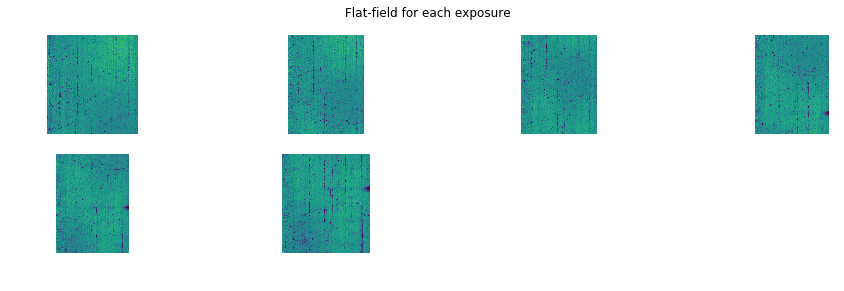

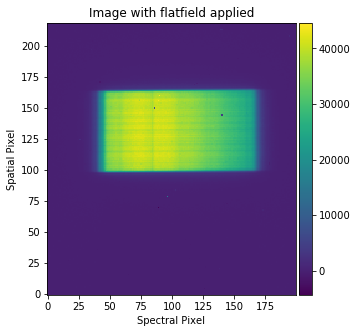

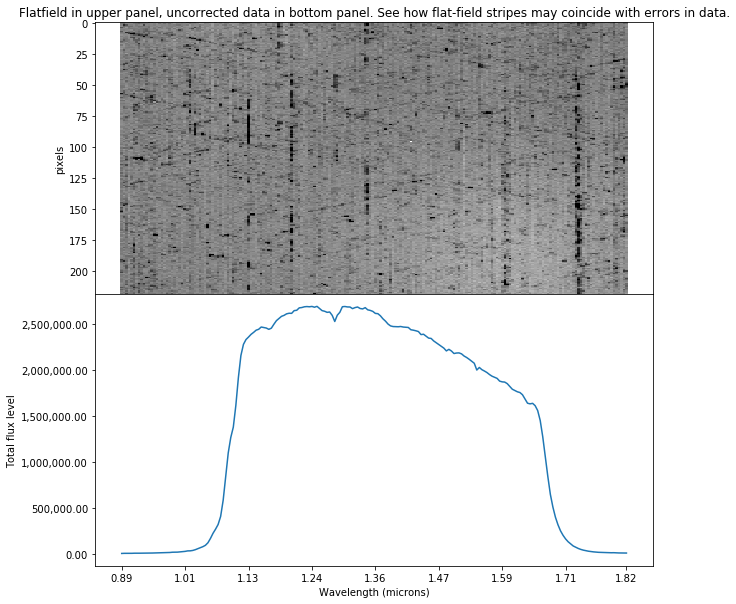

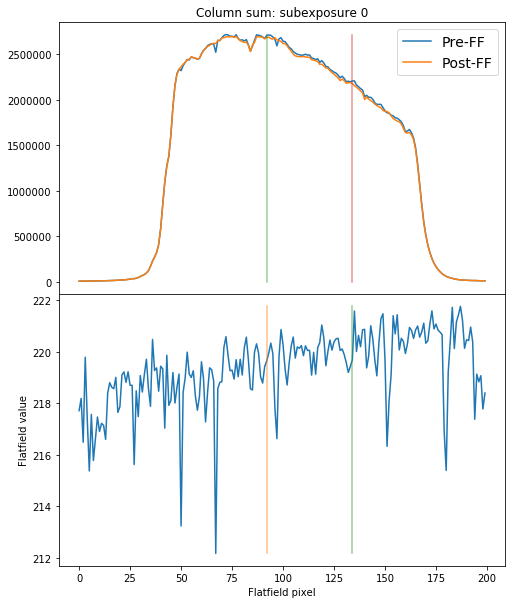

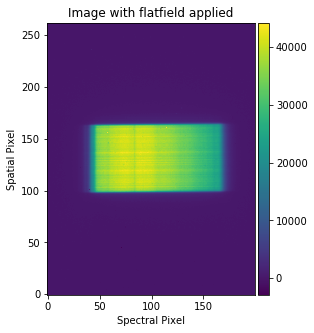

...

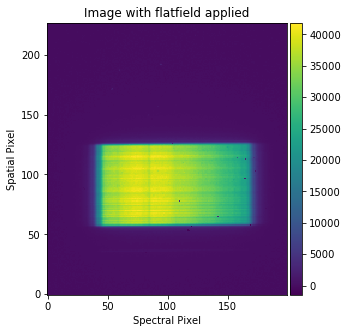

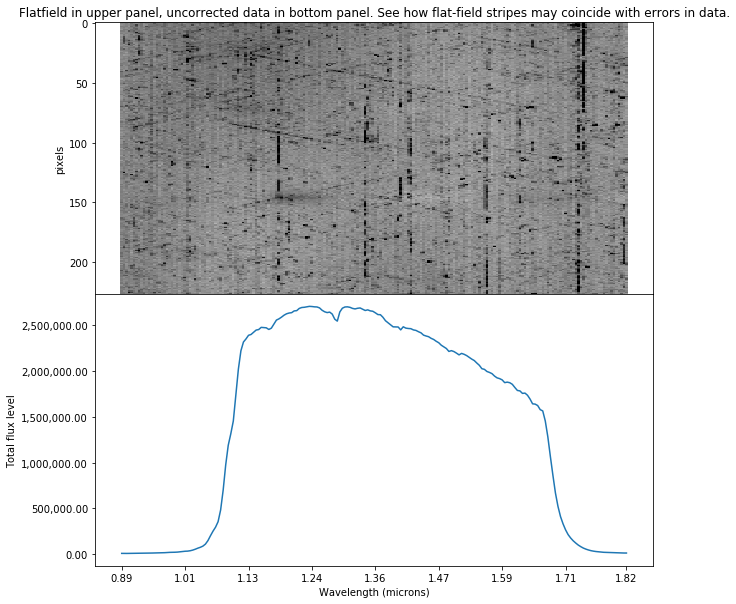

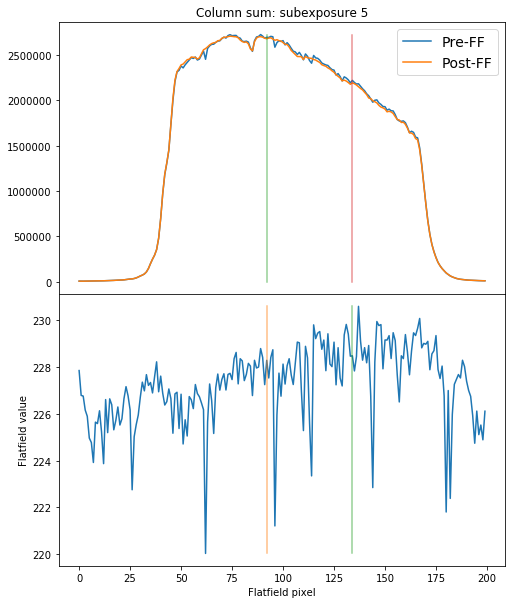

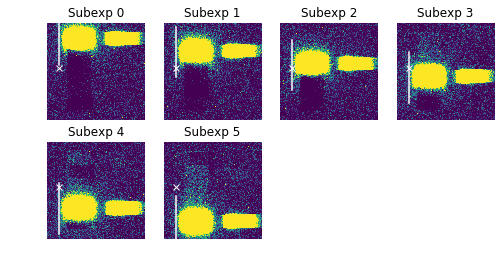

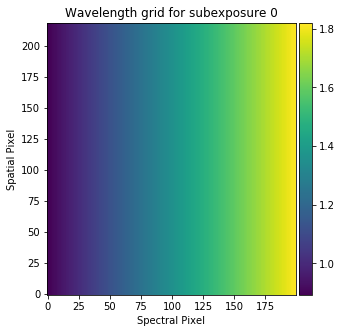

nr_CRs, Lows 310 8
nr_CRs, Lows 259 8
nr_CRs, Lows 291 5
nr_CRs, Lows 234 11
nr_CRs, Lows 284 10
nr_CRs, Lows 237 6


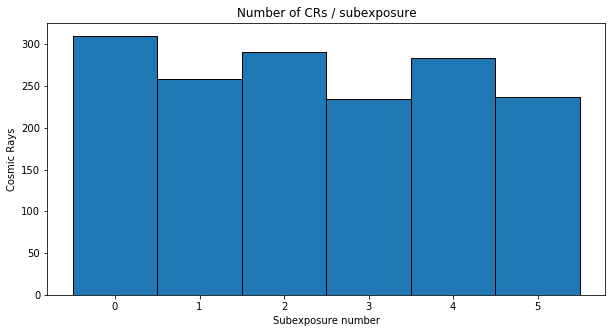

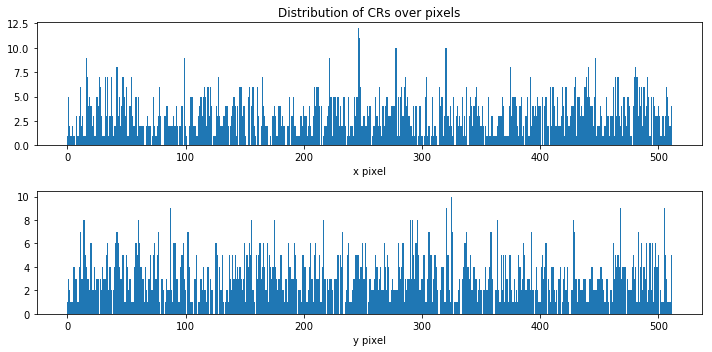

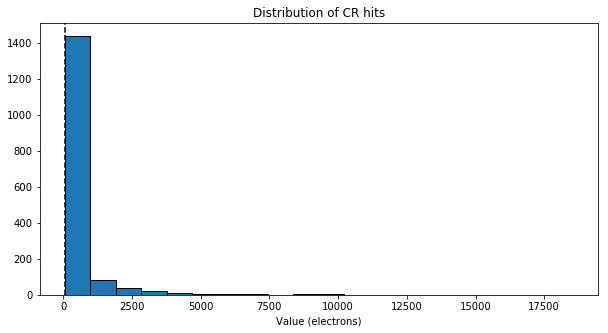

This should have a median energy of 1000 electrons
Nr. of DQs, CRs and CRs minus DQs 18378, 1615 and 1601
Percentage of pixels affected by CRs:0.610733032227 %, which should be ~0.53814642% if there is no South Atlantic anomaly.


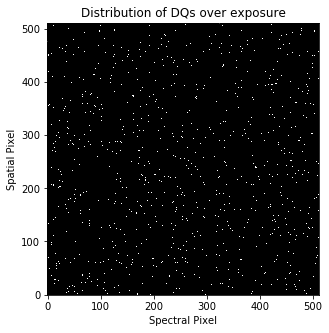

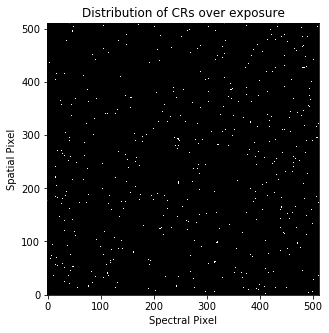

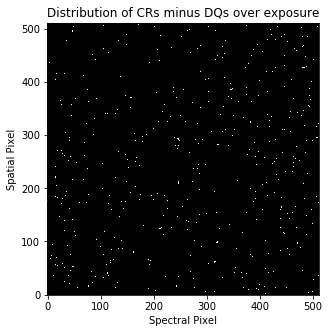

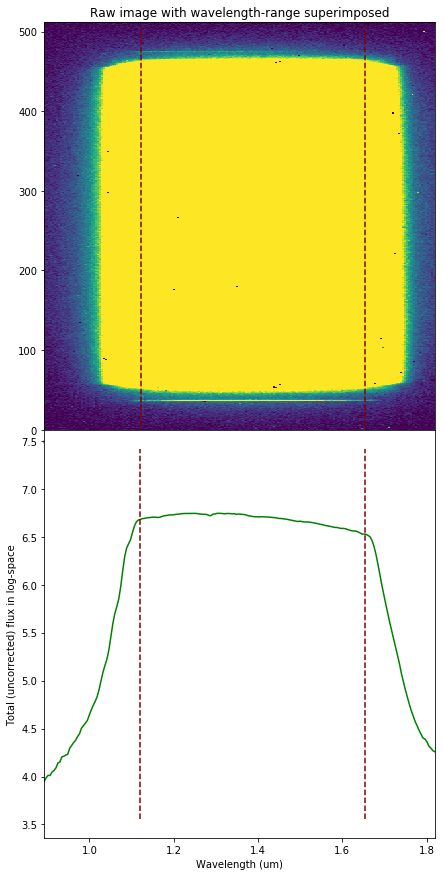

138.380508
138.380508 138.380508
Reduction took 34.26s
########################################
###########Finished Reduction###########
########################################
########################################
############Started Extraction##########
########################################
Spectral extraction pipeline performed on exposure /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102m8q_ima.fits
For configuration, see conf file: /Users/bob/Documents/PhD/HAT-P-2b/transmission_extraction.conf
Forward scan
Extracting from subexposure 1
Extracting spectrum with a 142 high extraction box
nr. of CRs 3381
Spectrum located at pixel 162 in spatial direction
subexp 423.7406733694926 [424, 358, 291, 225, 159, 92]
ypix is 424 for exposure 0
0 6


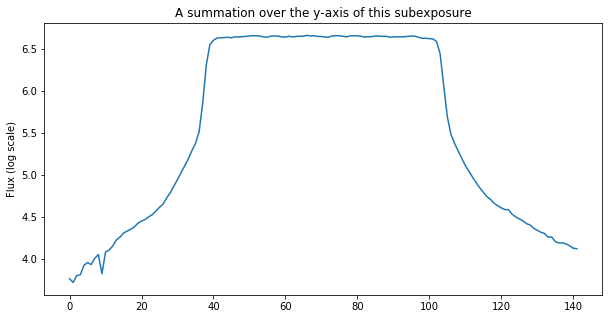

The difference between the two edges (for a 5-pixel bin for all subexps is): 1601.53212890625
This value may not be larger than  6277.747026866671  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


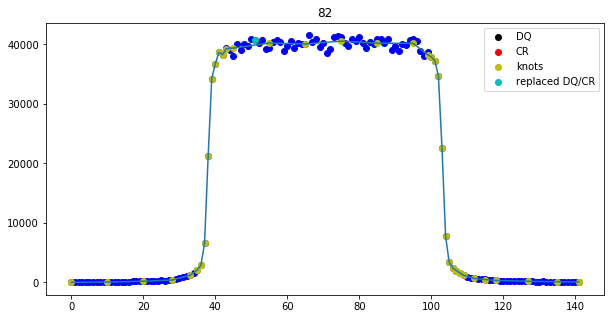

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


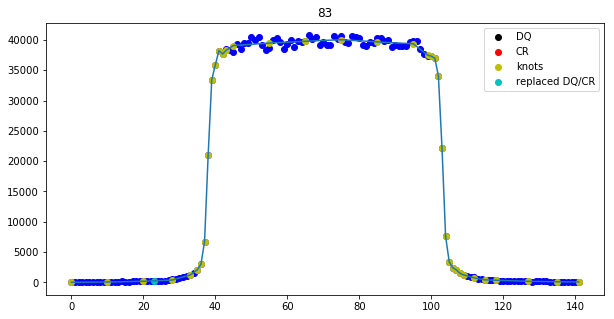

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


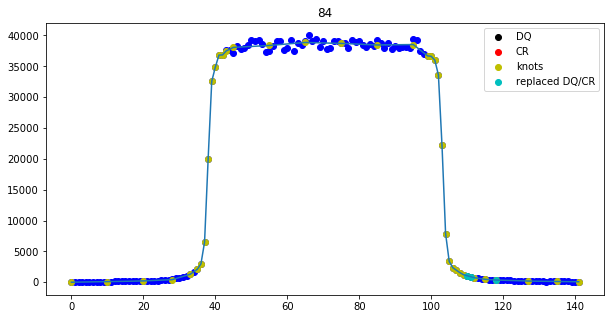

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


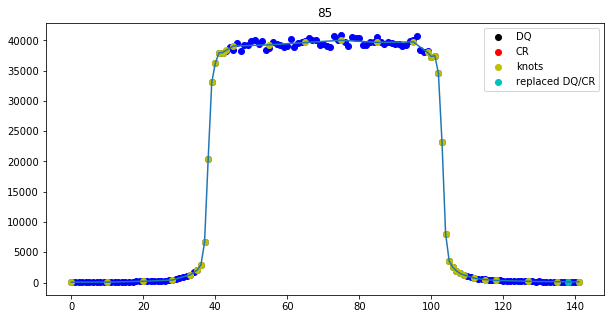

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


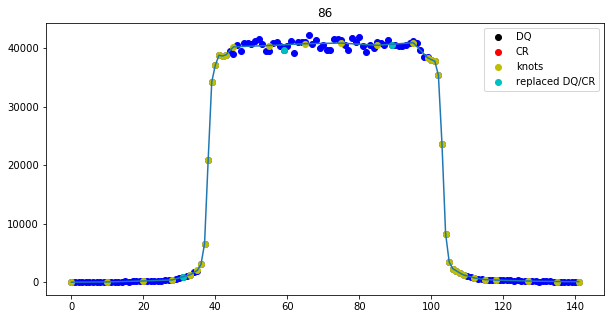

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 4]
Clipped 0 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 3639
Spectrum located at pixel 162 in spatial direction
subexp 358.42397472374034 [424, 358, 291, 225, 159, 92]
ypix is 358 for exposure 1
1 6


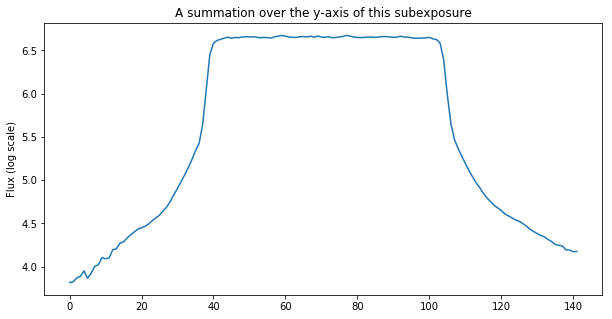

The difference between the two edges (for a 5-pixel bin for all subexps is): 1682.55546875
This value may not be larger than  6308.320008792622  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


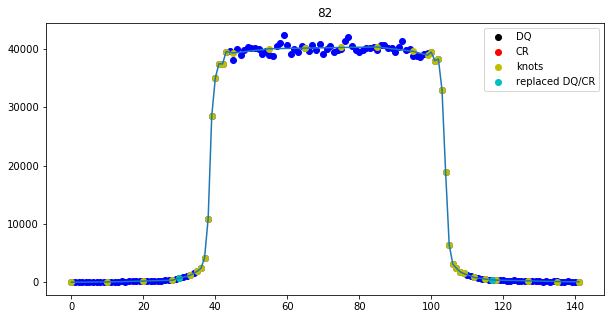

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


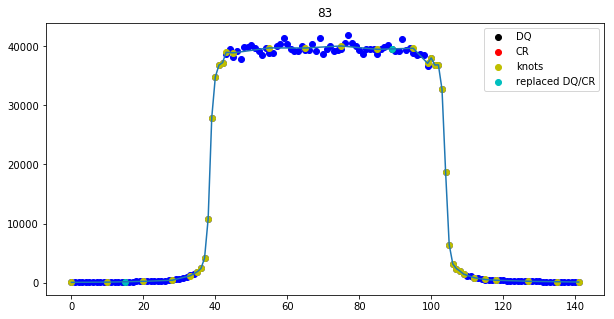

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


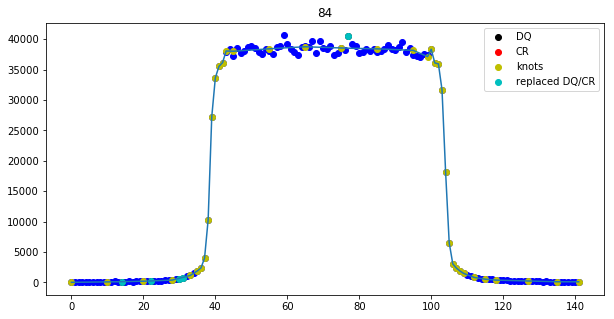

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


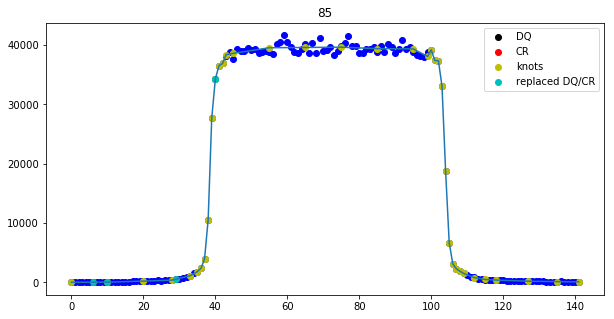

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


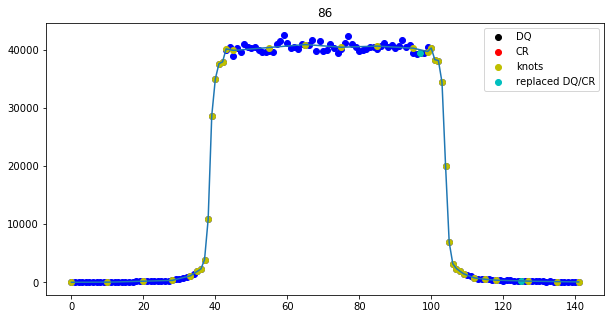

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 4]
Clipped 0 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 3618
Spectrum located at pixel 162 in spatial direction
subexp 292.9331029266949 [424, 358, 291, 225, 159, 92]
ypix is 291 for exposure 2
2 6


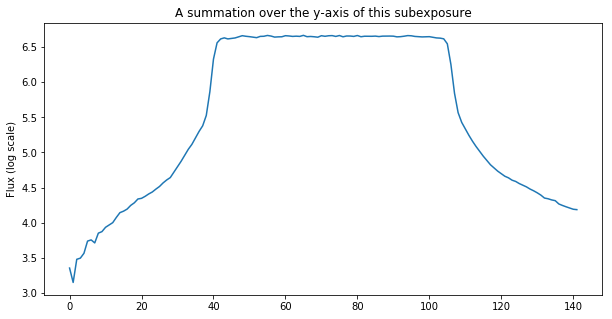

The difference between the two edges (for a 5-pixel bin for all subexps is): 2784.834375
This value may not be larger than  6311.950316661246  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


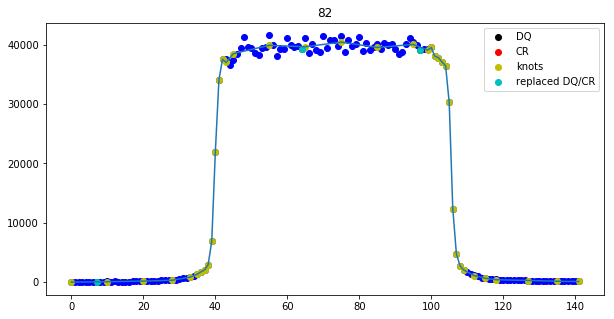

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


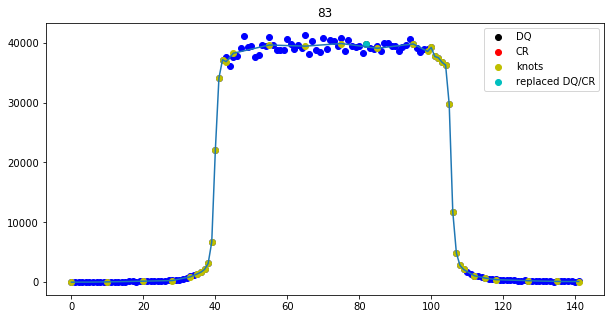

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


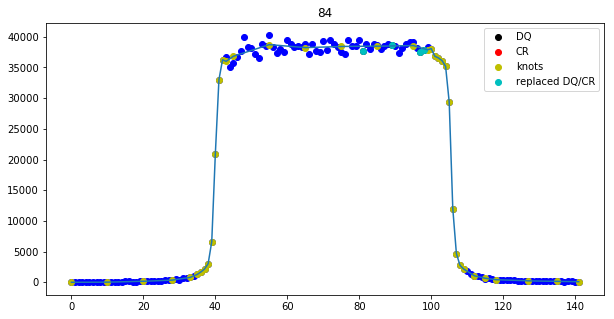

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


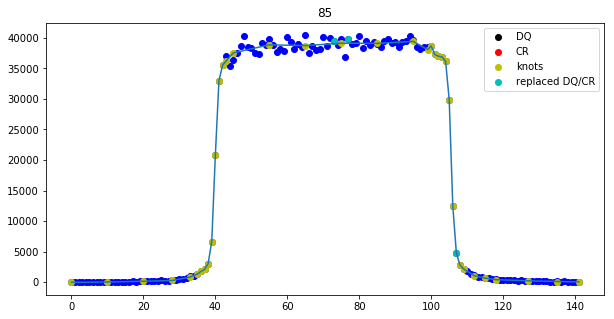

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


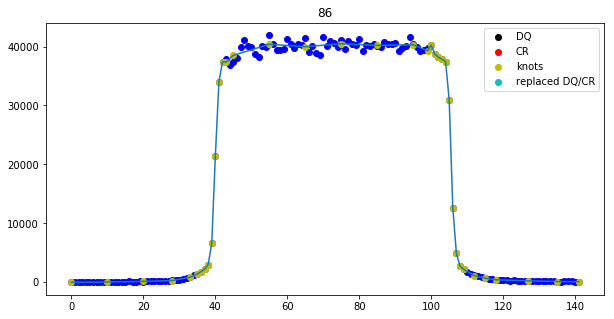

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 3598
Spectrum located at pixel 162 in spatial direction
subexp 226.4989173792172 [424, 358, 291, 225, 159, 92]
ypix is 225 for exposure 3
3 6


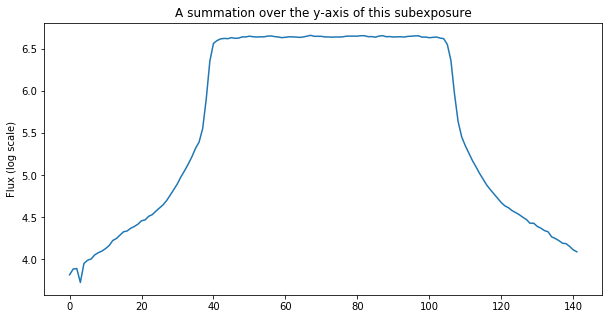

The difference between the two edges (for a 5-pixel bin for all subexps is): 1285.52138671875
This value may not be larger than  6341.486513428851  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


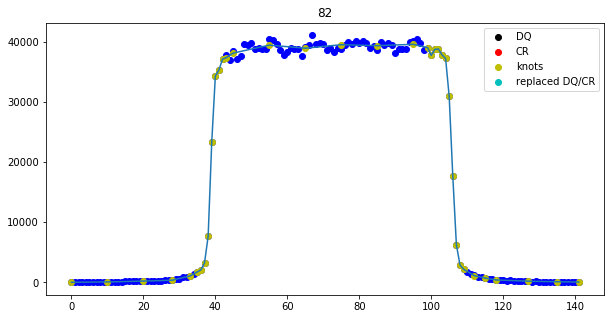

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


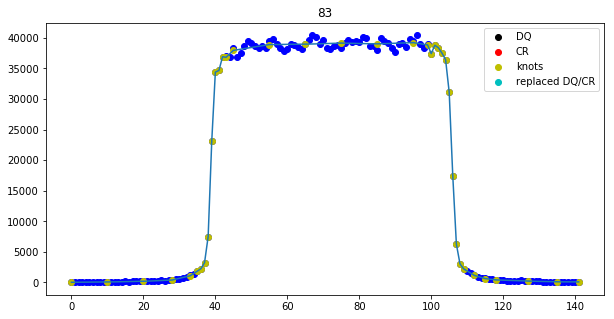

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


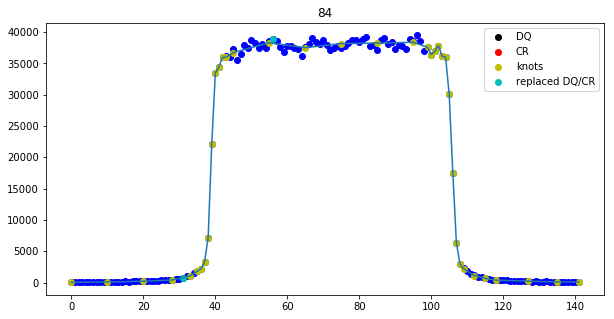

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


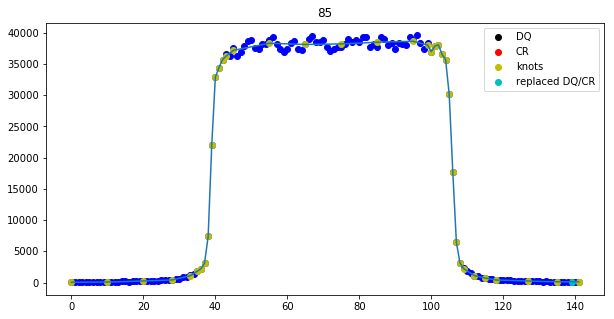

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


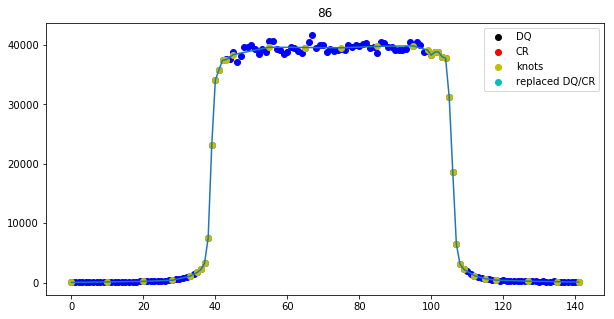

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 5
nr. of CRs 3591
Spectrum located at pixel 162 in spatial direction
subexp 159.27962883717333 [424, 358, 291, 225, 159, 92]
ypix is 159 for exposure 4
4 6


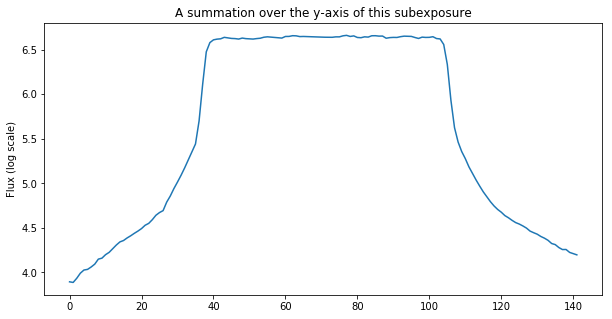

The difference between the two edges (for a 5-pixel bin for all subexps is): 1681.4572265625
This value may not be larger than  6310.467748115032  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


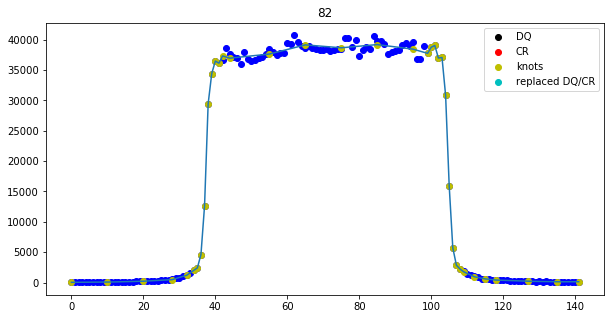

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


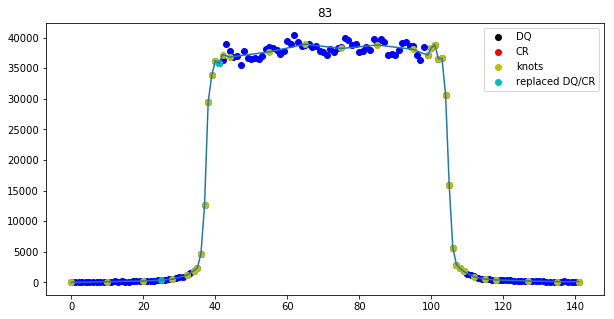

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


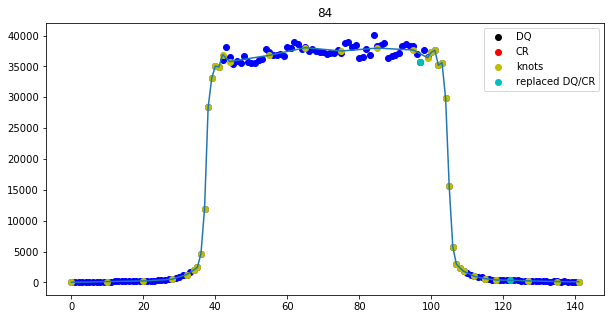

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


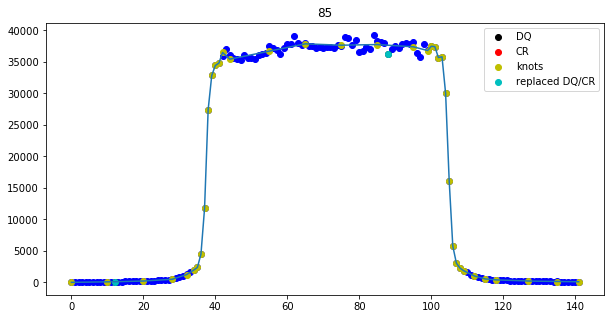

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


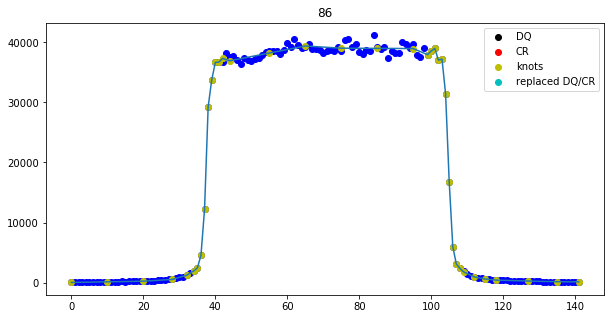

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 6
nr. of CRs 3589
Spectrum located at pixel 162 in spatial direction
subexp 91.70567730111546 [424, 358, 291, 225, 159, 92]
ypix is 92 for exposure 5
5 6


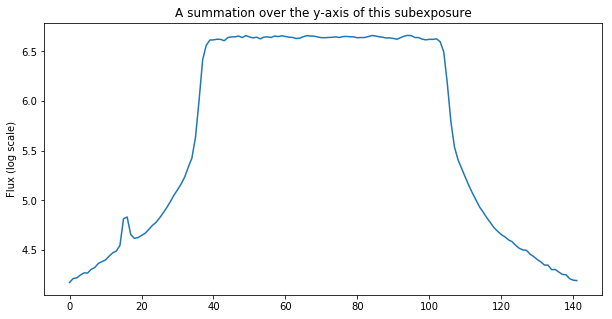

The difference between the two edges (for a 5-pixel bin for all subexps is): 161.9392578125
This value may not be larger than  6340.595639738168  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


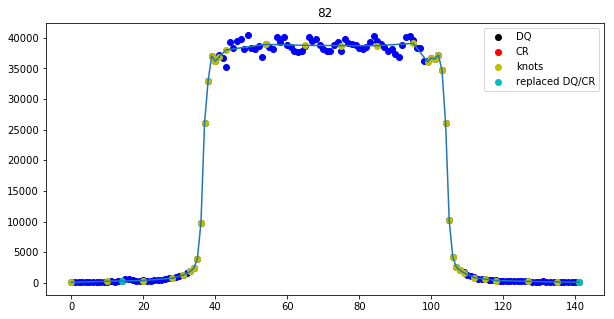

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


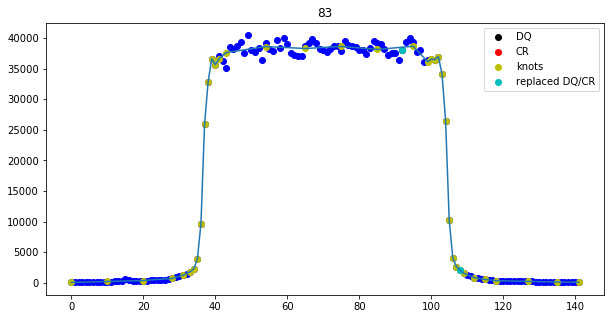

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


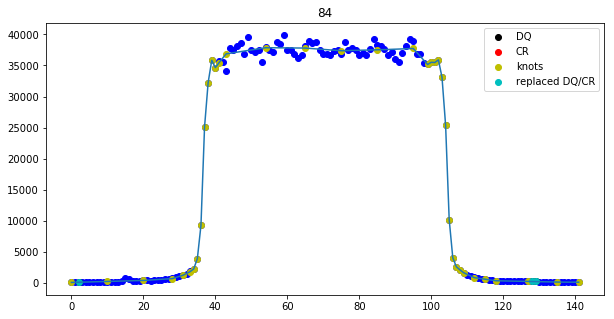

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


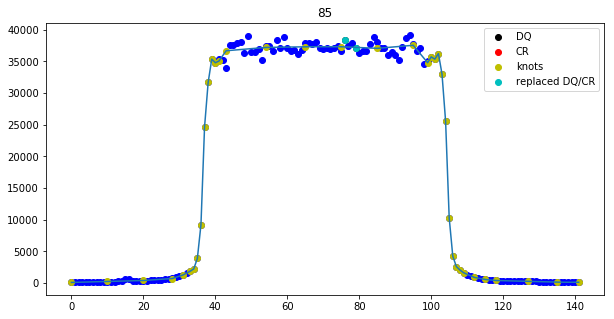

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


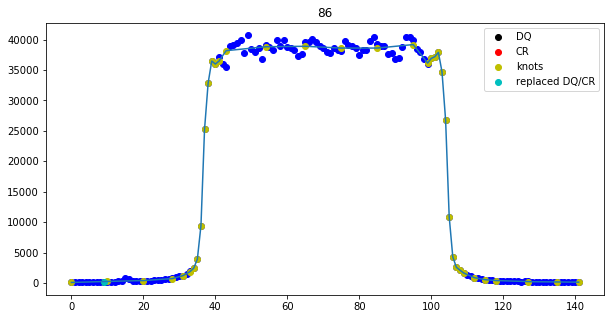

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4]
Clipped 0 cosmic rays in OE


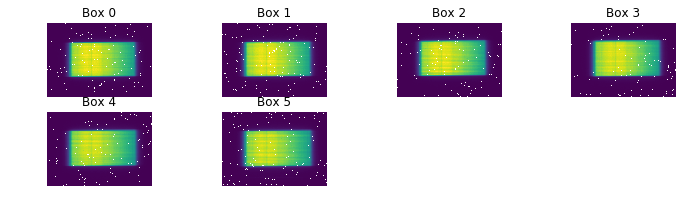

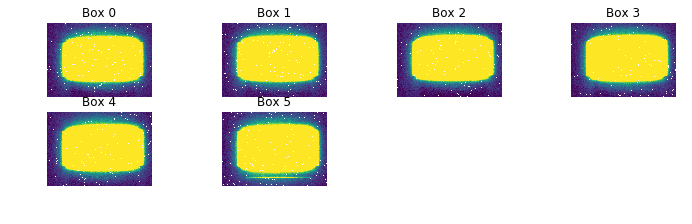

Shifted subexposure nr. 1 with -0.74709874524 pixels and shrunk 0.33345530962 percent.
Shifted subexposure nr. 2 with -1.49243971797 pixels and shrunk 0.647172235288 percent.
Shifted subexposure nr. 3 with -2.31803719851 pixels and shrunk 0.970879049585 percent.
Shifted subexposure nr. 4 with -3.26342372582 pixels and shrunk 1.32013011312 percent.
Shifted subexposure nr. 5 with -4.32013973286 pixels and shrunk 1.70610940743 percent.


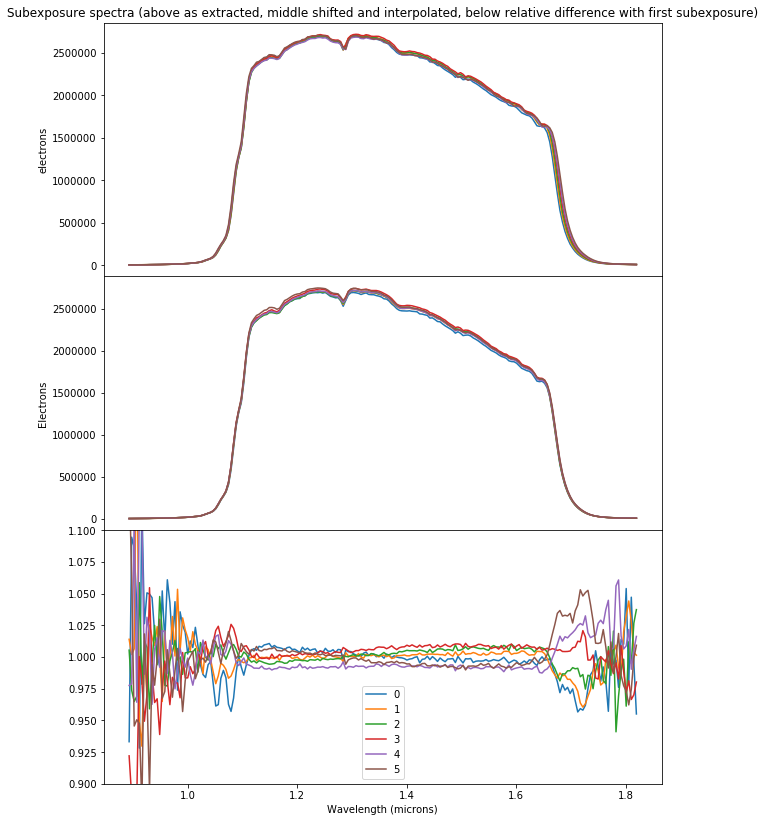

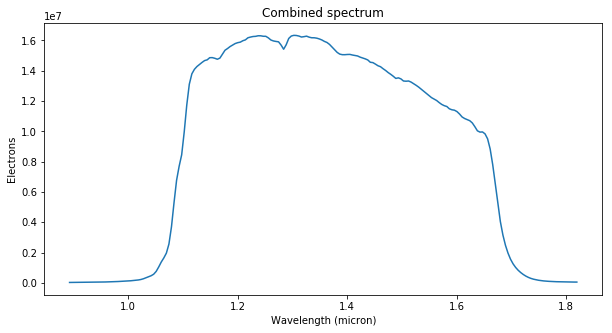

Extraction took 6.58s
########################################
###########Finished Extraction##########
########################################
########################################
############Started Reduction##########
########################################
Data reduction pipeline performed on exposure /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102m8q_ima.fits
For configuration, see pipeline conf file: /Users/bob/Documents/PhD/HAT-P-2b/transmission_reduction.conf


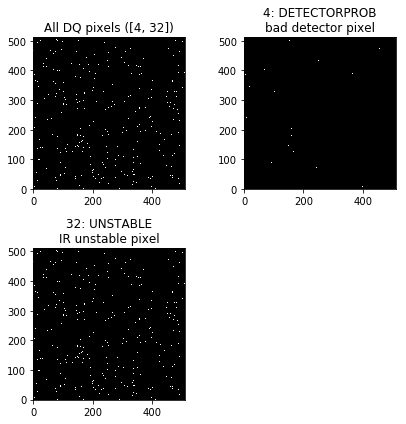

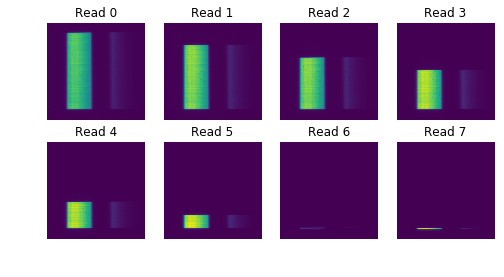

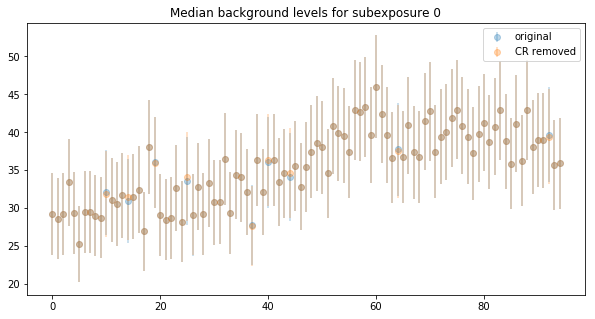

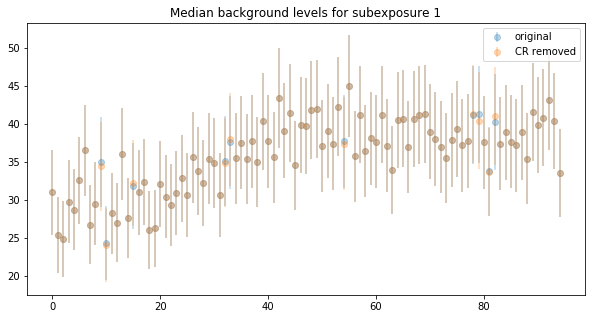

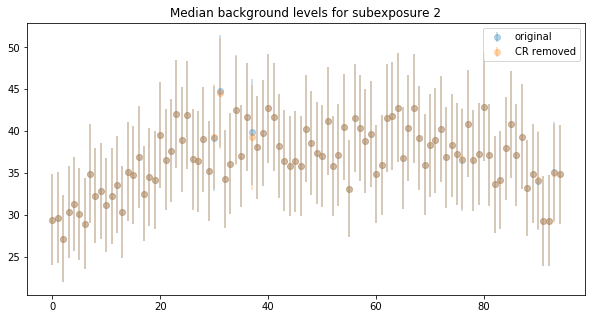

...

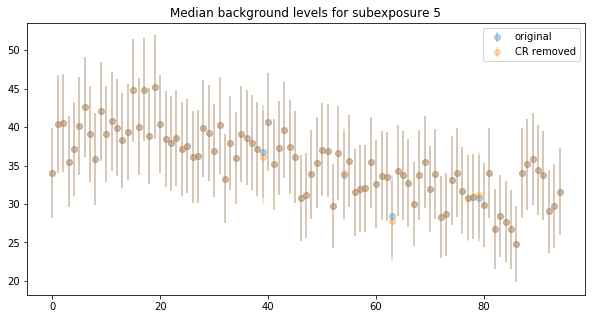

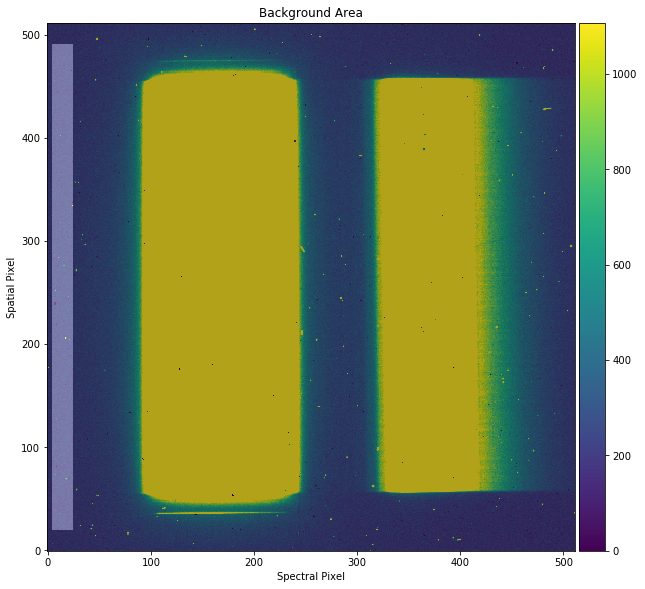

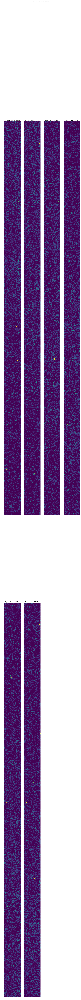

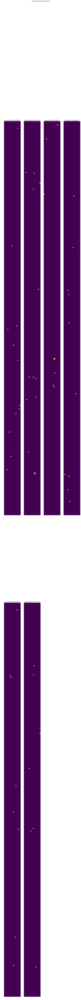

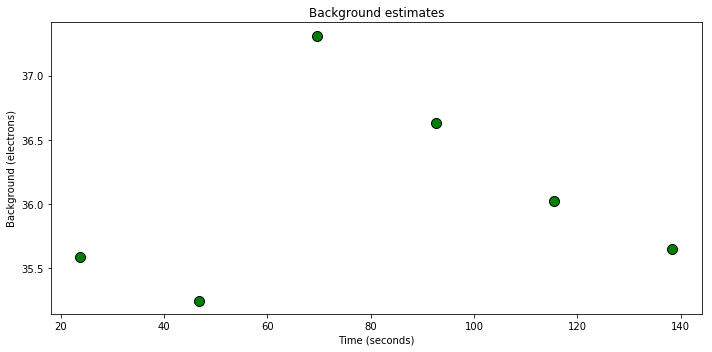

Forward scan
Catalogue used: /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lzq_flt_1.cat
Direct Image name: ied102lzq
catalogue /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102lzq_flt_1.cat
Catalogue file: ied102lzq_flt.fits
########################
Direct image location of (63.2469130861,275.195842386)
FWHM of this subexposure is  65.12711482605113


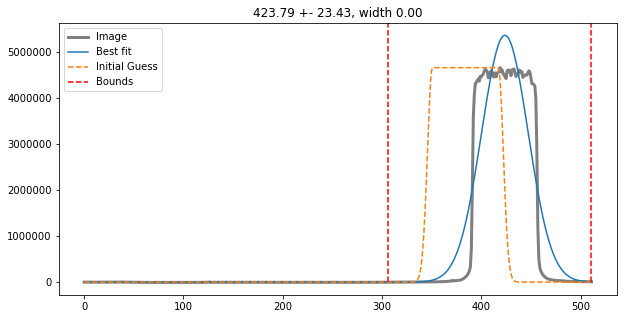

using a PHOENIX stellar model
amplitude and displacement on first order: -15.265468176050614 -1.0112369197377964


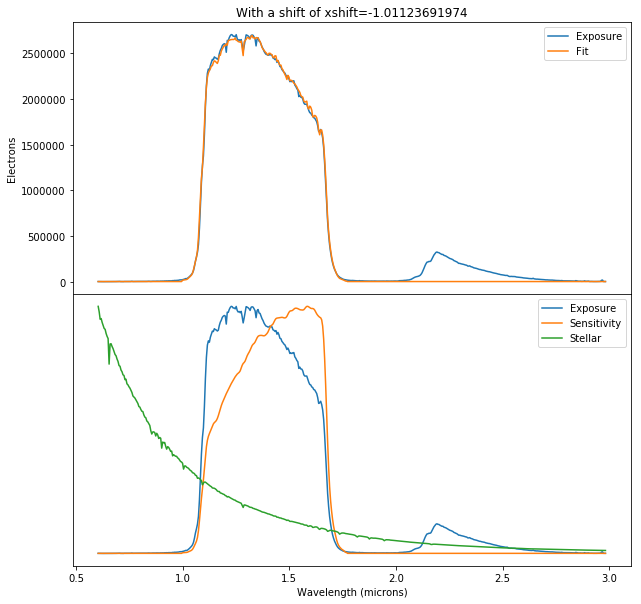

Applied an xshift of -1.01123691974 pix from a comparison to a stellar spectrum
Initial xpix is 62 and shift_in_x: -1.01123691974
-250.0 1
FWHM of this subexposure is  65.12714322977422


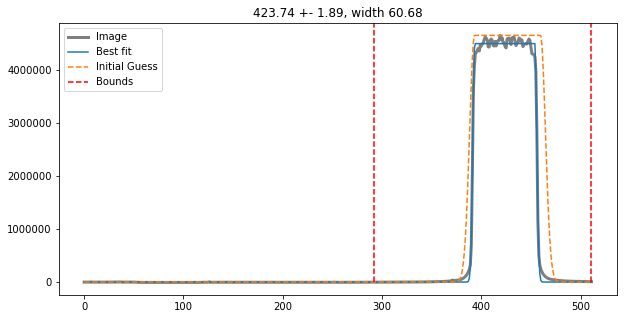

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.35403441105382


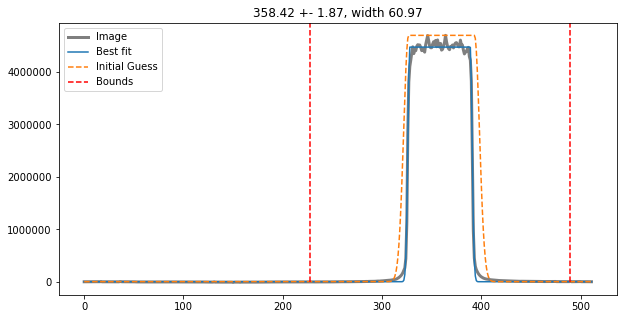

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.56157744066627


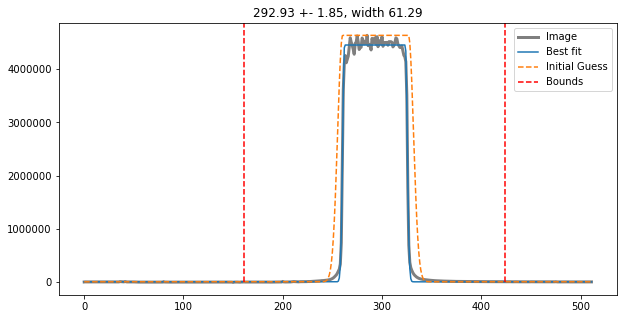

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  66.97377959523294


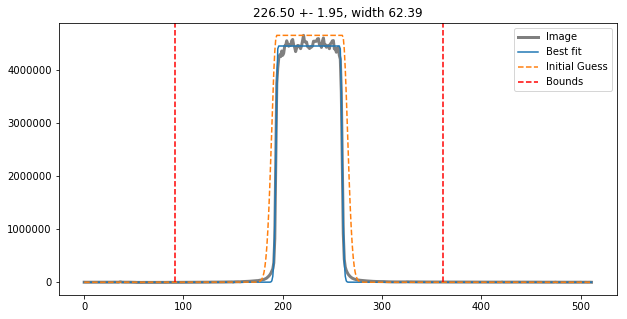

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.30971443196904


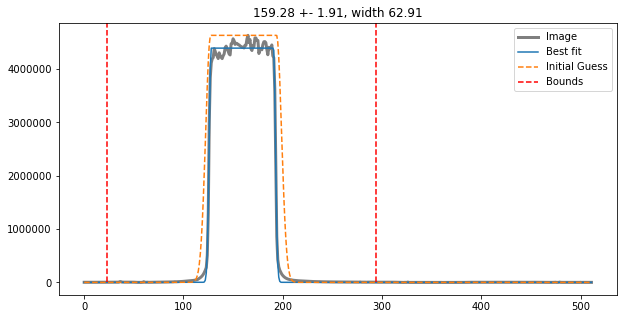

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.71955854114697


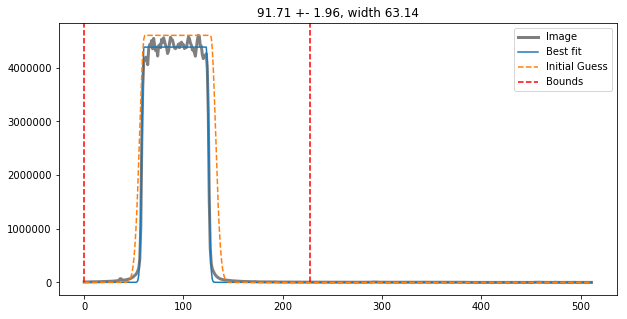

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
The final xpix is 62
-250.0 1
FWHM of this subexposure is  65.12714322977422


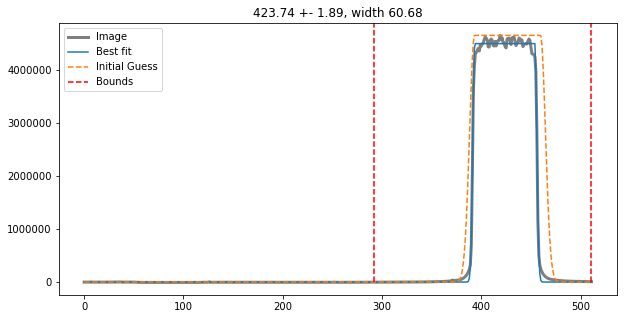

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.35403441105382


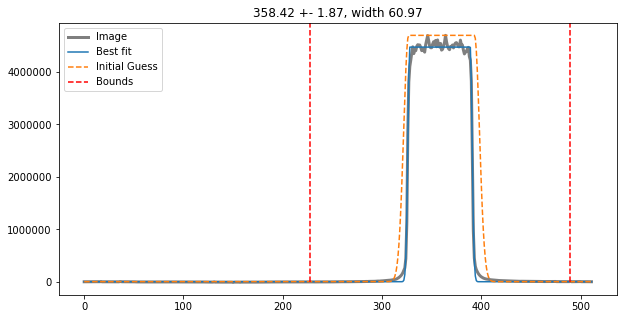

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  65.56157744066627


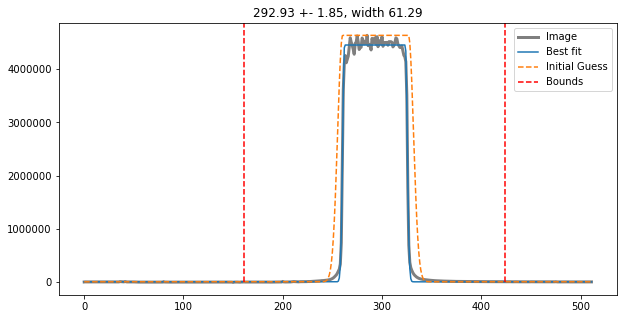

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  66.97377959523294


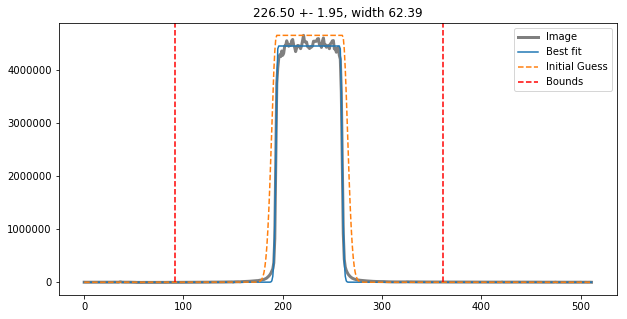

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.30971443196904


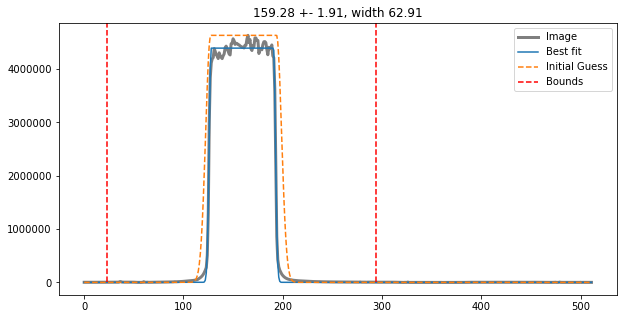

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]
-250.0 1
FWHM of this subexposure is  67.71955854114697


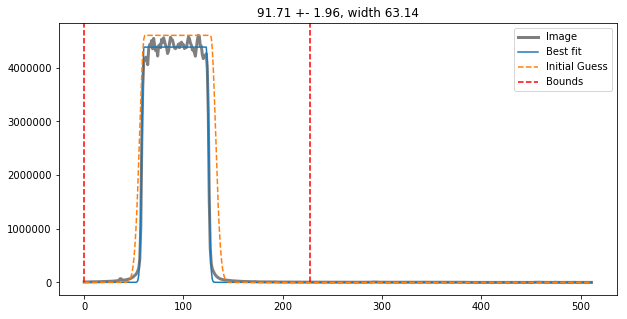

SHIFTINX -1.0112369197377964
waveschange [1.35836375 1.36302163 1.36767953 1.37233744]


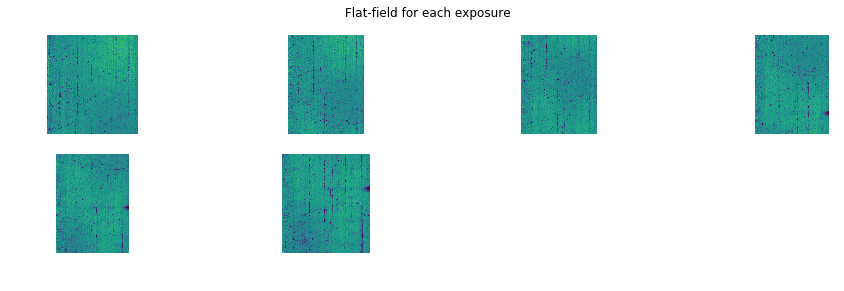

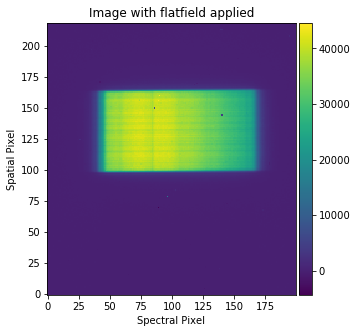

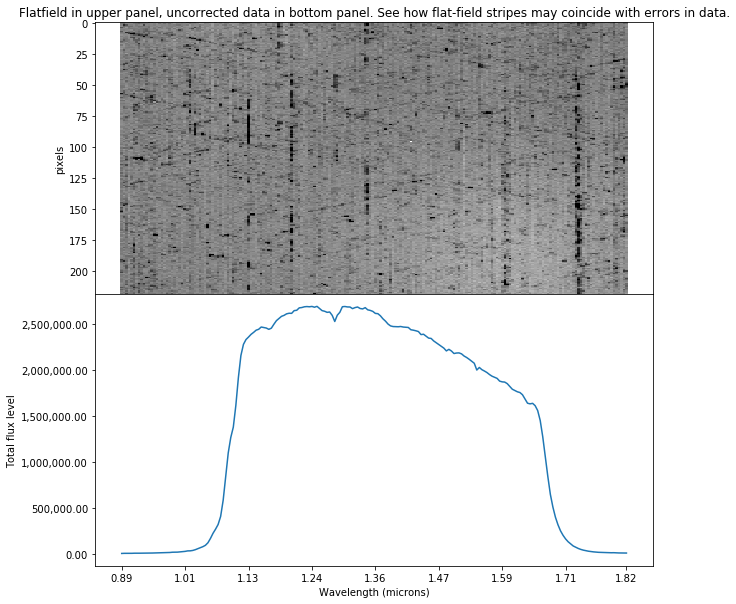

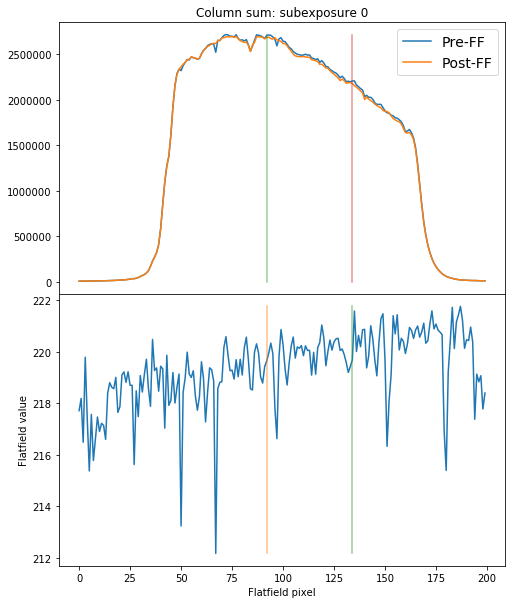

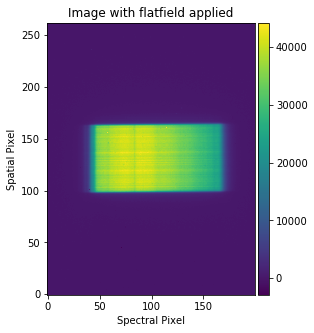

...

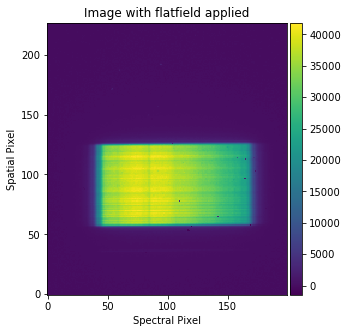

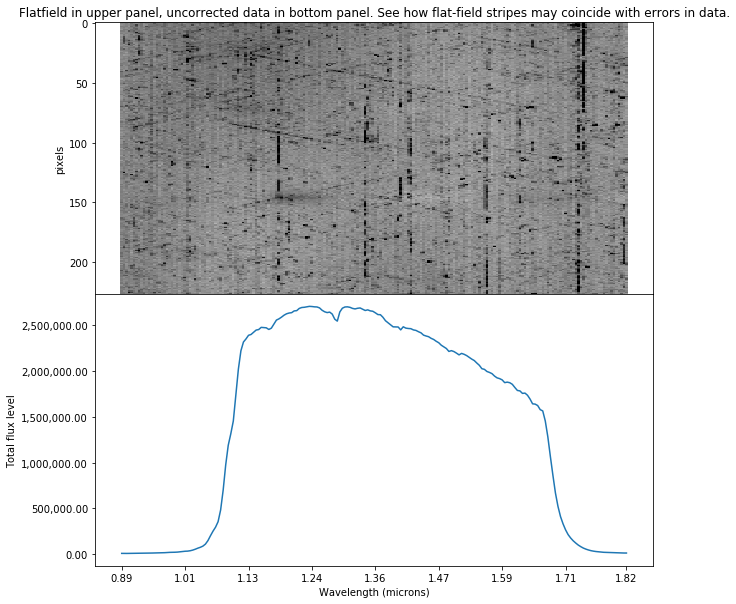

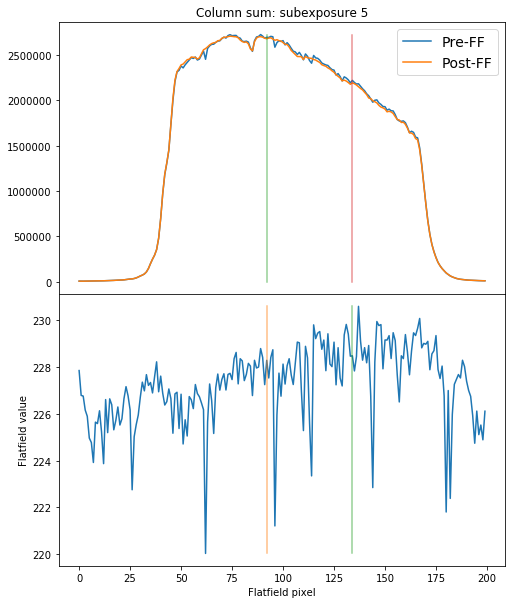

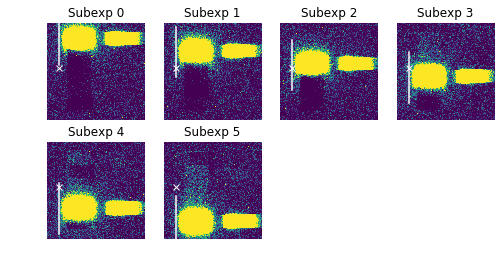

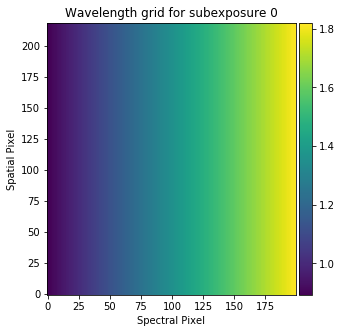

nr_CRs, Lows 310 8
nr_CRs, Lows 259 8
nr_CRs, Lows 291 5
nr_CRs, Lows 234 11
nr_CRs, Lows 284 10
nr_CRs, Lows 237 6


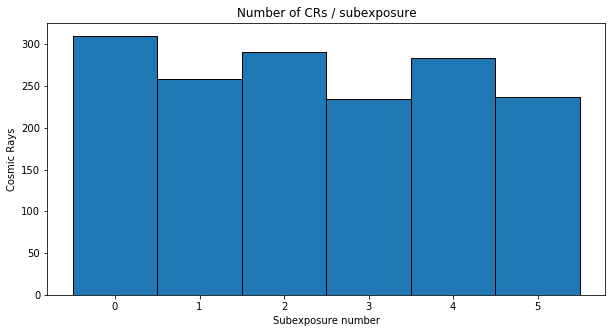

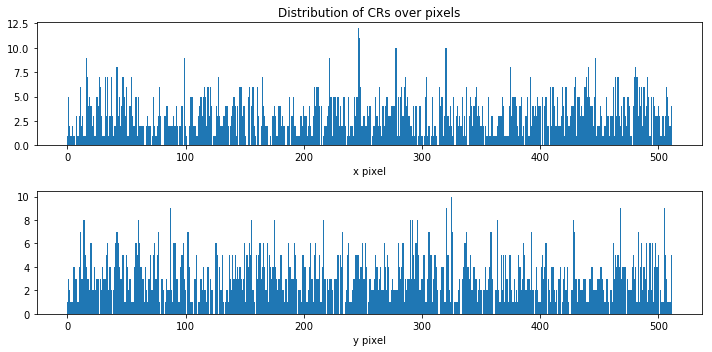

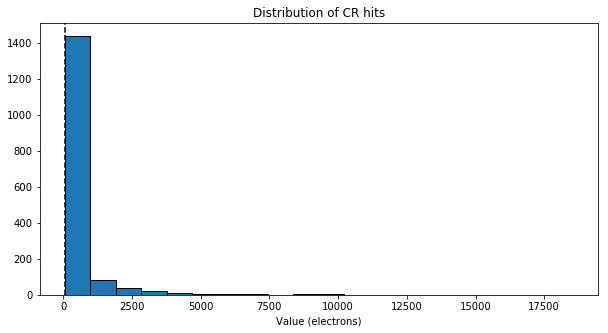

This should have a median energy of 1000 electrons
Nr. of DQs, CRs and CRs minus DQs 18378, 1615 and 1601
Percentage of pixels affected by CRs:0.610733032227 %, which should be ~0.53814642% if there is no South Atlantic anomaly.


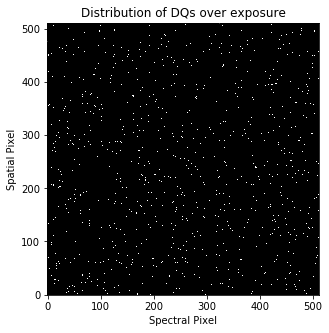

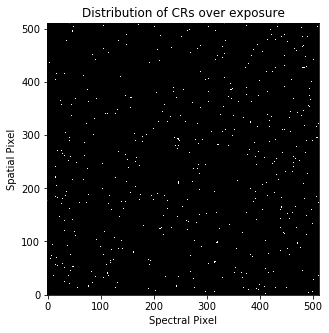

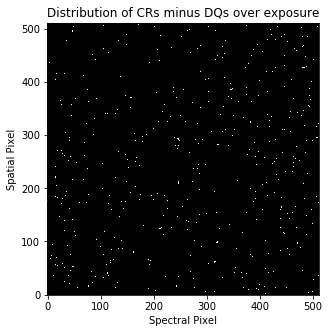

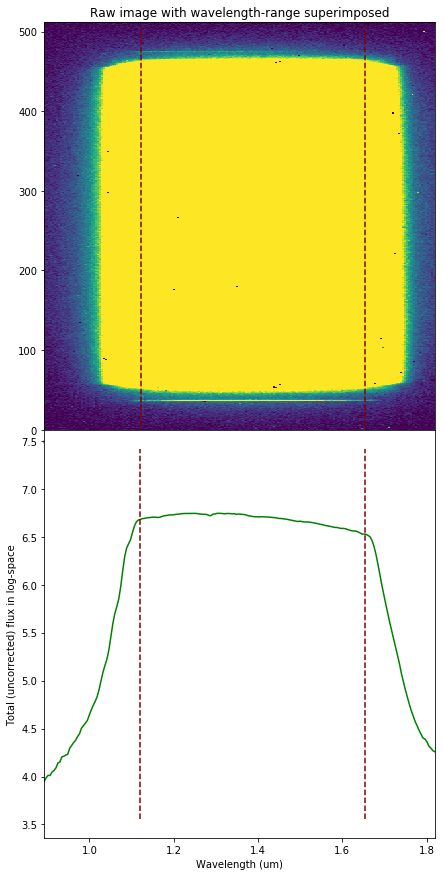

138.380508
138.380508 138.380508
Reduction took 34.30s
########################################
###########Finished Reduction###########
########################################
########################################
############Started Extraction##########
########################################
Spectral extraction pipeline performed on exposure /Users/bob/Documents/PhD/HAT-P-2b/HSTdata/ied102m8q_ima.fits
For configuration, see conf file: /Users/bob/Documents/PhD/HAT-P-2b/transmission_extraction.conf
Forward scan
Extracting from subexposure 1
Extracting spectrum with a 142 high extraction box
nr. of CRs 3381
Spectrum located at pixel 162 in spatial direction
subexp 423.7406733694926 [424, 358, 291, 225, 159, 92]
ypix is 424 for exposure 0
0 6


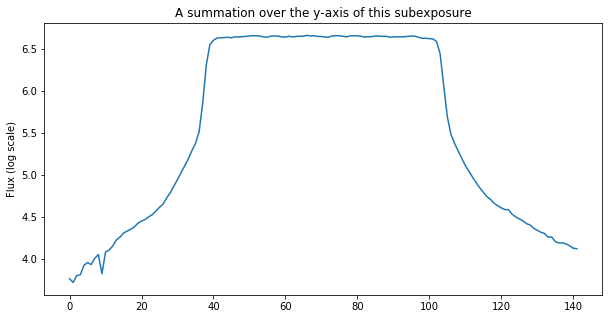

The difference between the two edges (for a 5-pixel bin for all subexps is): 1601.53212890625
This value may not be larger than  6277.747026866671  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Using flux for variance estimate
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


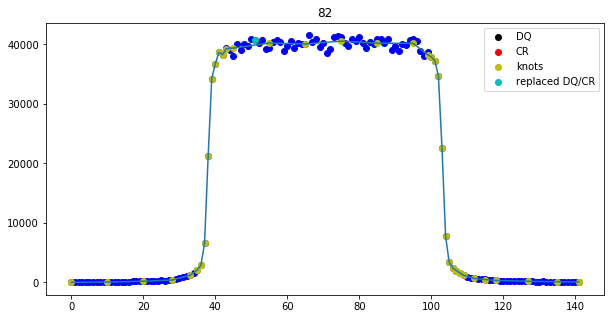

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


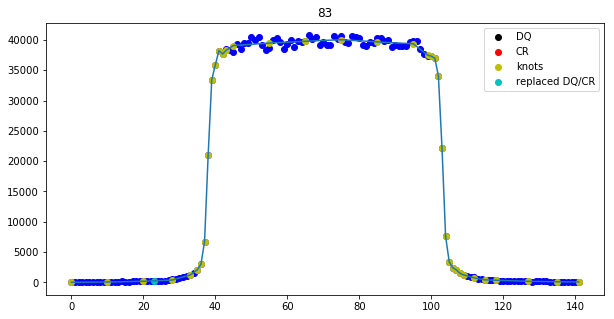

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


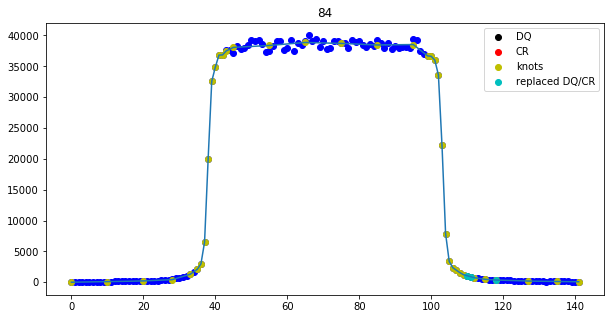

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


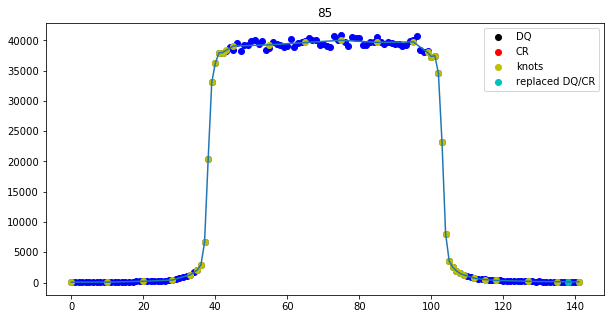

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


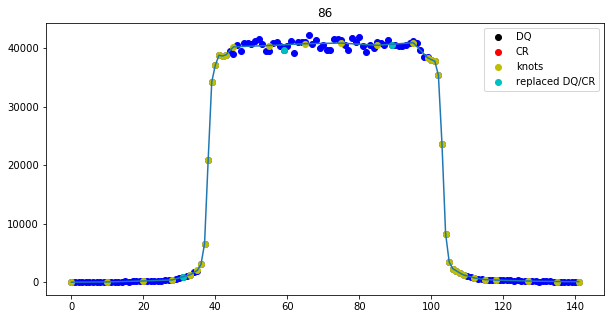

198 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 4]
Clipped 0 cosmic rays in OE
Extracting from subexposure 2
nr. of CRs 3639
Spectrum located at pixel 162 in spatial direction
subexp 358.42397472374034 [424, 358, 291, 225, 159, 92]
ypix is 358 for exposure 1
1 6


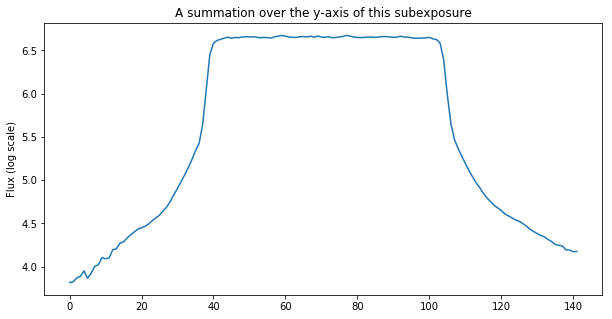

The difference between the two edges (for a 5-pixel bin for all subexps is): 1682.55546875
This value may not be larger than  6308.320008792622  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


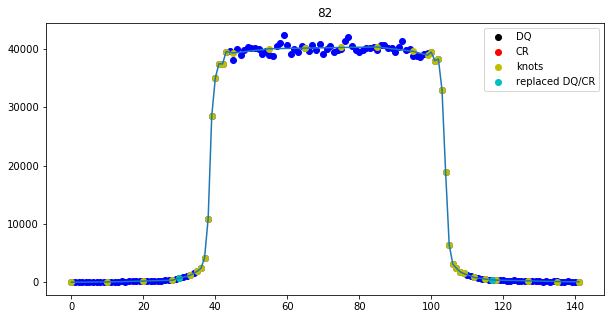

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


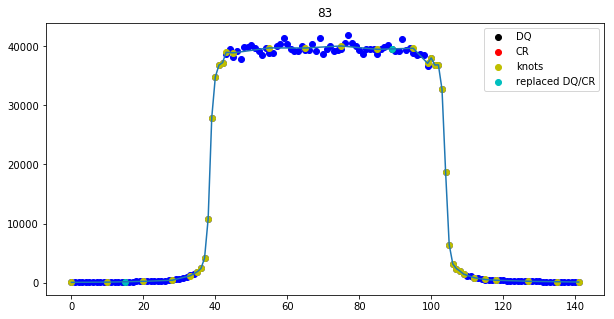

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


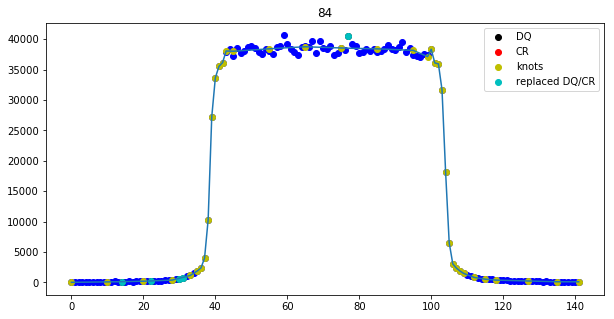

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


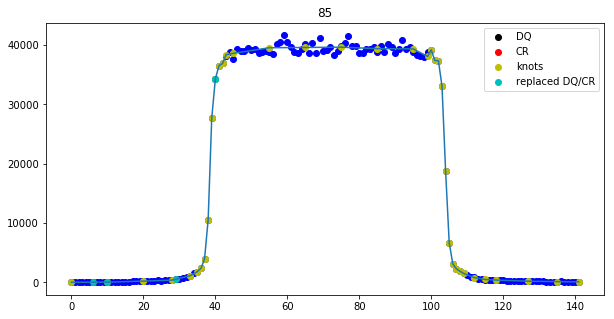

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


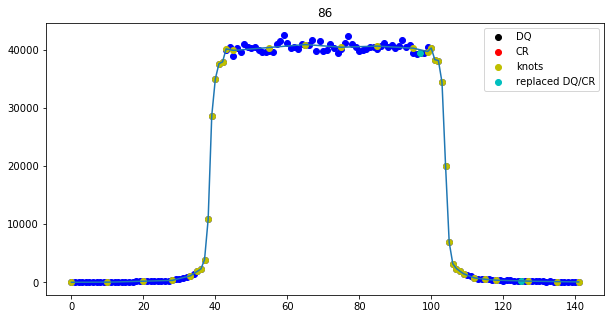

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 4]
Clipped 0 cosmic rays in OE
Extracting from subexposure 3
nr. of CRs 3618
Spectrum located at pixel 162 in spatial direction
subexp 292.9331029266949 [424, 358, 291, 225, 159, 92]
ypix is 291 for exposure 2
2 6


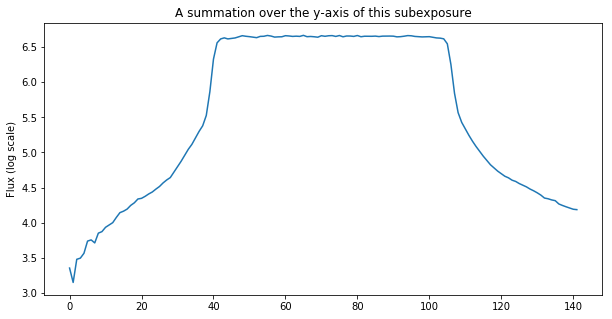

The difference between the two edges (for a 5-pixel bin for all subexps is): 2784.834375
This value may not be larger than  6311.950316661246  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


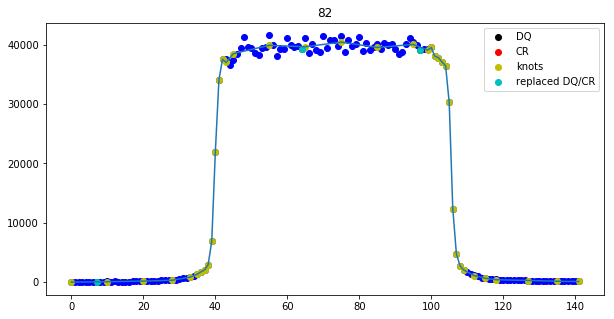

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


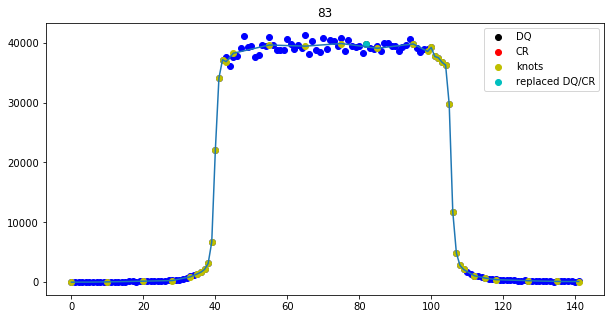

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


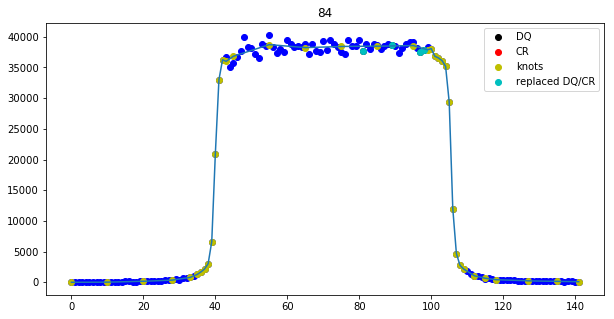

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


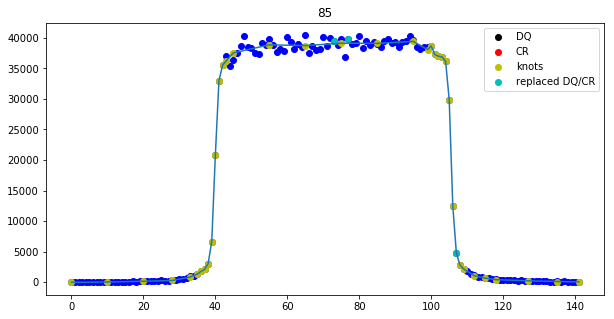

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


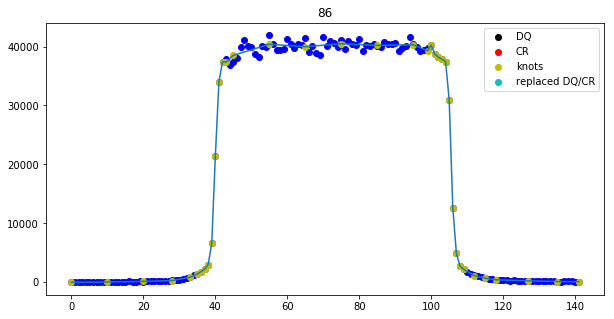

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 4
nr. of CRs 3598
Spectrum located at pixel 162 in spatial direction
subexp 226.4989173792172 [424, 358, 291, 225, 159, 92]
ypix is 225 for exposure 3
3 6


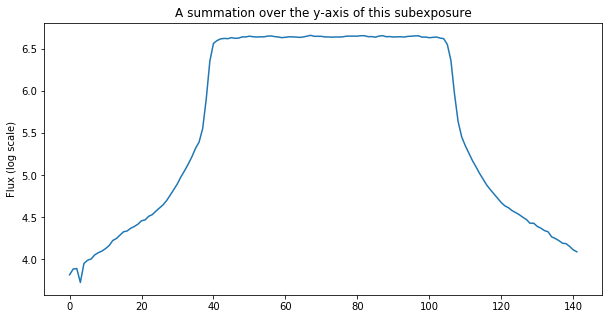

The difference between the two edges (for a 5-pixel bin for all subexps is): 1285.52138671875
This value may not be larger than  6341.486513428851  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


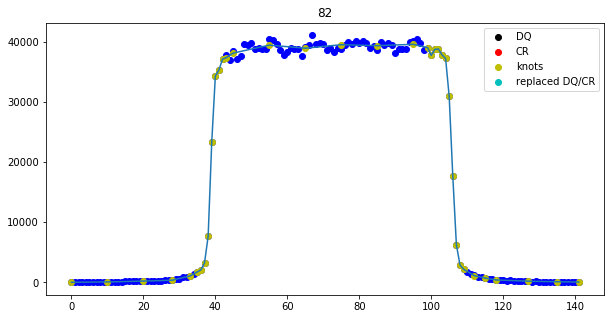

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


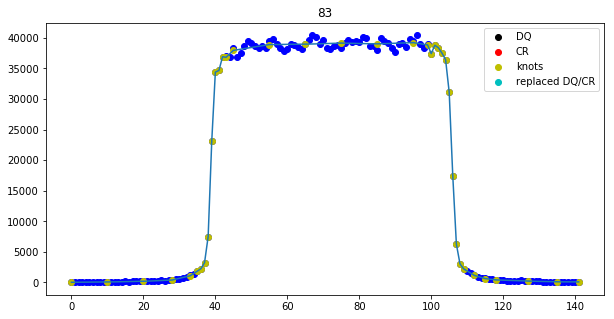

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


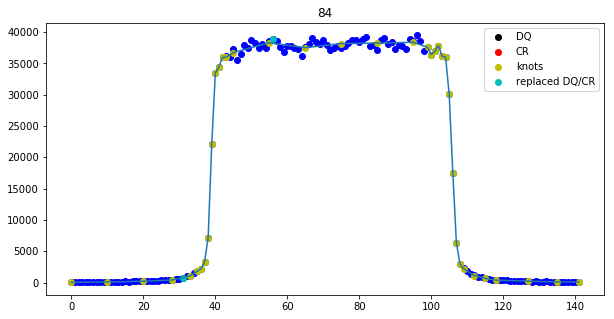

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


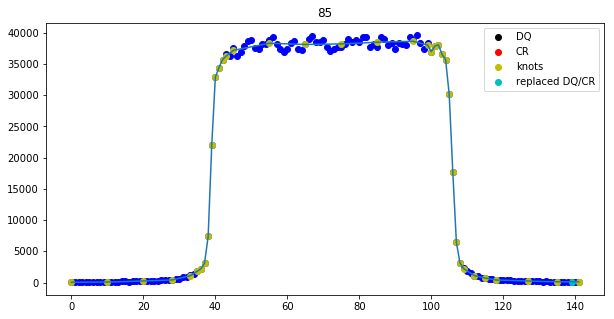

Knots used are: [  0.  10.  20.  28.  33.  35.  36.  37.  38.  39.  40.  41.  42.  43.
  45.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


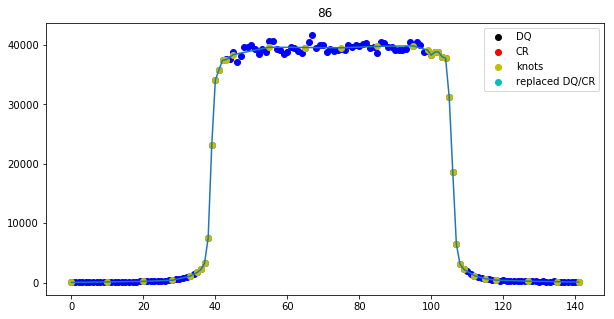

196 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 5
nr. of CRs 3591
Spectrum located at pixel 162 in spatial direction
subexp 159.27962883717333 [424, 358, 291, 225, 159, 92]
ypix is 159 for exposure 4
4 6


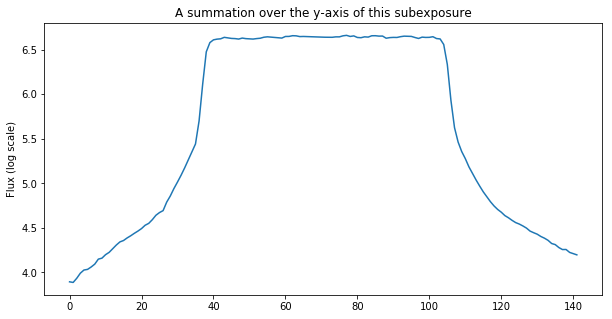

The difference between the two edges (for a 5-pixel bin for all subexps is): 1681.4572265625
This value may not be larger than  6310.467748115032  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


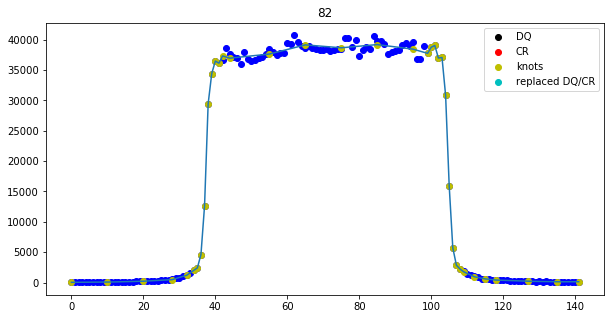

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


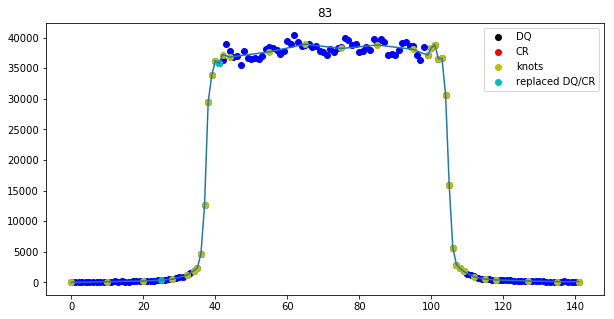

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


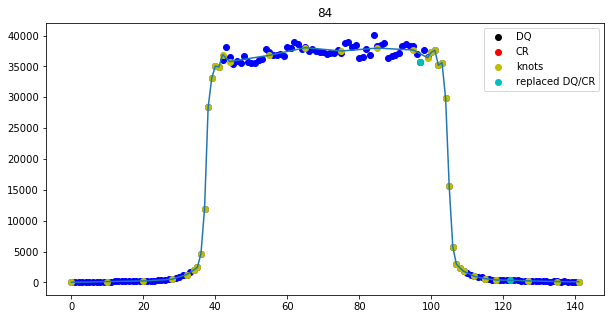

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


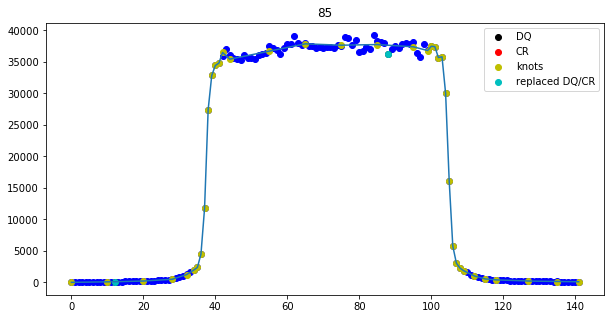

Knots used are: [  0.  10.  20.  28.  32.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  44.  55.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


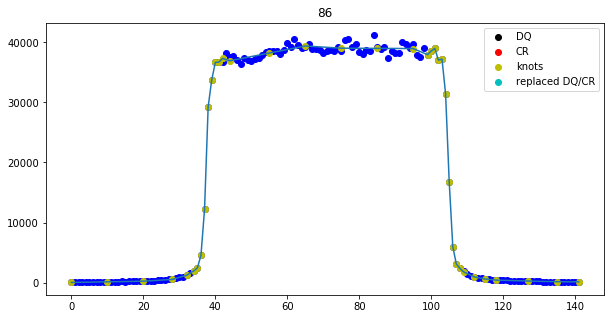

197 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 2, 3]
Clipped 0 cosmic rays in OE
Extracting from subexposure 6
nr. of CRs 3589
Spectrum located at pixel 162 in spatial direction
subexp 91.70567730111546 [424, 358, 291, 225, 159, 92]
ypix is 92 for exposure 5
5 6


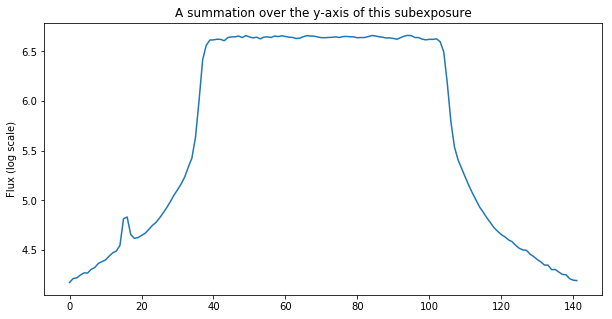

The difference between the two edges (for a 5-pixel bin for all subexps is): 161.9392578125
This value may not be larger than  6340.595639738168  or else you'll have variations induced by the moving of this subexposure on the y-axis.
Extracting spectrum with optimal extraction...
Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


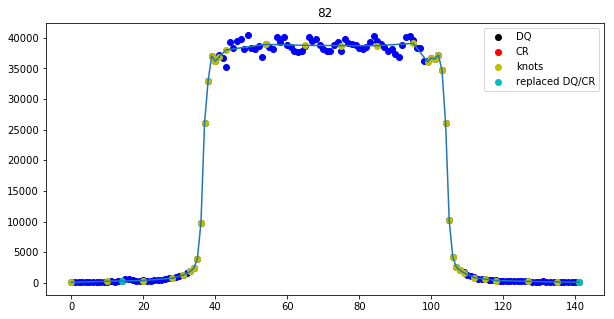

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


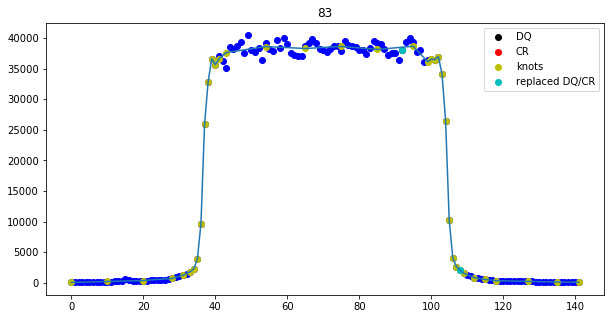

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


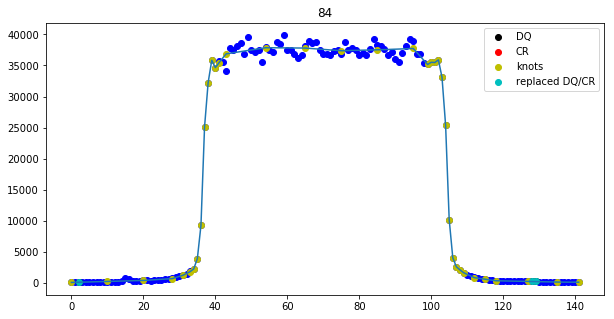

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


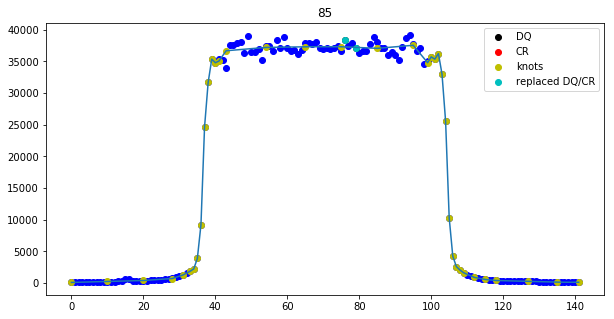

Knots used are: [  0.  10.  20.  28.  31.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  43.  54.  65.  75.  85.  95.  99. 100. 101. 102. 103. 104. 105. 106.
 107. 108. 109. 112. 115. 118. 127. 135. 141.]


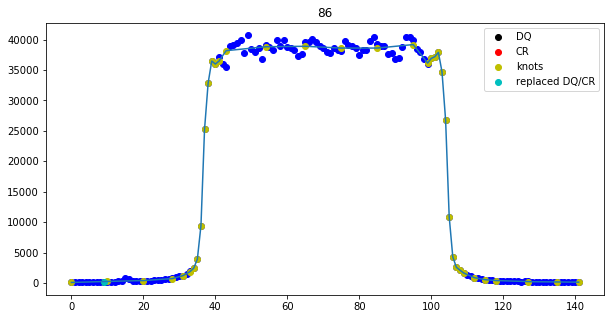

195 successes out of 200 total fits
Optimal extraction fitting failed for columns: [0, 1, 2, 3, 4]
Clipped 0 cosmic rays in OE


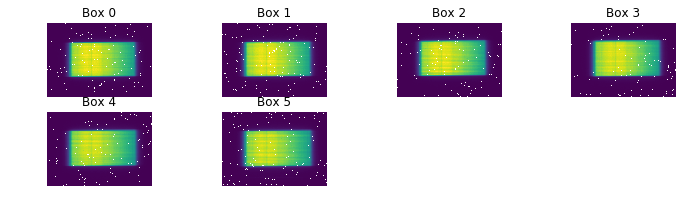

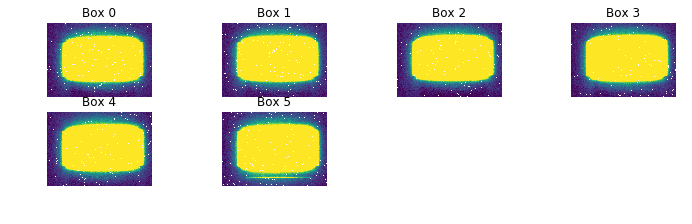

Shifted subexposure nr. 1 with -0.74709874524 pixels and shrunk 0.33345530962 percent.
Shifted subexposure nr. 2 with -1.49243971797 pixels and shrunk 0.647172235288 percent.
Shifted subexposure nr. 3 with -2.31803719851 pixels and shrunk 0.970879049585 percent.
Shifted subexposure nr. 4 with -3.26342372582 pixels and shrunk 1.32013011312 percent.
Shifted subexposure nr. 5 with -4.32013973286 pixels and shrunk 1.70610940743 percent.


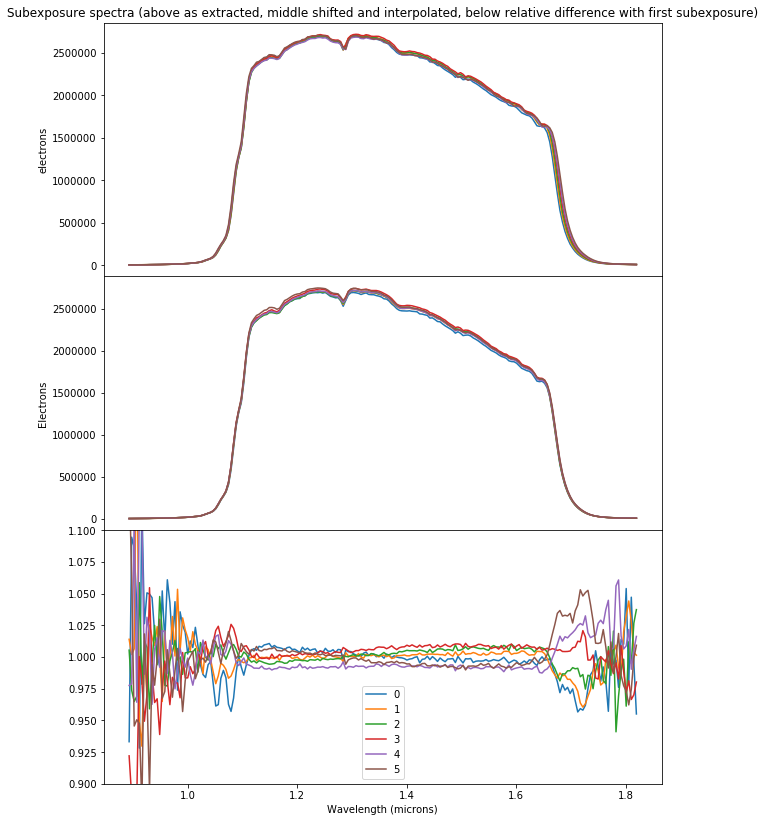

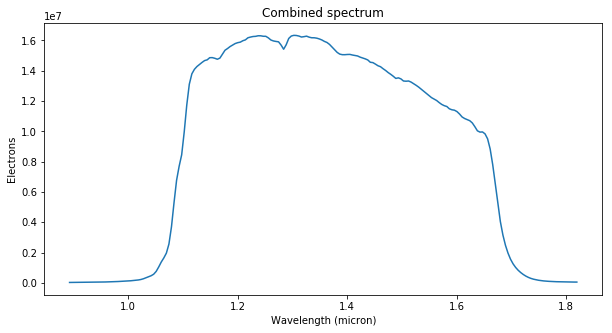

Extraction took 6.50s
########################################
###########Finished Extraction##########
########################################


In [21]:
reload(pipe)
it = 0
for Image in ref_Images:
    visit = int(Image.split('ied10')[1][0])
    if visit == 1:
        #Bg_x, Bg_y, Bg_w, Bg_h = (305, 10, 200, 30)
        Bg_x, Bg_y, Bg_w, Bg_h = (5, 20, 20, 512 - 40)
        Ref_exp = ref_Images[0].split('_ima.fits')[0]
    if visit == 2:
        #Bg_x, Bg_y, Bg_w, Bg_h = (305, 10, 200, 30)
        Bg_x, Bg_y, Bg_w, Bg_h = (5, 20, 20, 512 - 40)
        Ref_exp = ref_Images[1].split('_ima.fits')[0]
        
    if Image == Ref_exp + '_ima.fits':
        Save_sub = True
    else:
        Save_sub = False
    
    
    exp = pipe.reduce_exposure(Image, pdf=False, logger=False, debug=True,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           source_dir=data_dir, write = False)

    if noknots:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    save_dir=output_dir, save_sub=False, write=False)
    #noknots=True
    #if noknots:
    #    exp_spectrum, variance, interp_spectra, variances = \
    #                pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
    #                conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
    #                save_dir=output_dir, save_sub=True)
    else:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1], ypix_F=ypix_F, ypix_R=ypix_R,
                    save_dir=output_dir, save_sub=False, write=False)
    

In [22]:

%%capture
reload(pipe)


BGs0 = []
BGs1 = []
BGs2 = []
BGs3 = []
BGs4 = []
BGs5 = []
CRs = []
Ts  = []
it = 0
Forward = []
refshifts = []
refshifterrs = []
ypixs = []
ypix_errs = []
CRarrays = np.zeros(512)
for Image in Images:
    visit = int(Image.split('ied10')[1][0])
    if visit == 1:
        Bg_x, Bg_y, Bg_w, Bg_h = (5, 20, 20, 512 - 40)
        Ref_exp = ref_Images[0].split('_ima.fits')[0]
    if visit == 2:
        Bg_x, Bg_y, Bg_w, Bg_h = (5, 20, 20, 512 - 40)
        Ref_exp = ref_Images[1].split('_ima.fits')[0]
    if Image == Ref_exp + '_ima.fits':
        Save_sub = True
    else:
        Save_sub = False
    if Image == 'ied102miq_ima.fits':
        rsl = [3]
    else:
        rsl = []
    
    
    exp = pipe.reduce_exposure(Image, pdf=False, logger=False, debug=False,
                           skip_start=1,
                           bg_x = Bg_x, bg_y = Bg_y, bg_w = Bg_w, bg_h = Bg_h,
                           ref_exp = Ref_exp,
                           conf_file=conf_file_red, \
                           source_dir=data_dir, write = False, remove_subexps_list=rsl)
    
    if noknots:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
                    conf_file=conf_file_ext, ref_exp=Ref_exp, write=False,
                    save_dir=output_dir, save_sub=False, remove_subexps_list=rsl)
    #noknots=True
    #if noknots:
    #    exp_spectrum, variance, interp_spectra, variances = \
    #                pipe.extract_spectra(exp, pdf=False, logger=False, debug=True,
    #                conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
    #                save_dir=output_dir, save_sub=Save_sub, remove_subexps_list=rsl)
    else:
        exp_spectrum, variance, interp_spectra, variances = \
                    pipe.extract_spectra(exp, pdf=False, logger=False, debug=False,
                    conf_file=conf_file_ext, ref_exp=Ref_exp, ypix_F=ypix_F, ypix_R=ypix_R,
                    custom_knots_F=custom_knots, custom_knots_R=custom_knots[::-1],
                                         write=False,
                    save_dir=output_dir, save_sub=False, remove_subexps_list=rsl)
    
    BGs0.append(exp.BGs[0][0,0])
    BGs1.append(exp.BGs[1][0,0])
    BGs2.append(exp.BGs[2][0,0])
    BGs3.append(exp.BGs[3][0,0])
    BGs4.append(exp.BGs[4][0,0])
    BGs5.append(exp.BGs[5][0,0])
    CRs.append(np.sum(exp.CRs))
    CRarrays += np.sum(exp.CRs, axis=0)
    refshifts.append(exp_spectrum.refshift)
    refshifterrs.append(exp_spectrum.refshifterr)
    Forward.append(exp.POSTARG2)
    ypixs.append([subexp.ypix for subexp in exp.subexposures])
    ypix_errs.append([subexp.ypix_err for subexp in exp.subexposures])
    Ts.append(exp.t)
    it +=1
    

In [30]:
dir(exp)

['BGs',
 'CRs',
 'DQs',
 'Ds',
 'POSTARG2',
 'Primary',
 '__doc__',
 '__init__',
 '__module__',
 'close',
 'dt',
 'filename',
 'reads',
 'rootname',
 'scanlength',
 'spectra',
 'sub_shifts',
 'subexposures',
 't',
 't_units',
 'variances']

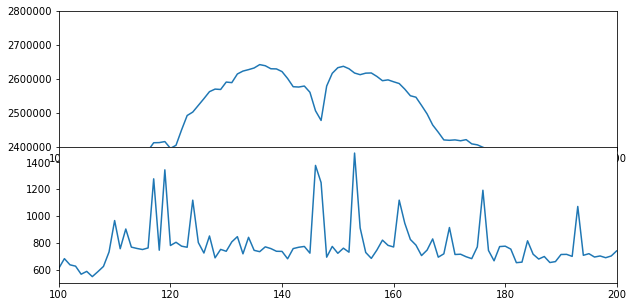

In [47]:
fig, (ax1, ax2) = plt.subplots(2,1)

ax1.plot(np.arange(512), np.sum(exp.subexposures[0].SCI.data, axis=0))
ax2.plot(np.arange(512), CRarrays)
ax2.set_xlim(100,200)
ax1.set_xlim(100,200)
ax1.set_ylim(2400000, 2800000)
plt.subplots_adjust(wspace=0, hspace=0)

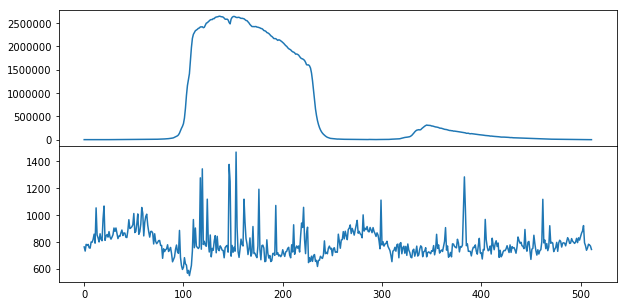

In [48]:
fig, (ax1, ax2) = plt.subplots(2,1)

ax1.plot(np.arange(512), np.sum(exp.subexposures[0].SCI.data, axis=0))
ax2.plot(np.arange(512), CRarrays)

plt.subplots_adjust(wspace=0, hspace=0)

In [13]:
Forward = np.array(Forward)
Ts = np.array(Ts)
refshifts = np.array(refshifts)
refshifterrs = np.array(refshifterrs)
BGs0 = np.array(BGs0)
BGs1 = np.array(BGs1)
BGs2 = np.array(BGs2)
BGs3 = np.array(BGs3)
BGs4 = np.array(BGs4)
BGs5 = np.array(BGs5)
CRs = np.array(CRs)
forward = Forward > 0
ypixs = np.array(ypixs)

Text(0,0.5,'Pixel value')

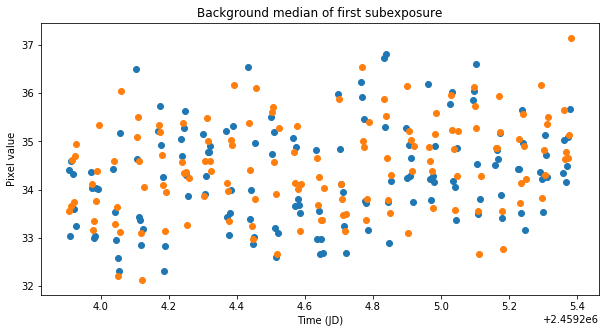

In [14]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs0[forward])
plt.scatter(Ts[~forward], BGs0[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

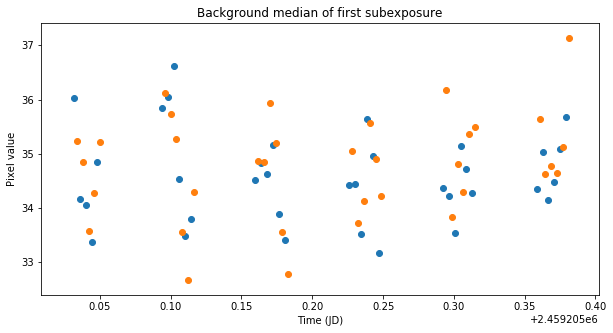

In [15]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward][-35:], BGs0[forward][-35:])
plt.scatter(Ts[~forward][-35:], BGs0[~forward][-35:])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

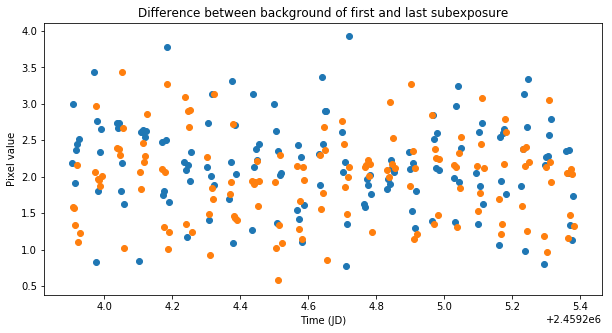

In [16]:
plt.scatter(Ts[forward], np.array(BGs2[forward]) - np.array(BGs0[forward]))
plt.scatter(Ts[~forward], np.array(BGs2[~forward]) - np.array(BGs0[~forward]))
plt.title('Difference between background of first and last subexposure')
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

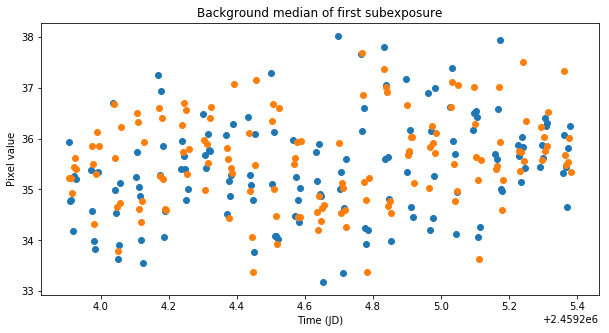

In [17]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs1[forward])
plt.scatter(Ts[~forward], BGs1[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

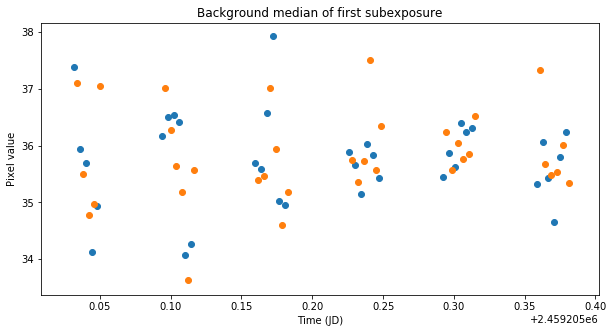

In [18]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward][-35:], BGs1[forward][-35:])
plt.scatter(Ts[~forward][-35:], BGs1[~forward][-35:])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

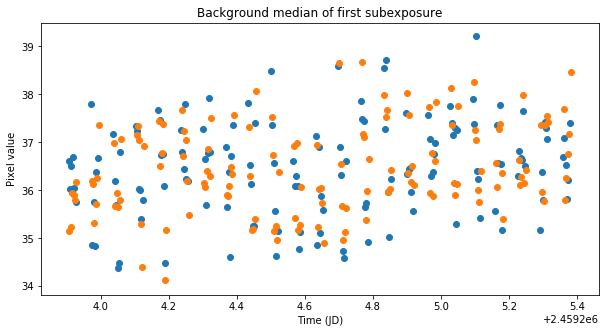

In [19]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs2[forward])
plt.scatter(Ts[~forward], BGs2[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

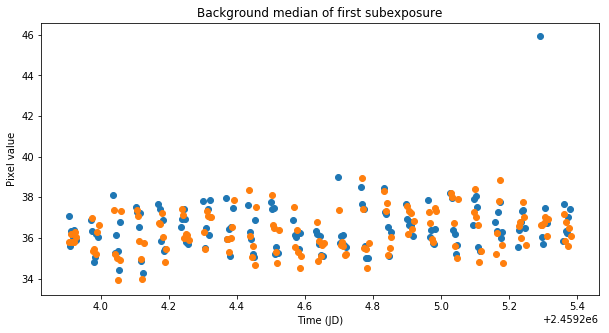

In [20]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs3[forward])
plt.scatter(Ts[~forward], BGs3[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

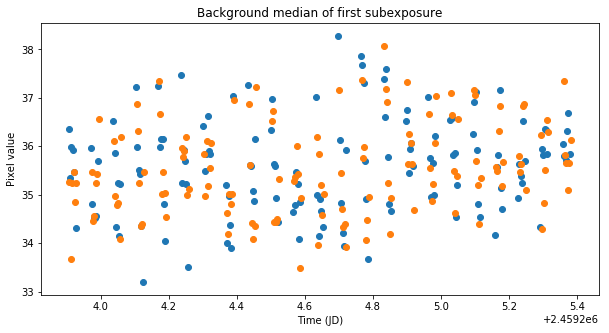

In [21]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs4[forward])
plt.scatter(Ts[~forward], BGs4[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

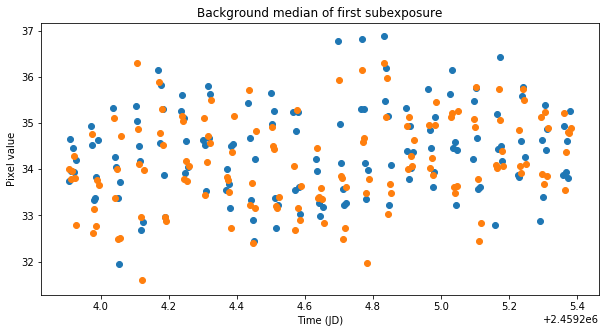

In [22]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs5[forward])
plt.scatter(Ts[~forward], BGs5[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

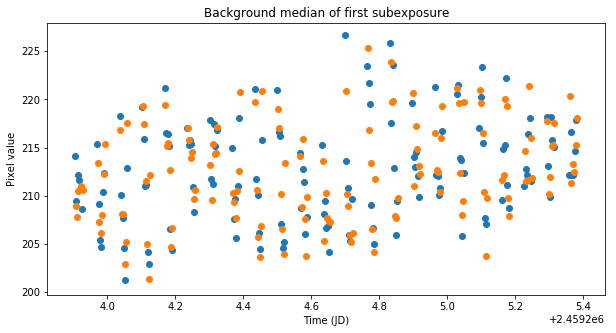

In [23]:
plt.title('Background median of first subexposure')
plt.scatter(Ts[forward], BGs0[forward] + BGs1[forward] + BGs2[forward] + BGs3[forward] + BGs4[forward]+ BGs5[forward])
plt.scatter(Ts[~forward], BGs0[~forward] + BGs1[~forward] + BGs2[~forward] + BGs3[~forward] + BGs4[~forward]+ BGs5[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

Text(0,0.5,'Pixel value')

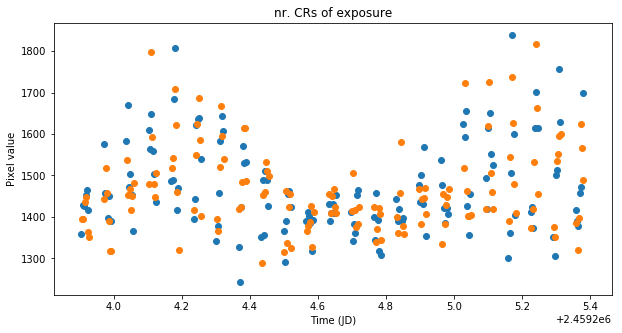

In [24]:
plt.title('nr. CRs of exposure')
plt.scatter(Ts[forward], CRs[forward])
plt.scatter(Ts[~forward], CRs[~forward])
plt.xlabel('Time (JD)')
plt.ylabel('Pixel value')

In [27]:
np.savetxt('HAT-P-2b-BG0.txt', (Ts, BGs0))
np.savetxt('HAT-P-2b-BG1.txt', (Ts, BGs1))
np.savetxt('HAT-P-2b-BG2.txt', (Ts, BGs2))
np.savetxt('HAT-P-2b-BG3.txt', (Ts, BGs3))
np.savetxt('HAT-P-2b-BG4.txt', (Ts, BGs4))
np.savetxt('HAT-P-2b-BG5.txt', (Ts, BGs5))
np.savetxt('HAT-P-2b-CRs.txt', (Ts, CRs))

Text(0.5,0,'Time (JD)')

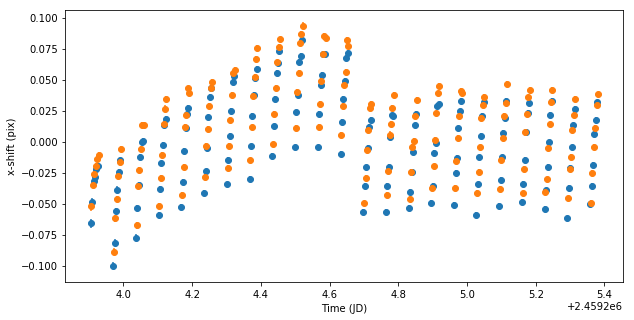

In [62]:
plt.errorbar(Ts[forward], refshifts[forward], yerr=refshifterrs[forward], fmt='o')
plt.errorbar(Ts[~forward], refshifts[~forward], yerr=refshifterrs[forward], fmt='o')
np.savetxt('HAT-P-2b-x-pos.txt', (Ts, refshifts, refshifterrs))
plt.ylabel('x-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

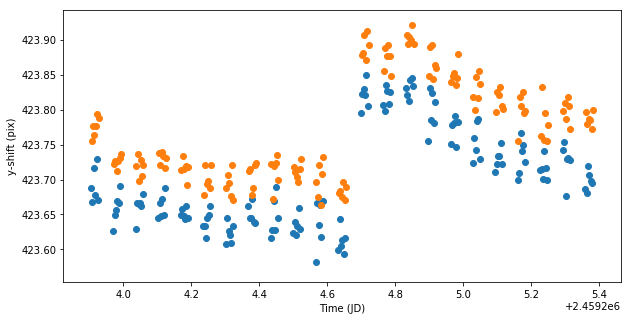

In [63]:
plt.scatter(Ts[forward], ypixs[:,0][forward])
plt.scatter(Ts[~forward], ypixs[:,-1][~forward]+3)

plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

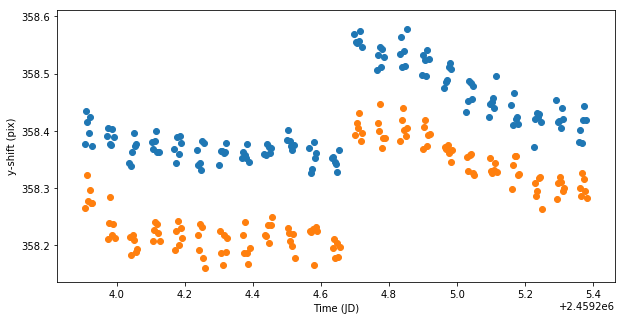

In [64]:
plt.scatter(Ts[forward], ypixs[:,1][forward])
plt.scatter(Ts[~forward], ypixs[:,-2][~forward]+4)
plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

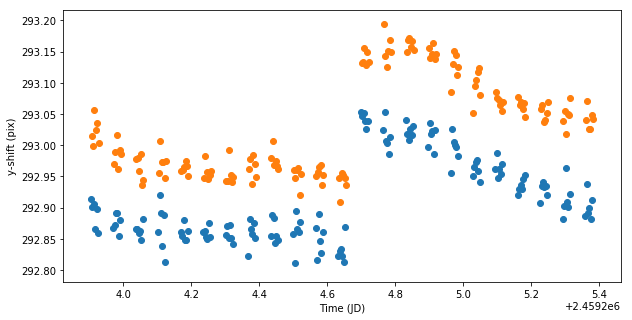

In [65]:
plt.scatter(Ts[forward], ypixs[:,2][forward])
plt.scatter(Ts[~forward], ypixs[:,-3][~forward]+5.5)
plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

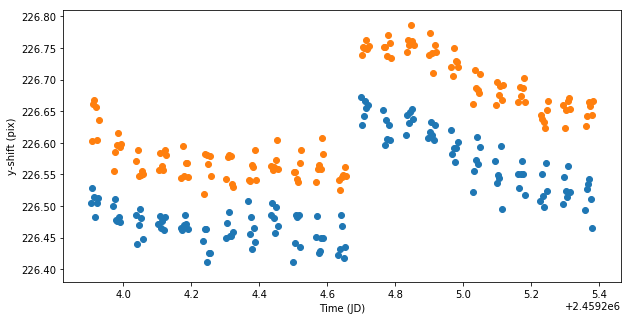

In [66]:
plt.scatter(Ts[forward], ypixs[:,3][forward])
plt.scatter(Ts[~forward], ypixs[:,-4][~forward]+5.5)
plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

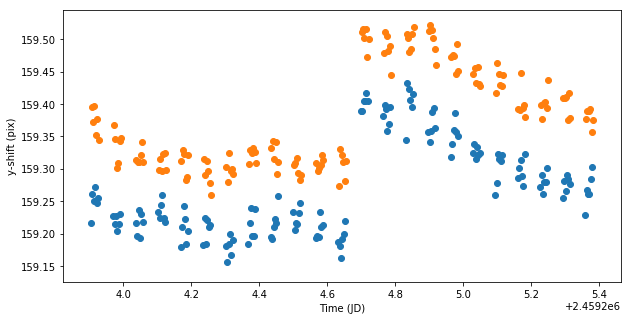

In [67]:
plt.scatter(Ts[forward], ypixs[:,4][forward])
plt.scatter(Ts[~forward], ypixs[:,-5][~forward]+4.3)
plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

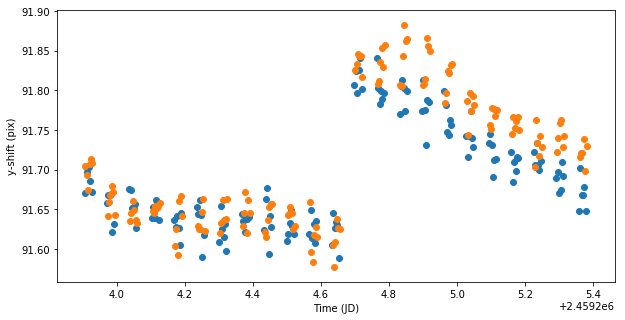

In [68]:
plt.scatter(Ts[forward], ypixs[:,5][forward])
plt.scatter(Ts[~forward], ypixs[:,-6][~forward]+3)
plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')

Text(0.5,0,'Time (JD)')

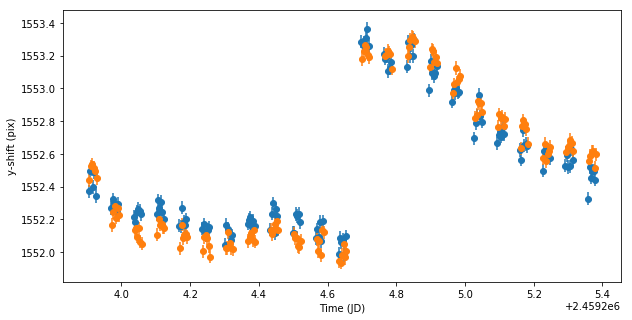

In [69]:
ypix_err_avg = np.sqrt(np.sum(np.array(ypix_errs)**2, axis=1))

plt.errorbar(Ts[forward], np.sum(ypixs, axis=1)[forward], yerr= ypix_err_avg[forward], fmt='o')
plt.errorbar(Ts[~forward], np.sum(ypixs, axis=1)[~forward]+25, yerr=ypix_err_avg[forward], fmt='o')
np.savetxt('HAT-P-2b-y-pos.txt', (Ts, np.sum(ypixs, axis=1), ypix_err_avg))
plt.ylabel('y-shift (pix)')
plt.xlabel('Time (JD)')